# Analising tweets about Ja Morant
## author: Daniel Jarzymowski

# 1. Introduction

Aim of this project is to verify influence of the Ja Morant's gun incident on opinions of tweets users. The gun incident has taken place on 4th of March, when Ja Morant showed gun on rell on Instagram being in the place, in which guns vere forbidden. So how the twitter users responded to this?

# 2. Getting data

In this notebook I upload data from csv file, which was created in another notebook( Tweets scrapping.ipynb) by scrapping data using snscrape package(notebook with data scrapping is in the same repository).

## 2.1 Imports

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image
from wordcloud import WordCloud
import re
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.preprocessing import MinMaxScaler
import text2emotion as te
import emoji

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\danio\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\danio\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\danio\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## 2.2 Uploading data

In [2]:
df = pd.read_csv('tweets.csv', index_col = 'Unnamed: 0')

In [3]:
df

,Datetime,Tweet Id,Text,Language
0,2023-01-14 23:59:19+00:00,1614411874761641989,SHOWTIME!! 🏀 \n@memgrizz at @Pacers \nGrizzlie...,en
1,2023-01-14 23:58:46+00:00,1614411732503478274,Eu e ja morant melhor dupla da história,pt
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st NBA game! Let’s go JA #12 @memgrizz @JaMor...,en
3,2023-01-14 23:55:09+00:00,1614410823883001856,You're a truly good man @JaMorant . Way to mak...,en
4,2023-01-14 23:55:07+00:00,1614410816174055424,@schleepymensch @JaMorant @CGBBURNER @campayne...,en
...,...,...,...,...
159995,2023-05-01 00:06:08+00:00,1652826702676934659,o amor da minha da minha tem nome.. ja morant,pt
159996,2023-05-01 00:06:03+00:00,1652826680551931904,@celticsturkiye_ kyrie... kemba... ja morant...,nl
159997,2023-05-01 00:05:35+00:00,1652826563870687239,Grizzlies' Ja Morant reveals new goals after L...,en
159998,2023-05-01 00:03:35+00:00,1652826061208530951,Ja Morant'i takima almam abi ne takim kurmasi ya,tr


# 3. Preprocessing

## 3.1 Getting only tweets in english

In [4]:
df = df[df['Language'] == 'en']
df

,Datetime,Tweet Id,Text,Language
0,2023-01-14 23:59:19+00:00,1614411874761641989,SHOWTIME!! 🏀 \n@memgrizz at @Pacers \nGrizzlie...,en
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st NBA game! Let’s go JA #12 @memgrizz @JaMor...,en
3,2023-01-14 23:55:09+00:00,1614410823883001856,You're a truly good man @JaMorant . Way to mak...,en
4,2023-01-14 23:55:07+00:00,1614410816174055424,@schleepymensch @JaMorant @CGBBURNER @campayne...,en
6,2023-01-14 23:51:57+00:00,1614410019641987072,@JaMorant Hey ja,en
...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,@HiveCards @NoFloCards @PapayonTrading @CardsE...,en
159988,2023-05-01 00:15:41+00:00,1652829106919153669,Grizzlies' Ja Morant reveals new goals after L...,en
159993,2023-05-01 00:08:20+00:00,1652827254206898177,I’m bout to go in food Iion and I see this lil...,en
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"Felt exactly the same way, Fox is a fucking be...",en


## 3.2 Removing words with @

In [5]:
def remove_words_with_at_symbol(text):
    words = text.split()
    filtered_words = [word for word in words if "@" not in word]
    result = " ".join(filtered_words)
    return result

In [6]:
df['Text'] = df['Text'].apply(remove_words_with_at_symbol)

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\2570792408.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Text'] = df['Text'].apply(remove_words_with_at_symbol)


## 3.3 Removing url adresses

Some tweets contain url adresses, which won't be useful in the sentiment analises, so I delete them.

In [7]:
for i in df.index:
    df.at[i,'Text'] = re.sub(r'http\S+', '',df.at[i,'Text']) 

In [8]:
df

,Datetime,Tweet Id,Text,Language
0,2023-01-14 23:59:19+00:00,1614411874761641989,SHOWTIME!! 🏀 at Grizzlies Starters: Ja Morant ...,en
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st NBA game! Let’s go JA #12,en
3,2023-01-14 23:55:09+00:00,1614410823883001856,You're a truly good man . Way to make it right...,en
4,2023-01-14 23:55:07+00:00,1614410816174055424,Lol nah but Ja ain’t gassing him rn.,en
6,2023-01-14 23:51:57+00:00,1614410019641987072,Hey ja,en
...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,Jordan Poole Silver Select 10 - $110 shipped A...,en
159988,2023-05-01 00:15:41+00:00,1652829106919153669,Grizzlies' Ja Morant reveals new goals after L...,en
159993,2023-05-01 00:08:20+00:00,1652827254206898177,I’m bout to go in food Iion and I see this lil...,en
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"Felt exactly the same way, Fox is a fucking be...",en


## 3.4 Changing dates from objects to datetime format

I will be operating on dates, so to make it easier, I change format of Datetime column to Datetime using method from pandas.

In [9]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\2099222771.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Datetime'] = pd.to_datetime(df['Datetime'])


# 4. Analising using nltk vader

I create copy of the main dataframe to change only copy, not the original dataframe.

In [10]:
df1 = df.copy()
df1

,Datetime,Tweet Id,Text,Language
0,2023-01-14 23:59:19+00:00,1614411874761641989,SHOWTIME!! 🏀 at Grizzlies Starters: Ja Morant ...,en
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st NBA game! Let’s go JA #12,en
3,2023-01-14 23:55:09+00:00,1614410823883001856,You're a truly good man . Way to make it right...,en
4,2023-01-14 23:55:07+00:00,1614410816174055424,Lol nah but Ja ain’t gassing him rn.,en
6,2023-01-14 23:51:57+00:00,1614410019641987072,Hey ja,en
...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,Jordan Poole Silver Select 10 - $110 shipped A...,en
159988,2023-05-01 00:15:41+00:00,1652829106919153669,Grizzlies' Ja Morant reveals new goals after L...,en
159993,2023-05-01 00:08:20+00:00,1652827254206898177,I’m bout to go in food Iion and I see this lil...,en
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"Felt exactly the same way, Fox is a fucking be...",en


I create SentimentIntensityAnalyzer object ot get scores of each type, then I create new columns which contains this results.

In [11]:
sid = SentimentIntensityAnalyzer()
for i in df1.index:
    df1.at[i,'Text'] = df1.at[i,'Text'].lower()
    ss = sid.polarity_scores(df1.at[i,'Text'])
    df1.at[i, 'Negative'] = ss['neg']
    df1.at[i, 'Neutral'] = ss['neu']
    df1.at[i, 'Positive'] = ss['pos']
    df1.at[i, 'Compound'] = ss['compound']

In [12]:
df1.head()

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.000,0.888,0.112,0.5080
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st nba game! let’s go ja #12,en,0.000,1.000,0.000,0.0000
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.000,0.633,0.367,0.7003
4,2023-01-14 23:55:07+00:00,1614410816174055424,lol nah but ja ain’t gassing him rn.,en,0.132,0.659,0.209,0.1779
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.000,1.000,0.000,0.0000


I will classify tweet as negative if Negative value from nltk vader wil be higher than 0.6


In [13]:
df1[df1['Negative'] > 0.6]

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound
235,2023-01-14 18:18:58+00:00,1614326221088915457,oh no! 😂,en,0.714,0.286,0.0,-0.3595
568,2023-01-14 04:43:36+00:00,1614121027277131780,crazy,en,1.000,0.000,0.0,-0.3400
625,2023-01-14 02:44:22+00:00,1614091020588687360,damn ja 😖 this hurts,en,0.744,0.256,0.0,-0.7003
803,2023-01-13 21:41:57+00:00,1614014914368098327,say you hate niggas without saying you hate ni...,en,0.709,0.291,0.0,-0.9042
909,2023-01-13 19:45:42+00:00,1613985660288880640,🔥🔥🔥 tough!,en,0.642,0.358,0.0,-0.2003
...,...,...,...,...,...,...,...,...
158679,2023-05-02 18:25:55+00:00,1653465857719189517,dirty ??😂,en,0.765,0.235,0.0,-0.5040
158699,2023-05-02 18:20:49+00:00,1653464577974173698,no cap 😂,en,0.688,0.312,0.0,-0.2960
159227,2023-05-02 02:51:24+00:00,1653230679856132098,ja morant such a fake ass gangster,en,0.623,0.377,0.0,-0.7650
159404,2023-05-01 22:17:14+00:00,1653161683110486016,damn,en,1.000,0.000,0.0,-0.4019


I will classify tweet as positive if Positive value from nltk vader wil be higher than 0.6

## 4.1 Bag of words of all tweets

To get the most frequent words from all tweets I tokenize each tweet and then delete interpuction and parts of sentences, which could disturb results of sentiment analises.

In [14]:
all_words = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df1.index:
    sentence = re.sub(r'[^\w\s]', '', df1.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words[word] = all_words.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

Here are twenty most common words in all tweets. Most of the words seem neutral, but the word gun has appeared in this dataframe which might suggets that this incident had some impact

In [15]:
bow_df = pd.DataFrame.from_dict(all_words, orient = 'index')
bow_df.sort_values(0, ascending=False).head(20)

,0
ja,95475
morant,87604
i,17948
be,15648
nba,12603
gun,9929
was,8616
are,7419
have,7050
what,6770


Plotting words cloud

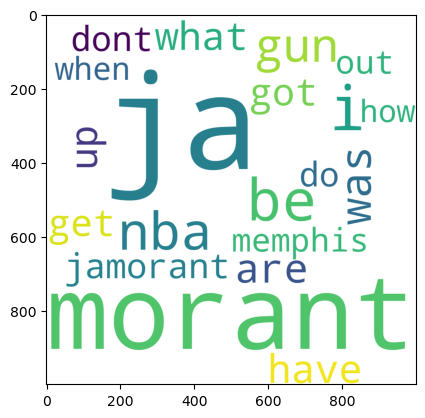

In [16]:
wc = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words)
plt.imshow(wc)

## 4.2  Analising positive tweets

Here I get tweets, which I decide to classify as positive.

In [17]:
df_positive = df1[df1['Positive'] > 0.6]
df_positive

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound
218,2023-01-14 18:48:35+00:00,1614333672353562626,so awesome. 💙🐻,en,0.0,0.313,0.687,0.6590
542,2023-01-14 06:00:14+00:00,1614140312347099136,beautiful family,en,0.0,0.204,0.796,0.5994
575,2023-01-14 04:18:49+00:00,1614114790036865026,smarter than u,en,0.0,0.250,0.750,0.4588
736,2023-01-13 23:34:05+00:00,1614043132877832192,do better,en,0.0,0.256,0.744,0.4404
737,2023-01-13 23:33:41+00:00,1614043033690951680,do better,en,0.0,0.256,0.744,0.4404
...,...,...,...,...,...,...,...,...
158803,2023-05-02 17:21:31+00:00,1653449654573334546,definitely looking like ja morant😂,en,0.0,0.366,0.634,0.6369
159058,2023-05-02 13:19:20+00:00,1653388705124564993,i love you 💕,en,0.0,0.192,0.808,0.6369
159076,2023-05-02 12:18:54+00:00,1653373495949000708,cool,en,0.0,0.000,1.000,0.3182
159495,2023-05-01 19:50:27+00:00,1653124743376019478,happy birthday bubba!!!!,en,0.0,0.291,0.709,0.7067


### 4.2.1 Words cloud of positive tweets

In [18]:
all_words_pos = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos[word] = all_words_pos.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

Here are most common words in tweet, which I decided to classify as positive. My choice seems to be correct as it can be easily seen that really positive words are indeed dominating here.

In [19]:
bow_df_pos = pd.DataFrame.from_dict(all_words_pos, orient = 'index')
bow_df_pos.sort_values(0, ascending=False).head(20)

,0
ja,170
love,165
i,127
morant,126
good,86
lol,73
great,51
awesome,46
lmao,44
better,39


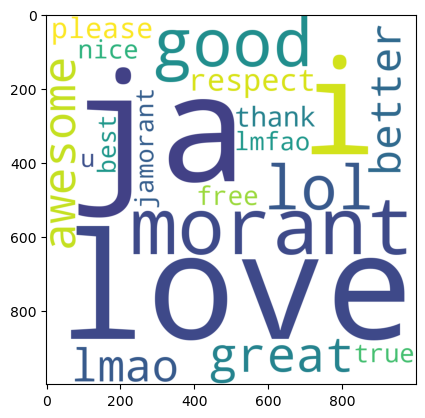

In [20]:
wc_pos = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos)
plt.imshow(wc_pos)

There are not any surprises. All of the words, which appeared in this word cloud are expected to appear in positive opinoins about young and talented nba player.

## 4.3 Analising negative tweets

Here I get only tweets, which I decided to classify as negative.

In [21]:
df_negative = df1[df1['Negative'] > 0.6]
df_negative

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound
235,2023-01-14 18:18:58+00:00,1614326221088915457,oh no! 😂,en,0.714,0.286,0.0,-0.3595
568,2023-01-14 04:43:36+00:00,1614121027277131780,crazy,en,1.000,0.000,0.0,-0.3400
625,2023-01-14 02:44:22+00:00,1614091020588687360,damn ja 😖 this hurts,en,0.744,0.256,0.0,-0.7003
803,2023-01-13 21:41:57+00:00,1614014914368098327,say you hate niggas without saying you hate ni...,en,0.709,0.291,0.0,-0.9042
909,2023-01-13 19:45:42+00:00,1613985660288880640,🔥🔥🔥 tough!,en,0.642,0.358,0.0,-0.2003
...,...,...,...,...,...,...,...,...
158679,2023-05-02 18:25:55+00:00,1653465857719189517,dirty ??😂,en,0.765,0.235,0.0,-0.5040
158699,2023-05-02 18:20:49+00:00,1653464577974173698,no cap 😂,en,0.688,0.312,0.0,-0.2960
159227,2023-05-02 02:51:24+00:00,1653230679856132098,ja morant such a fake ass gangster,en,0.623,0.377,0.0,-0.7650
159404,2023-05-01 22:17:14+00:00,1653161683110486016,damn,en,1.000,0.000,0.0,-0.4019


### 4.3.1 Words cloud of negative tweets

In [22]:
all_words_neg = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg[word] = all_words_neg.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

Here are the most frequent words in negative tweets. As we can see there are many quite rough words and people didn't hesitate to write what they think.

In [23]:
bow_df_neg = pd.DataFrame.from_dict(all_words_neg, orient = 'index')
bow_df_neg.sort_values(0, ascending=False).head(20)

,0
ja,344
morant,329
dumb,159
ass,145
stupid,85
fuck,81
hell,72
damn,69
shit,68
wrong,49


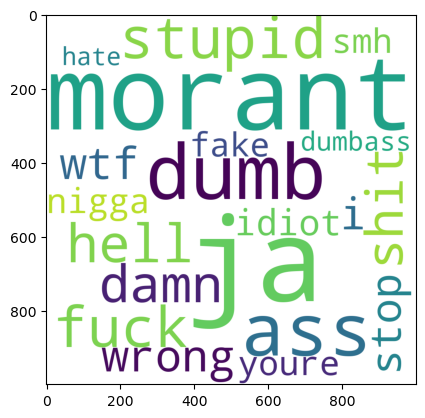

In [24]:
wc_neg = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg)
plt.imshow(wc_neg)

As we can see, in negative tweets there are many strong words. This shows that there are people who have really bad opinion about this player.

## 4.4 Summary of words clouds

We have seen the most common words in all tweets, positive tweets and negative tweets. Words appearing in positive and negative tweets are not suprising. But these are post from the whole period of time. Now my goal is to analise how opinions in tweets were before and after the gun incident. What where the most common words in both positive and negative tweets in both of these periods.

## 4.5 Analising opinions in time

First I will analise all tweets in time by calculating avarage score from each day.

In [25]:
df1.head()

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.000,0.888,0.112,0.5080
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st nba game! let’s go ja #12,en,0.000,1.000,0.000,0.0000
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.000,0.633,0.367,0.7003
4,2023-01-14 23:55:07+00:00,1614410816174055424,lol nah but ja ain’t gassing him rn.,en,0.132,0.659,0.209,0.1779
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.000,1.000,0.000,0.0000


Now I will create columns with types of tweets and score based on result from vader sentiment.

In [26]:
df1['Type'] = df1[['Positive','Negative', 'Neutral']].idxmax(axis=1)
df1['Score'] = df1[['Positive','Negative', 'Neutral']].max(axis=1)
df1.head()

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.000,0.888,0.112,0.5080,Neutral,0.888
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st nba game! let’s go ja #12,en,0.000,1.000,0.000,0.0000,Neutral,1.000
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.000,0.633,0.367,0.7003,Neutral,0.633
4,2023-01-14 23:55:07+00:00,1614410816174055424,lol nah but ja ain’t gassing him rn.,en,0.132,0.659,0.209,0.1779,Neutral,0.659
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.000,1.000,0.000,0.0000,Neutral,1.000


In [27]:
df1['Type'].value_counts()

Neutral     116967
Negative      3081
Positive      2753
Name: Type, dtype: int64

As we can see most of the tweets are neutral. If we look into score column, it will be impossible to differ each type of tweet only by using this column. To solve this problem, I will use min max scaler to scale score of each type to scales, which will allow to differ type in easy way.

In [28]:
negative_df = df1[df1['Type'] == 'Negative']
neutral_df = df1[df1['Type'] == 'Neutral']
positive_df = df1[df1['Type'] == 'Positive']

In [29]:
negative_df['Score'].describe()

count    3081.000000
mean        0.590840
std         0.128579
min         0.341000
25%         0.517000
50%         0.556000
75%         0.642000
max         1.000000
Name: Score, dtype: float64

As we can see mininal score of negative tweets are 0 which is okay, but maximal is 1, which is not okay, because this score should be seen only for positive tweets.

In [30]:
neutral_df['Score'].describe()

count    116967.000000
mean          0.826405
std           0.155449
min           0.340000
25%           0.708000
50%           0.829000
75%           1.000000
max           1.000000
Name: Score, dtype: float64

In scores of neutral tweets, we have the same problem.

In [31]:
positive_df['Score'].describe()

count    2753.000000
mean        0.622725
std         0.141507
min         0.335000
25%         0.524000
50%         0.583000
75%         0.697000
max         1.000000
Name: Score, dtype: float64

As we can see now it will be impossible to differ type of tweets basing on scores. So now I will use MinMax scaler to change that.

In [32]:
scaler_negative = MinMaxScaler(feature_range=(0, 0.35))
negative_df['Score'] = scaler_negative.fit_transform(negative_df[['Score']])

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\3344083336.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_df['Score'] = scaler_negative.fit_transform(negative_df[['Score']])


In [33]:
negative_df['Score'].describe()

count    3081.000000
mean        0.132692
std         0.068289
min         0.000000
25%         0.093475
50%         0.114188
75%         0.159863
max         0.350000
Name: Score, dtype: float64

Now we see that distribution of negative scores allow to easily differ it from other types.

In [34]:
scaler_neutral = MinMaxScaler(feature_range=(0.35, 0.65))
neutral_df['Score'] = scaler_neutral.fit_transform(neutral_df[['Score']])

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\1641694652.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neutral_df['Score'] = scaler_neutral.fit_transform(neutral_df[['Score']])


In [35]:
neutral_df['Score'].describe()

count    116967.000000
mean          0.571093
std           0.070658
min           0.350000
25%           0.517273
50%           0.572273
75%           0.650000
max           0.650000
Name: Score, dtype: float64

In [36]:
scaler_positive = MinMaxScaler(feature_range=(0.65, 1))
positive_df['Score'] = scaler_positive.fit_transform(positive_df[['Score']])

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\3154478304.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Score'] = scaler_positive.fit_transform(positive_df[['Score']])


In [37]:
positive_df['Score'].describe()

count    2753.000000
mean        0.801434
std         0.074477
min         0.650000
25%         0.749474
50%         0.780526
75%         0.840526
max         1.000000
Name: Score, dtype: float64

As we can see, after scaling, it is very easy to quickly classify tweets basing only on score.

Now I merge all sclalled datframes to one dataframe on which I will be working.

In [38]:
scaled_df1 = pd.concat([positive_df, neutral_df, negative_df], ignore_index=True)

In [39]:
scaled_df1.head()

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
0,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.0,0.400,0.600,0.6696,Positive,0.789474
1,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.0,0.421,0.579,0.6705,Positive,0.778421
2,2023-01-14 22:15:15+00:00,1614385682864037888,biggest fan! #memphisgrizzlies,en,0.0,0.436,0.564,0.3802,Positive,0.770526
3,2023-01-14 19:58:32+00:00,1614351277089226754,happy my favorite guard makes it in there,en,0.0,0.472,0.528,0.7717,Positive,0.751579
4,2023-01-14 19:23:17+00:00,1614342405267783681,i just love ja morant he so handsome 😩🥰,en,0.0,0.419,0.581,0.8525,Positive,0.779474


In [40]:
scaled_df1['Type'].value_counts()

Neutral     116967
Negative      3081
Positive      2753
Name: Type, dtype: int64

As we can see now it is easily to differ types of tweet

### 4.5.1 Agregating score of all tweets to get mean score for each day

Now I use groupby method to group data by day to get mean score.

In [41]:
df1_grouped = scaled_df1[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.581174
2023-01-02 00:00:00+00:00,0.590122
2023-01-03 00:00:00+00:00,0.586102
2023-01-04 00:00:00+00:00,0.595834
2023-01-05 00:00:00+00:00,0.581784
...,...
2023-05-10 00:00:00+00:00,0.568548
2023-05-11 00:00:00+00:00,0.567972
2023-05-12 00:00:00+00:00,0.575689


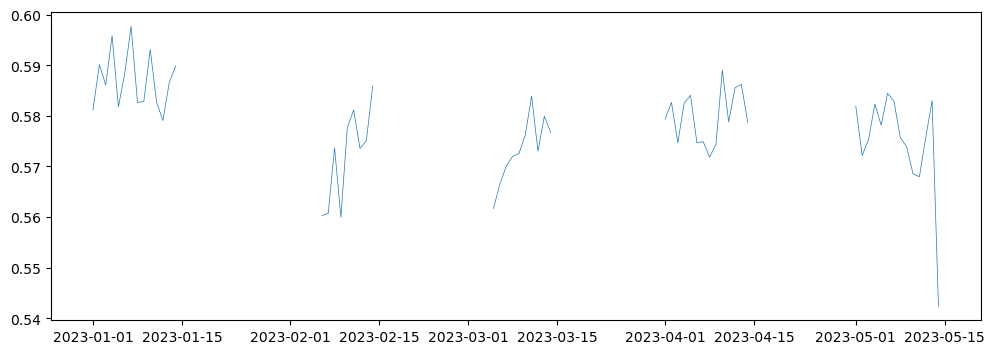

In [111]:
fig, ax = plt.subplots(figsize=(12, 4))
plt.plot(df1_grouped.index, df1_grouped['Score'], linewidth=0.5)

As we can see in each of the five periods avarage scores of tweets are in the neutral scores. This could be caused by the huge amount of neutral tweets. But lets see what will we get only from positive and negative tweets.

### 4.5.2 Agregating score of positive and negative tweets to get mean score for each day

Here I get tweets, which type is different than neutral.

In [43]:
df_pn = scaled_df1[scaled_df1['Type'] != 'Neutral']
df_pn

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
0,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.000,0.400,0.600,0.6696,Positive,0.789474
1,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.000,0.421,0.579,0.6705,Positive,0.778421
2,2023-01-14 22:15:15+00:00,1614385682864037888,biggest fan! #memphisgrizzlies,en,0.000,0.436,0.564,0.3802,Positive,0.770526
3,2023-01-14 19:58:32+00:00,1614351277089226754,happy my favorite guard makes it in there,en,0.000,0.472,0.528,0.7717,Positive,0.751579
4,2023-01-14 19:23:17+00:00,1614342405267783681,i just love ja morant he so handsome 😩🥰,en,0.000,0.419,0.581,0.8525,Positive,0.779474
...,...,...,...,...,...,...,...,...,...,...
122796,2023-05-02 01:55:47+00:00,1653216686370177026,injured star theory 5-0 memphis - no ja morant...,en,0.590,0.410,0.000,-0.9834,Negative,0.132246
122797,2023-05-01 22:17:14+00:00,1653161683110486016,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122798,2023-05-01 19:56:27+00:00,1653126254944481281,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122799,2023-05-01 18:43:38+00:00,1653107929103360005,i know real niggas gone miss ya 😂,en,0.500,0.500,0.000,-0.4588,Negative,0.084446


In [44]:
df_pn['Type'].value_counts()

Negative    3081
Positive    2753
Name: Type, dtype: int64

Here I group data using the same method as before.

In [45]:
df1_pn_grouped = df_pn[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_pn_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.614276
2023-01-02 00:00:00+00:00,0.704156
2023-01-03 00:00:00+00:00,0.642106
2023-01-04 00:00:00+00:00,0.626646
2023-01-05 00:00:00+00:00,0.590288
...,...
2023-05-10 00:00:00+00:00,0.501854
2023-05-11 00:00:00+00:00,0.505291
2023-05-12 00:00:00+00:00,0.753017


Text(-0.15, 0.1, 'Negative')

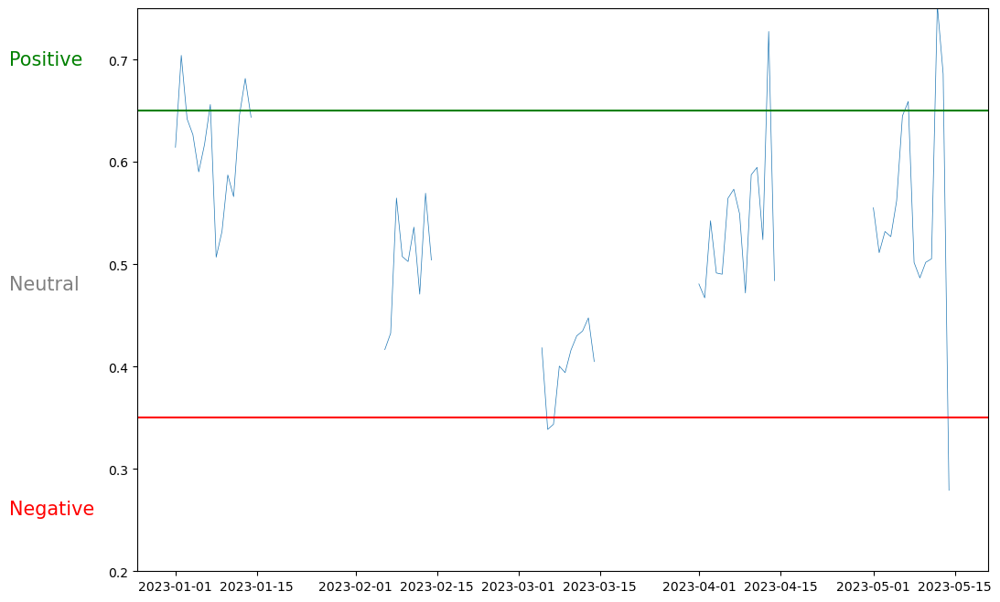

In [140]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_pn_grouped.index, df1_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

Now we can see, that there are huge difference, so it is good idea to analise only positive end negative tweets. There were to many neutral tweets and they had to much impact on mean value.

## 4.6 Analising  first period (from 2023-01-01 to 2023-01-15)

Now I use the fact, that I changed type of columns with date to datetime, which allows me to use such a simple way to get tweets from given period of time.

In [47]:
mask1 = (df_pn['Datetime'] > '2023-01-01') &(df_pn['Datetime'] < '2023-01-15') # mask with condition for chossing tweets
df_period1 = df_pn[mask1]
df_period1

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
0,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.000,0.400,0.600,0.6696,Positive,0.789474
1,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.000,0.421,0.579,0.6705,Positive,0.778421
2,2023-01-14 22:15:15+00:00,1614385682864037888,biggest fan! #memphisgrizzlies,en,0.000,0.436,0.564,0.3802,Positive,0.770526
3,2023-01-14 19:58:32+00:00,1614351277089226754,happy my favorite guard makes it in there,en,0.000,0.472,0.528,0.7717,Positive,0.751579
4,2023-01-14 19:23:17+00:00,1614342405267783681,i just love ja morant he so handsome 😩🥰,en,0.000,0.419,0.581,0.8525,Positive,0.779474
...,...,...,...,...,...,...,...,...,...,...
120096,2023-01-01 02:12:34+00:00,1609371976795144195,ball fake kingskiii 👑 🥽 x,en,0.608,0.392,0.000,-0.4767,Negative,0.141806
120097,2023-01-01 01:50:14+00:00,1609366355136110593,sick af! enjoy the night 🤟,en,0.367,0.306,0.327,-0.1007,Negative,0.013809
120098,2023-01-01 01:36:06+00:00,1609362798168907777,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
120099,2023-01-01 00:16:09+00:00,1609342679258927105,yeah let’s free a violent criminal. sounds legit!,en,0.472,0.186,0.342,-0.4753,Negative,0.069575


### 4.6.1 Analising positive tweets

Now I get only positive tweets from dataframe prepared in previous step.

In [48]:
df_positive_p1 = df_period1[df_period1['Type'] ==  'Positive']
df_positive_p1

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
0,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.000,0.400,0.600,0.6696,Positive,0.789474
1,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.000,0.421,0.579,0.6705,Positive,0.778421
2,2023-01-14 22:15:15+00:00,1614385682864037888,biggest fan! #memphisgrizzlies,en,0.000,0.436,0.564,0.3802,Positive,0.770526
3,2023-01-14 19:58:32+00:00,1614351277089226754,happy my favorite guard makes it in there,en,0.000,0.472,0.528,0.7717,Positive,0.751579
4,2023-01-14 19:23:17+00:00,1614342405267783681,i just love ja morant he so handsome 😩🥰,en,0.000,0.419,0.581,0.8525,Positive,0.779474
...,...,...,...,...,...,...,...,...,...,...
996,2023-01-01 01:16:44+00:00,1609357923544666113,go mom! i hope you win 🙏🏽 i know how much you ...,en,0.000,0.427,0.573,0.9196,Positive,0.775263
997,2023-01-01 01:16:29+00:00,1609357864316944384,ong free thug ⛓️🔓,en,0.000,0.476,0.524,0.5106,Positive,0.749474
998,2023-01-01 01:16:17+00:00,1609357810948804608,i wish i could shoot like ja morant,en,0.226,0.283,0.491,0.4215,Positive,0.732105
999,2023-01-01 00:52:38+00:00,1609351859709575168,ok buddy,en,0.000,0.312,0.688,0.2960,Positive,0.835789


####  4.6.1a Bag of words

In [49]:
all_words_pos_p1 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive_p1.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive_p1.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos_p1[word] = all_words_pos_p1.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [50]:
bow_pos_df_p1 = pd.DataFrame.from_dict(all_words_pos_p1, orient = 'index')
bow_pos_df_p1.sort_values(0, ascending=False).head(20)

,0
love,175
ja,170
i,120
morant,96
good,85
great,55
lol,51
awesome,49
respect,40
man,33


There aren't any surprises here, typical positive words.

In [51]:
wc_pos_p1 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos_p1)

I only build the words cloud, but it will be plotted at the end, with other words clouds, which will make it easy to compare them.

### 4.6.2 Analising negative tweets

Here I get only negatives tweets.

In [52]:
df_negative_p1 = df_period1[df_period1['Type'] ==  'Negative']
df_negative_p1

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
119720,2023-01-14 18:18:58+00:00,1614326221088915457,oh no! 😂,en,0.714,0.286,0.000,-0.3595,Negative,0.198103
119721,2023-01-14 16:11:36+00:00,1614294168997699586,ja morant ruining the game ffs,en,0.592,0.408,0.000,-0.7003,Negative,0.133308
119722,2023-01-14 15:58:18+00:00,1614290822379491329,bro wtf is this,en,0.559,0.441,0.000,-0.5859,Negative,0.115781
119723,2023-01-14 04:43:36+00:00,1614121027277131780,crazy,en,1.000,0.000,0.000,-0.3400,Negative,0.350000
119724,2023-01-14 02:44:22+00:00,1614091020588687360,damn ja 😖 this hurts,en,0.744,0.256,0.000,-0.7003,Negative,0.214036
...,...,...,...,...,...,...,...,...,...,...
120096,2023-01-01 02:12:34+00:00,1609371976795144195,ball fake kingskiii 👑 🥽 x,en,0.608,0.392,0.000,-0.4767,Negative,0.141806
120097,2023-01-01 01:50:14+00:00,1609366355136110593,sick af! enjoy the night 🤟,en,0.367,0.306,0.327,-0.1007,Negative,0.013809
120098,2023-01-01 01:36:06+00:00,1609362798168907777,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
120099,2023-01-01 00:16:09+00:00,1609342679258927105,yeah let’s free a violent criminal. sounds legit!,en,0.472,0.186,0.342,-0.4753,Negative,0.069575


#### 4.6.2a Bag of words

In [53]:
all_words_neg_p1 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative_p1.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative_p1.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg_p1[word] = all_words_neg_p1.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [54]:
bow_neg_df_p1 = pd.DataFrame.from_dict(all_words_neg_p1, orient = 'index')
bow_neg_df_p1.sort_values(0, ascending=False).head(20)

,0
ja,44
ass,41
shit,39
morant,38
i,27
damn,22
stop,21
hell,18
u,17
crazy,14


Here we can see typical negative words, which can be said about nba player. I assume, that more interesting words will appear in the third period.

In [55]:
wc_neg_p1 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg_p1)

### 4.6.3 Plot in time

Every time I use the same method to group data and plot it in time, so I won't be desribing these steps in the future.

In [56]:
df1_p1_pn_grouped = df_period1[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_p1_pn_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.614276
2023-01-02 00:00:00+00:00,0.704156
2023-01-03 00:00:00+00:00,0.642106
2023-01-04 00:00:00+00:00,0.626646
2023-01-05 00:00:00+00:00,0.590288
2023-01-06 00:00:00+00:00,0.617104
2023-01-07 00:00:00+00:00,0.656152
2023-01-08 00:00:00+00:00,0.506897
2023-01-09 00:00:00+00:00,0.532029


Text(-0.15, 0.1, 'Negative')

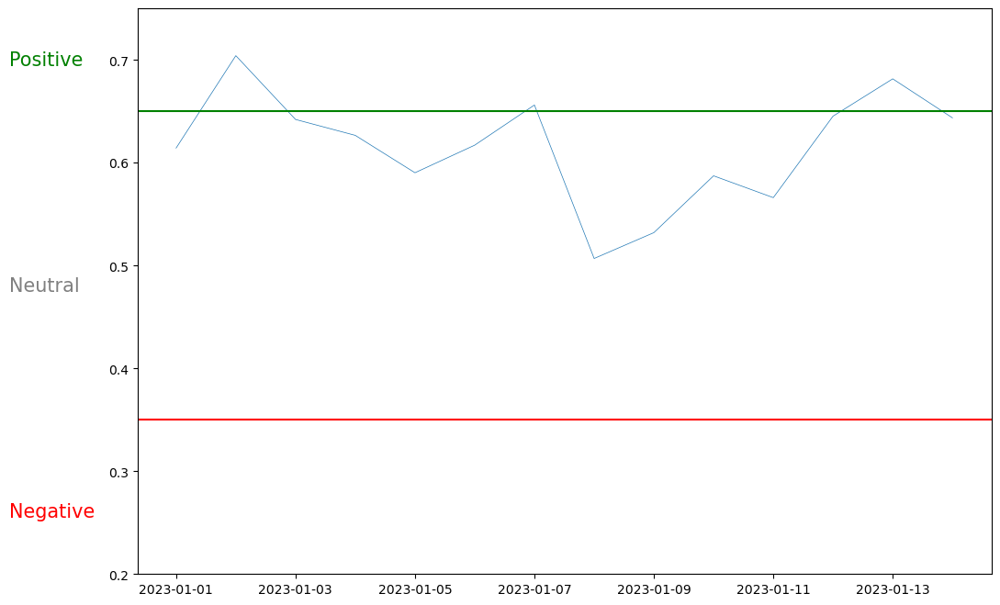

In [143]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_p1_pn_grouped.index, df1_p1_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

We can see, that in this period opinions oscilate near neutral with few positive moments, which is normal situation. Morant had few great games, but nothing special happend in this time.

## 4.7 Analising second period ( from 2023-02-01 to 2023-02-15)

In this period nothing extraordinary happend so opinions should also be between neutral with few positive moments. For each period I will fo the same operations, which were explained before.

In [58]:
mask2 = (df_pn['Datetime'] > '2023-02-01') &(df_pn['Datetime'] < '2023-02-15')
df_period2 = df_pn[mask2]
df_period2

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1001,2023-02-14 23:00:04+00:00,1625630987471228932,you smart,en,0.000,0.270,0.730,0.4019,Positive,0.857895
1002,2023-02-14 22:45:23+00:00,1625627291983265794,good ones,en,0.000,0.256,0.744,0.4404,Positive,0.865263
1003,2023-02-14 21:44:53+00:00,1625612064340455424,happy valentines day,en,0.000,0.351,0.649,0.5719,Positive,0.815263
1004,2023-02-14 21:16:42+00:00,1625604972464185353,happy valentines day i hope y’all have the bes...,en,0.000,0.393,0.607,0.8957,Positive,0.793158
1005,2023-02-14 19:11:32+00:00,1625573472108953600,i wish i could shoot like ja morant,en,0.226,0.283,0.491,0.4215,Positive,0.732105
...,...,...,...,...,...,...,...,...,...,...
120529,2023-02-06 13:09:10+00:00,1622583178631458816,fake tough guy,en,0.821,0.179,0.000,-0.5574,Negative,0.254932
120530,2023-02-06 12:45:35+00:00,1622577243376476160,ja morant ass tweakin 😂,en,0.538,0.462,0.000,-0.5423,Negative,0.104628
120531,2023-02-06 12:30:02+00:00,1622573329935659010,nigga annoying,en,0.730,0.270,0.000,-0.4019,Negative,0.206601
120532,2023-02-06 12:07:21+00:00,1622567623618691073,jealous much,en,0.750,0.250,0.000,-0.4588,Negative,0.217223


### 4.7.1 Analising positive tweets

In [59]:
df_positive_p2 = df_period2[df_period2['Type'] ==  'Positive']
df_positive_p2

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1001,2023-02-14 23:00:04+00:00,1625630987471228932,you smart,en,0.000,0.270,0.730,0.4019,Positive,0.857895
1002,2023-02-14 22:45:23+00:00,1625627291983265794,good ones,en,0.000,0.256,0.744,0.4404,Positive,0.865263
1003,2023-02-14 21:44:53+00:00,1625612064340455424,happy valentines day,en,0.000,0.351,0.649,0.5719,Positive,0.815263
1004,2023-02-14 21:16:42+00:00,1625604972464185353,happy valentines day i hope y’all have the bes...,en,0.000,0.393,0.607,0.8957,Positive,0.793158
1005,2023-02-14 19:11:32+00:00,1625573472108953600,i wish i could shoot like ja morant,en,0.226,0.283,0.491,0.4215,Positive,0.732105
...,...,...,...,...,...,...,...,...,...,...
1470,2023-02-06 15:05:07+00:00,1622612357645012994,never gets in trouble lol 🧢,en,0.000,0.372,0.628,0.6197,Positive,0.804211
1471,2023-02-06 13:49:10+00:00,1622593243509669888,pacers fans lol,en,0.000,0.417,0.583,0.4215,Positive,0.780526
1472,2023-02-06 13:46:49+00:00,1622592651798126594,ja’morant is definitely about whatever lol i l...,en,0.000,0.334,0.666,0.8748,Positive,0.824211
1473,2023-02-06 10:43:39+00:00,1622546558771249152,you are smart,en,0.000,0.426,0.574,0.4019,Positive,0.775789


#### 4.7.1a Bag of words

In [60]:
all_words_pos_p2 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive_p2.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive_p2.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos_p2[word] = all_words_pos_p2.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [61]:
bow_pos_df_p2 = pd.DataFrame.from_dict(all_words_pos_p2, orient = 'index')
bow_pos_df_p2.sort_values(0, ascending=False).head(20)

,0
ja,78
morant,64
good,57
lol,50
i,46
love,45
lmao,26
west,22
please,15
be,15


As we can see here, there are typical positive words, nothing interesting happens.

In [62]:
wc_pos_p2 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos_p2)

### 4.7.2 Analising negative tweets

In [63]:
df_negative_p2 = df_period2[df_period2['Type'] ==  'Negative']
df_negative_p2

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
120101,2023-02-14 19:28:14+00:00,1625577678035353600,joey bad ass and ja morant 😍😍,en,0.583,0.417,0.000,-0.7906,Negative,0.128528
120102,2023-02-14 15:14:44+00:00,1625513882444759040,the ja morant hate is crazy,en,0.604,0.396,0.000,-0.7269,Negative,0.139681
120103,2023-02-14 12:43:22+00:00,1625475786781167617,u a whole bih fake thug,en,0.508,0.492,0.000,-0.4767,Negative,0.088695
120104,2023-02-14 10:45:44+00:00,1625446186890174466,but yet he let's other good people suffer and die,en,0.482,0.334,0.184,-0.8047,Negative,0.074886
120105,2023-02-14 05:09:45+00:00,1625361633827606528,wyd tomorrow stink?,en,0.574,0.426,0.000,-0.4019,Negative,0.123748
...,...,...,...,...,...,...,...,...,...,...
120529,2023-02-06 13:09:10+00:00,1622583178631458816,fake tough guy,en,0.821,0.179,0.000,-0.5574,Negative,0.254932
120530,2023-02-06 12:45:35+00:00,1622577243376476160,ja morant ass tweakin 😂,en,0.538,0.462,0.000,-0.5423,Negative,0.104628
120531,2023-02-06 12:30:02+00:00,1622573329935659010,nigga annoying,en,0.730,0.270,0.000,-0.4019,Negative,0.206601
120532,2023-02-06 12:07:21+00:00,1622567623618691073,jealous much,en,0.750,0.250,0.000,-0.4588,Negative,0.217223


#### 4.7.2a Bag of words

In [64]:
all_words_neg_p2 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative_p2.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative_p2.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg_p2[word] = all_words_neg_p2.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [65]:
bow_neg_df_p2 = pd.DataFrame.from_dict(all_words_neg_p2, orient = 'index')
bow_neg_df_p2.sort_values(0, ascending=False).head(20)

,0
ja,117
morant,113
ass,50
shit,38
fuck,35
i,35
hate,28
damn,27
fake,26
stop,25


Here we can see, that few stronger words appeared, but this could be connected with some of player's statements or really great games, which generates such comments from other teams fans.

In [66]:
wc_neg_p2 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg_p2)

### 4.7.3 Plot in time

In [67]:
df1_p2_pn_grouped = df_period2[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_p2_pn_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.416600
2023-02-07 00:00:00+00:00,0.432579
2023-02-08 00:00:00+00:00,0.564697
2023-02-09 00:00:00+00:00,0.507546
2023-02-10 00:00:00+00:00,0.502654
2023-02-11 00:00:00+00:00,0.536274
2023-02-12 00:00:00+00:00,0.470776
2023-02-13 00:00:00+00:00,0.569430
2023-02-14 00:00:00+00:00,0.504134


Text(-0.15, 0.1, 'Negative')

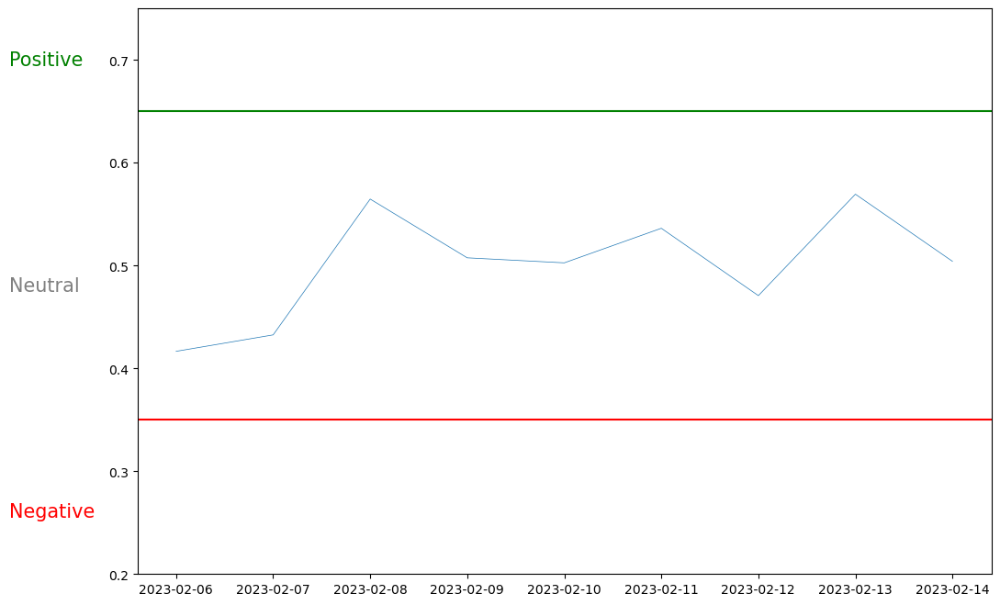

In [144]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_p2_pn_grouped.index, df1_p2_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

Here we can see that opinios are only neutral, which isn't suprising, as Morant had better momet in this period, which resulted in s little bit more of negative comments, which give a little bit lower mean score.

## 4.8  Analising third period (from 2023-03-01 to 2023-03-15)

In this period the gun incident happened, so I expect that here opinios should be negative and score should be much lower. Let's verify if it is good asumption.

In [69]:
mask3= (df_pn['Datetime'] > '2023-03-01') &(df_pn['Datetime'] < '2023-03-15')
df_period3 = df_pn[mask3]
df_period3

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1475,2023-03-14 23:34:11+00:00,1635786431103737862,ja morant is a brilliant talent on a shortsigh...,en,0.000,0.476,0.524,0.7650,Positive,0.749474
1476,2023-03-14 22:10:44+00:00,1635765432962674688,ja morant won his stupid prize!,en,0.248,0.219,0.533,0.5983,Positive,0.754211
1477,2023-03-14 22:07:09+00:00,1635764527458570241,special privileges to ja morant.,en,0.000,0.361,0.639,0.6486,Positive,0.810000
1478,2023-03-14 21:43:25+00:00,1635758557756018688,paul sends positive encouragement to ja morant...,en,0.000,0.430,0.570,0.8910,Positive,0.773684
1479,2023-03-14 20:14:18+00:00,1635736128098631700,praise god 🙏🏾🙏🏾🙏🏾,en,0.000,0.149,0.851,0.6908,Positive,0.921579
...,...,...,...,...,...,...,...,...,...,...
121076,2023-03-05 00:50:13+00:00,1632181688519340034,somebody said ja morant in the wrong nba shit ...,en,0.516,0.484,0.000,-0.8625,Negative,0.092944
121077,2023-03-05 00:48:26+00:00,1632181237933805570,no the fuck we wouldn’t say that,en,0.533,0.467,0.000,-0.6908,Negative,0.101973
121078,2023-03-05 00:46:41+00:00,1632180798940930050,fuck boy,en,0.778,0.222,0.000,-0.5423,Negative,0.232094
121079,2023-03-05 00:45:58+00:00,1632180616421679105,you are wrong.,en,0.608,0.392,0.000,-0.4767,Negative,0.141806


### 4.8.1 Analising positive tweets

In [70]:
df_positive_p3 = df_period3[df_period3['Type'] ==  'Positive']
df_positive_p3

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1475,2023-03-14 23:34:11+00:00,1635786431103737862,ja morant is a brilliant talent on a shortsigh...,en,0.000,0.476,0.524,0.7650,Positive,0.749474
1476,2023-03-14 22:10:44+00:00,1635765432962674688,ja morant won his stupid prize!,en,0.248,0.219,0.533,0.5983,Positive,0.754211
1477,2023-03-14 22:07:09+00:00,1635764527458570241,special privileges to ja morant.,en,0.000,0.361,0.639,0.6486,Positive,0.810000
1478,2023-03-14 21:43:25+00:00,1635758557756018688,paul sends positive encouragement to ja morant...,en,0.000,0.430,0.570,0.8910,Positive,0.773684
1479,2023-03-14 20:14:18+00:00,1635736128098631700,praise god 🙏🏾🙏🏾🙏🏾,en,0.000,0.149,0.851,0.6908,Positive,0.921579
...,...,...,...,...,...,...,...,...,...,...
1859,2023-03-05 00:51:18+00:00,1632181960176021505,well said,en,0.000,0.323,0.677,0.2732,Positive,0.830000
1860,2023-03-05 00:47:32+00:00,1632181012955549696,like ja morant,en,0.000,0.444,0.556,0.3612,Positive,0.766316
1861,2023-03-05 00:46:38+00:00,1632180785271787526,i love this!!,en,0.000,0.173,0.827,0.6988,Positive,0.908947
1862,2023-03-05 00:44:27+00:00,1632180237214646273,why do i feel like ja morant and polo g would ...,en,0.000,0.417,0.583,0.9118,Positive,0.780526


#### 4.8.1a Bag of words

In [71]:
all_words_pos_p3 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive_p3.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive_p3.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos_p3[word] = all_words_pos_p3.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [72]:
bow_pos_df_p3 = pd.DataFrame.from_dict(all_words_pos_p3, orient = 'index')
bow_pos_df_p3.sort_values(0, ascending=False).head(20)

,0
ja,227
morant,214
i,58
lol,43
love,38
jamorant,36
free,27
hope,25
best,19
great,17


Here we can see that there are a little bit less of positive words, but in my opinion it is not a significant difference.

In [73]:
wc_pos_p3 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos_p3)

### 4.8.2 Analisng negative tweets

In [74]:
df_negative_p3 = df_period3[df_period3['Type'] ==  'Negative']
df_negative_p3

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
120534,2023-03-14 22:34:26+00:00,1635771397522825222,ja morant had a gun and folks acting like he k...,en,0.398,0.376,0.226,-0.6808,Negative,0.030273
120535,2023-03-14 22:10:40+00:00,1635765414050275335,nba damn near silencing ja morant ain’t no way...,en,0.556,0.444,0.000,-0.8402,Negative,0.114188
120536,2023-03-14 21:37:34+00:00,1635757082938064896,shoot this bitch like i’m ja morant,en,0.488,0.315,0.197,-0.5719,Negative,0.078073
120537,2023-03-14 20:11:37+00:00,1635735455130943516,damn ja morant smh,en,0.714,0.286,0.000,-0.6124,Negative,0.198103
120538,2023-03-14 18:37:14+00:00,1635711703080894484,the nba is so dumb. leave ja morant alone jfc.,en,0.524,0.476,0.000,-0.7730,Negative,0.097193
...,...,...,...,...,...,...,...,...,...,...
121076,2023-03-05 00:50:13+00:00,1632181688519340034,somebody said ja morant in the wrong nba shit ...,en,0.516,0.484,0.000,-0.8625,Negative,0.092944
121077,2023-03-05 00:48:26+00:00,1632181237933805570,no the fuck we wouldn’t say that,en,0.533,0.467,0.000,-0.6908,Negative,0.101973
121078,2023-03-05 00:46:41+00:00,1632180798940930050,fuck boy,en,0.778,0.222,0.000,-0.5423,Negative,0.232094
121079,2023-03-05 00:45:58+00:00,1632180616421679105,you are wrong.,en,0.608,0.392,0.000,-0.4767,Negative,0.141806


#### 4.8.2a Bag of words

In [75]:
all_words_neg_p3 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative_p3.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative_p3.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg_p3[word] = all_words_neg_p3.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [76]:
bow_neg_df_p3 = pd.DataFrame.from_dict(all_words_neg_p3, orient = 'index')
bow_neg_df_p3.sort_values(0, ascending=False).head(20)

,0
ja,372
morant,361
shit,74
ass,65
gun,55
dumb,49
stupid,47
i,45
leave,32
fuck,27


Here we can see that much more negative words appeared. What is more, word gun is quite frequent, which shows that this was hot topic in this period.

In [77]:
wc_neg_p3 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg_p3)

### 4.8.3 Plot in time

In [78]:
df1_p3_pn_grouped = df_period3[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_p3_pn_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.418379
2023-03-06 00:00:00+00:00,0.338583
2023-03-07 00:00:00+00:00,0.343587
2023-03-08 00:00:00+00:00,0.400431
2023-03-09 00:00:00+00:00,0.394084
2023-03-10 00:00:00+00:00,0.416044
2023-03-11 00:00:00+00:00,0.430031
2023-03-12 00:00:00+00:00,0.434691
2023-03-13 00:00:00+00:00,0.447625


Text(-0.15, 0.1, 'Negative')

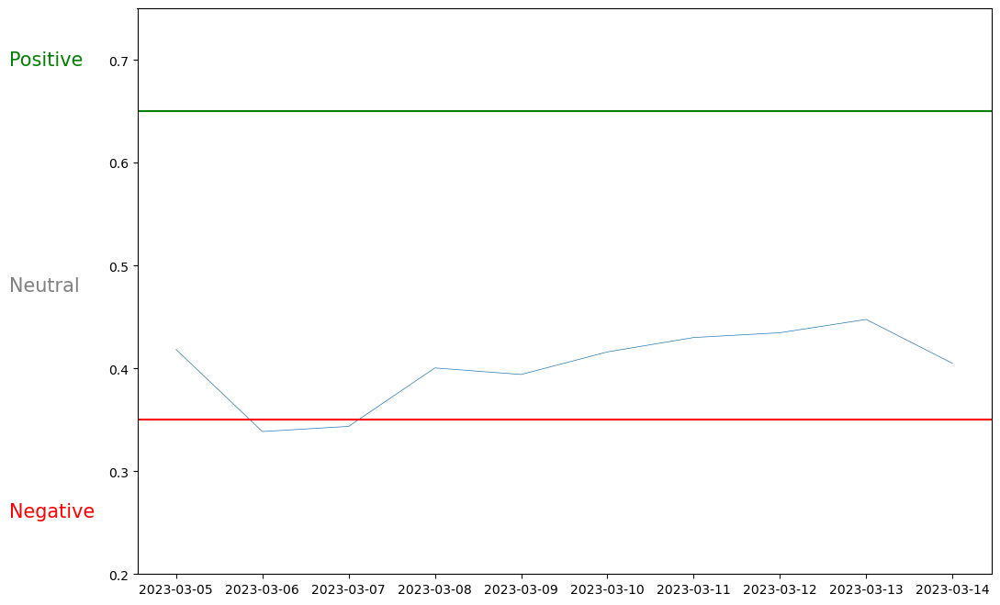

In [145]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_p3_pn_grouped.index, df1_p3_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

Here it can be easily seen, that opinios were much more negative than in previous periods. Scores oscilates between lower bounds of neutral score and upper bounds of negative score.

## 4.9 Analising fourth period ( from 2023-04-01 to 2023-04-15)

In [80]:
mask4 = (df_pn['Datetime'] > '2023-04-01') &(df_pn['Datetime'] < '2023-04-15')
df_period4 = df_pn[mask4]
df_period4

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1864,2023-04-14 23:58:28+00:00,1647026566658945025,u stay classy 🤦‍♂️,en,0.000,0.408,0.592,0.4404,Positive,0.785263
1865,2023-04-14 23:43:57+00:00,1647022912279310337,thanks 🫶🏽,en,0.000,0.256,0.744,0.4404,Positive,0.865263
1866,2023-04-14 22:50:51+00:00,1647009549310648322,that's beautiful. 👏,en,0.000,0.204,0.796,0.5994,Positive,0.892632
1867,2023-04-14 22:43:31+00:00,1647007706711232512,making ja morant proud,en,0.000,0.492,0.508,0.4767,Positive,0.741053
1868,2023-04-14 22:42:24+00:00,1647007422622433284,ja morant winning in ‘22 ruined this award low...,en,0.186,0.361,0.453,0.6625,Positive,0.712105
...,...,...,...,...,...,...,...,...,...,...
121279,2023-04-01 02:09:03+00:00,1641985997490511872,hate ja morant,en,0.649,0.351,0.000,-0.5719,Negative,0.163581
121280,2023-04-01 01:51:43+00:00,1641981638212046849,y must you kill my dreams 😭,en,0.452,0.288,0.260,-0.4588,Negative,0.058953
121281,2023-04-01 01:12:44+00:00,1641971825532911616,lock the fuck in,en,0.538,0.462,0.000,-0.5423,Negative,0.104628
121282,2023-04-01 01:06:05+00:00,1641970151976321024,"goddamn ja morant really bad, dude get it toge...",en,0.521,0.479,0.000,-0.8687,Negative,0.095599


### 4.9.1 Analisng positive tweets

In [81]:
df_positive_p4 = df_period4[df_period4['Type'] ==  'Positive']
df_positive_p4

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
1864,2023-04-14 23:58:28+00:00,1647026566658945025,u stay classy 🤦‍♂️,en,0.000,0.408,0.592,0.4404,Positive,0.785263
1865,2023-04-14 23:43:57+00:00,1647022912279310337,thanks 🫶🏽,en,0.000,0.256,0.744,0.4404,Positive,0.865263
1866,2023-04-14 22:50:51+00:00,1647009549310648322,that's beautiful. 👏,en,0.000,0.204,0.796,0.5994,Positive,0.892632
1867,2023-04-14 22:43:31+00:00,1647007706711232512,making ja morant proud,en,0.000,0.492,0.508,0.4767,Positive,0.741053
1868,2023-04-14 22:42:24+00:00,1647007422622433284,ja morant winning in ‘22 ruined this award low...,en,0.186,0.361,0.453,0.6625,Positive,0.712105
...,...,...,...,...,...,...,...,...,...,...
2140,2023-04-01 04:55:05+00:00,1642027781499256832,nice april fools joke ja morant 🗿,en,0.286,0.268,0.446,0.2023,Positive,0.708421
2141,2023-04-01 02:56:35+00:00,1641997961747103744,sure did,en,0.000,0.303,0.697,0.3182,Positive,0.840526
2142,2023-04-01 02:24:28+00:00,1641989881017556993,is u good brodie ???? goddamn like talk to us ...,en,0.165,0.373,0.462,0.6767,Positive,0.716842
2143,2023-04-01 02:06:08+00:00,1641985264292622337,y’all win it ez,en,0.000,0.241,0.759,0.7430,Positive,0.873158


#### 4.9.1a Bag of words

In [82]:
all_words_pos_p4 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive_p4.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive_p4.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos_p4[word] = all_words_pos_p4.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [83]:
bow_pos_df_p4 = pd.DataFrame.from_dict(all_words_pos_p4, orient = 'index')
bow_pos_df_p4.sort_values(0, ascending=False).head(20)

,0
ja,86
morant,78
i,35
love,33
lol,23
good,21
better,19
best,15
please,12
win,11


here we can't see any surprises, only common positive words.

In [84]:
wc_pos_p4 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos_p4)

### 4.9.2 Analasing negative tweets

In [85]:
df_negative_p4 = df_period4[df_period4['Type'] ==  'Negative']
df_negative_p4

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
121081,2023-04-14 23:20:40+00:00,1647017052253863937,suing ain't gangsta,en,0.512,0.488,0.00,-0.2732,Negative,0.090819
121082,2023-04-14 23:17:13+00:00,1647016186087895042,niggas finna blame ja morant,en,0.615,0.385,0.00,-0.5859,Negative,0.145524
121083,2023-04-14 23:04:14+00:00,1647012917152460800,"508,782,862,872,862,917,916 lies told.",en,0.583,0.417,0.00,-0.4215,Negative,0.128528
121084,2023-04-14 22:42:30+00:00,1647007448052408320,have some shame,en,0.608,0.392,0.00,-0.4767,Negative,0.141806
121085,2023-04-14 21:55:39+00:00,1646995658119823363,this your fault,en,0.574,0.426,0.00,-0.4019,Negative,0.123748
...,...,...,...,...,...,...,...,...,...,...
121279,2023-04-01 02:09:03+00:00,1641985997490511872,hate ja morant,en,0.649,0.351,0.00,-0.5719,Negative,0.163581
121280,2023-04-01 01:51:43+00:00,1641981638212046849,y must you kill my dreams 😭,en,0.452,0.288,0.26,-0.4588,Negative,0.058953
121281,2023-04-01 01:12:44+00:00,1641971825532911616,lock the fuck in,en,0.538,0.462,0.00,-0.5423,Negative,0.104628
121282,2023-04-01 01:06:05+00:00,1641970151976321024,"goddamn ja morant really bad, dude get it toge...",en,0.521,0.479,0.00,-0.8687,Negative,0.095599


#### 4.9.2a Bag of words

In [86]:
all_words_neg_p4 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative_p4.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative_p4.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg_p4[word] = all_words_neg_p4.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [87]:
bow_neg_df_p4 = pd.DataFrame.from_dict(all_words_neg_p4, orient = 'index')
bow_neg_df_p4.sort_values(0, ascending=False).head(20)

,0
ja,90
morant,89
i,29
ass,25
blame,21
shit,16
fuck,14
bitch,13
hell,9
fire,8


Here we can see few stronger words, but their amount is low, so it is not a reuslt of some controversy, just tweets of fans of different teams.

In [88]:
wc_neg_p4 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg_p4)

### 4.9.3 Plot in time

In [89]:
df1_p4_pn_grouped = df_period4[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_p4_pn_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.480749
2023-04-02 00:00:00+00:00,0.467146
2023-04-03 00:00:00+00:00,0.542539
2023-04-04 00:00:00+00:00,0.491484
2023-04-05 00:00:00+00:00,0.490266
2023-04-06 00:00:00+00:00,0.564469
2023-04-07 00:00:00+00:00,0.573348
2023-04-08 00:00:00+00:00,0.549242
2023-04-09 00:00:00+00:00,0.471944


Text(-0.15, 0.1, 'Negative')

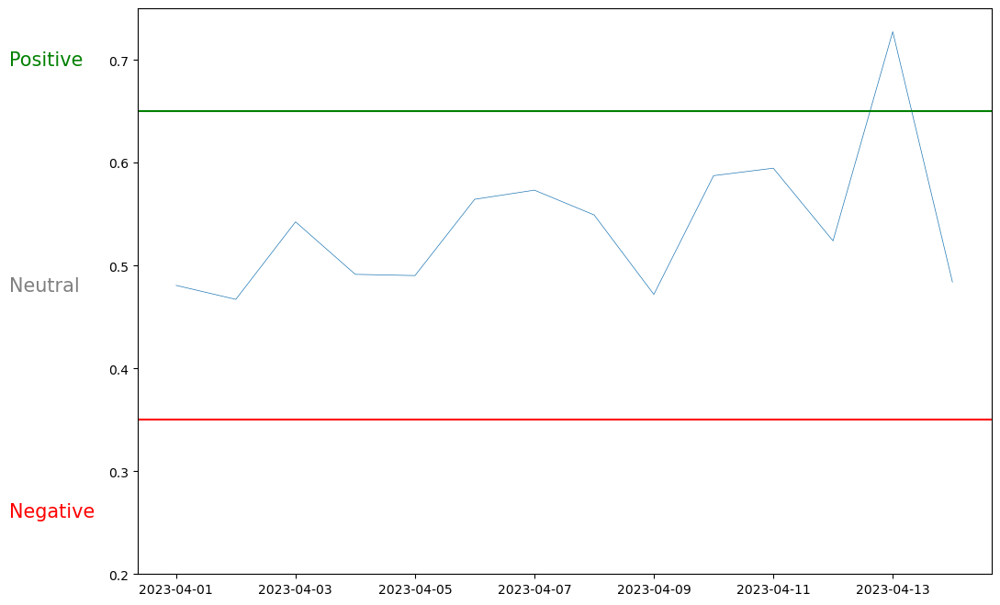

In [146]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_p4_pn_grouped.index, df1_p4_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

Here opinios oscilate between neutral and positive, just like in the second period.

## 4.10 Analising fifth period (from 2023-05-01 to 2023-05-15)

In [91]:
mask5 = (df_pn['Datetime'] > '2023-05-01') &(df_pn['Datetime'] < '2023-05-15')
df_period5 = df_pn[mask5]
df_period5

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
2145,2023-05-14 23:46:43+00:00,1657895244757716993,👏👏 well said.,en,0.000,0.488,0.512,0.2732,Positive,0.743158
2146,2023-05-14 23:39:40+00:00,1657893470550491136,just want to see you happy and living your bes...,en,0.000,0.495,0.505,0.8481,Positive,0.739474
2147,2023-05-14 23:33:55+00:00,1657892023611924481,ja morant friends suck.,en,0.362,0.250,0.388,0.0516,Positive,0.677895
2148,2023-05-14 23:33:33+00:00,1657891930544435200,great timing 🤣,en,0.000,0.196,0.804,0.6249,Positive,0.896842
2149,2023-05-14 23:32:40+00:00,1657891710909788167,why ja morant love guns so much 🤔 like nigga p...,en,0.121,0.417,0.462,0.8393,Positive,0.716842
...,...,...,...,...,...,...,...,...,...,...
122796,2023-05-02 01:55:47+00:00,1653216686370177026,injured star theory 5-0 memphis - no ja morant...,en,0.590,0.410,0.000,-0.9834,Negative,0.132246
122797,2023-05-01 22:17:14+00:00,1653161683110486016,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122798,2023-05-01 19:56:27+00:00,1653126254944481281,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122799,2023-05-01 18:43:38+00:00,1653107929103360005,i know real niggas gone miss ya 😂,en,0.500,0.500,0.000,-0.4588,Negative,0.084446


### 4.10.1 Analisng positive tweets

In [92]:
df_positive_p5 = df_period5[df_period5['Type'] ==  'Positive']
df_positive_p5

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
2145,2023-05-14 23:46:43+00:00,1657895244757716993,👏👏 well said.,en,0.000,0.488,0.512,0.2732,Positive,0.743158
2146,2023-05-14 23:39:40+00:00,1657893470550491136,just want to see you happy and living your bes...,en,0.000,0.495,0.505,0.8481,Positive,0.739474
2147,2023-05-14 23:33:55+00:00,1657892023611924481,ja morant friends suck.,en,0.362,0.250,0.388,0.0516,Positive,0.677895
2148,2023-05-14 23:33:33+00:00,1657891930544435200,great timing 🤣,en,0.000,0.196,0.804,0.6249,Positive,0.896842
2149,2023-05-14 23:32:40+00:00,1657891710909788167,why ja morant love guns so much 🤔 like nigga p...,en,0.121,0.417,0.462,0.8393,Positive,0.716842
...,...,...,...,...,...,...,...,...,...,...
2748,2023-05-01 23:05:53+00:00,1653173928414543877,trae is most definitely better than ja morant ...,en,0.000,0.443,0.557,0.8771,Positive,0.766842
2749,2023-05-01 19:52:07+00:00,1653125163100020742,yes he is,en,0.000,0.426,0.574,0.4019,Positive,0.775789
2750,2023-05-01 19:50:27+00:00,1653124743376019478,happy birthday bubba!!!!,en,0.000,0.291,0.709,0.7067,Positive,0.846842
2751,2023-05-01 19:32:36+00:00,1653120251268300802,on god,en,0.000,0.323,0.677,0.2732,Positive,0.830000


#### 4.10.1a Bag of words

In [93]:
all_words_pos_p5 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_positive_p5.index:
    sentence = re.sub(r'[^\w\s]', '', df_positive_p5.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_pos_p5[word] = all_words_pos_p5.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [94]:
bow_pos_df_p5 = pd.DataFrame.from_dict(all_words_pos_p5, orient = 'index')
bow_pos_df_p5.sort_values(0, ascending=False).head(20)

,0
ja,264
morant,249
i,75
love,61
better,55
lol,49
lmao,40
good,28
please,27
funny,16


Here are some different word, which seems to be surprising such as stupid. But maybe, after seeing the whole tweets, it wouldn't be so surpring.

In [95]:
wc_pos_p5 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_pos_p5)

### 4.10.2 Analising negative tweets

In [96]:
df_negative_p5 = df_period5[df_period5['Type'] ==  'Negative']
df_negative_p5

,Datetime,Tweet Id,Text,Language,Negative,Neutral,Positive,Compound,Type,Score
121284,2023-05-14 23:57:04+00:00,1657897848644550658,self sabotage for fake loyalty,en,0.542,0.167,0.292,-0.4588,Negative,0.106753
121285,2023-05-14 23:56:31+00:00,1657897711130263552,"im waiting for ""suspended"" or ""gun violence"" c...",en,0.520,0.480,0.000,-0.7579,Negative,0.095068
121286,2023-05-14 23:54:49+00:00,1657897283701047296,ja morant’s stupidity &gt; front office stupidity,en,0.537,0.463,0.000,-0.7003,Negative,0.104097
121287,2023-05-14 23:52:28+00:00,1657896693554135040,i’m so upset with ja morant fine stupid ass! 🙄,en,0.597,0.296,0.107,-0.8513,Negative,0.135964
121288,2023-05-14 23:51:02+00:00,1657896334026842115,keep playing gun drop you….,en,0.542,0.241,0.217,-0.4019,Negative,0.106753
...,...,...,...,...,...,...,...,...,...,...
122796,2023-05-02 01:55:47+00:00,1653216686370177026,injured star theory 5-0 memphis - no ja morant...,en,0.590,0.410,0.000,-0.9834,Negative,0.132246
122797,2023-05-01 22:17:14+00:00,1653161683110486016,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122798,2023-05-01 19:56:27+00:00,1653126254944481281,damn,en,1.000,0.000,0.000,-0.4019,Negative,0.350000
122799,2023-05-01 18:43:38+00:00,1653107929103360005,i know real niggas gone miss ya 😂,en,0.500,0.500,0.000,-0.4588,Negative,0.084446


#### 4.10.2a Bag of words

In [97]:
all_words_neg_p5 = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_negative_p5.index:
    sentence = re.sub(r'[^\w\s]', '', df_negative_p5.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # etting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove:
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_neg_p5[word] = all_words_neg_p5.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one 

In [98]:
bow_neg_df_p5 = pd.DataFrame.from_dict(all_words_neg_p5, orient = 'index')
bow_neg_df_p5.sort_values(0, ascending=False).head(20)

,0
ja,944
morant,915
dumb,296
stupid,210
ass,183
shit,137
idiot,114
smh,112
fuck,92
wrong,90


Here we can see some negatives words similar to these in third period. This could be connected with the fact, that near the end of this period the second gun incident happened.

In [99]:
wc_neg_p5 = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_neg_p5)

### 4.10.3 Plot in time

In [100]:
df1_p5_pn_grouped = df_period5[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df1_p5_pn_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.555190
2023-05-02 00:00:00+00:00,0.511301
2023-05-03 00:00:00+00:00,0.532022
2023-05-04 00:00:00+00:00,0.527018
2023-05-05 00:00:00+00:00,0.562003
2023-05-06 00:00:00+00:00,0.645007
2023-05-07 00:00:00+00:00,0.659158
2023-05-08 00:00:00+00:00,0.501725
2023-05-09 00:00:00+00:00,0.486681


Text(-0.15, 0.1, 'Negative')

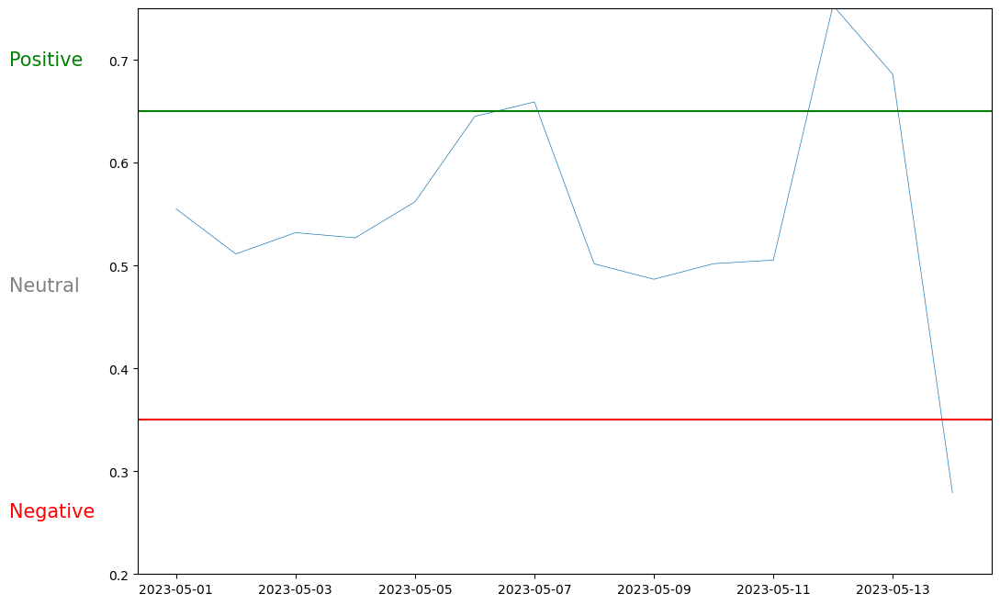

In [147]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(df1_p5_pn_grouped.index, df1_p5_pn_grouped['Score'], linewidth=0.5)
plt.ylim(0.2,0.75)
plt.axhline(y = 0.35, color = 'red', linestyle = '-')
plt.axhline(y = 0.65, color = 'green', linestyle = '-')
ax.text(-0.15, 0.9,'Positive', transform=ax.transAxes, color='green', fontsize=15)
ax.text(-0.15, 0.5,'Neutral', transform=ax.transAxes, color='gray', fontsize=15)
ax.text(-0.15, 0.1,'Negative', transform=ax.transAxes, color='red', fontsize=15)

As I mentioned before, we can see here, that in the almost throug the whole periods opinions where neutral and positives, butr in the end of this period, opinions instatnly dropped to even more negative than in the third period.

# 5. Summary

## 5.1  Positive words clouds

Text(0.5, 1.0, 'Fifth period')

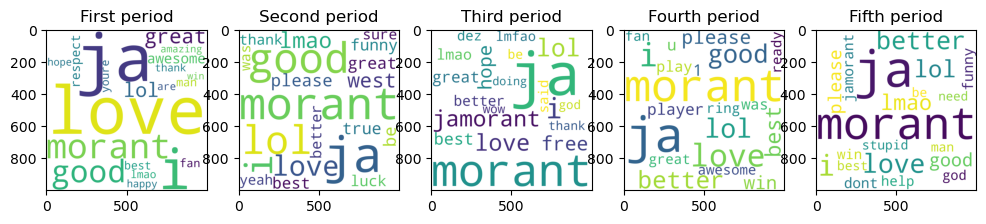

In [452]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_pos_p1)
ax1.set_title('First period')
ax2.imshow(wc_pos_p2)
ax2.set_title('Second period')
ax3.imshow(wc_pos_p3)
ax3.set_title('Third period')
ax4.imshow(wc_pos_p4)
ax4.set_title('Fourth period')
ax5.imshow(wc_pos_p5)
ax5.set_title('Fifth period')

As we can see some there are some differences, but all there are words, which are expected in positive tweets about nba player, so there aren't any suprises

## 5.2 Negative words clouds

Text(0.5, 1.0, 'Fifth period')

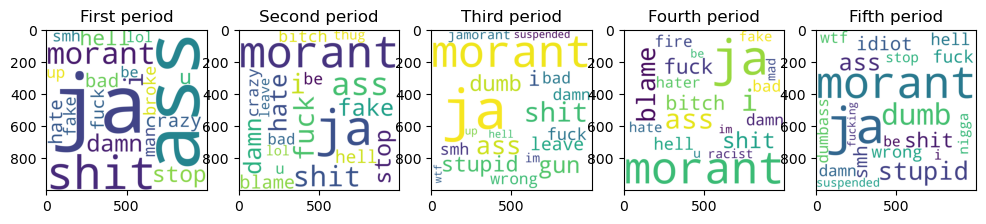

In [451]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_neg_p1)
ax1.set_title('First period')
ax2.imshow(wc_neg_p2)
ax2.set_title('Second period')
ax3.imshow(wc_neg_p3)
ax3.set_title('Third period')
ax4.imshow(wc_neg_p4)
ax4.set_title('Fourth period')
ax5.imshow(wc_neg_p5)
ax5.set_title('Fifth period')

Here we can see, that the most negative words appear in the middle word cloud, which is not surprising, because this word cloud was bulit for tweets in gun incident period. We can even see word gun in this word cloud. What is more in the fifth words cloud we can see that there is some impact of second gun incident.

## 5.3  Plots in time

Text(-0.11, -0.01, 'Negative')

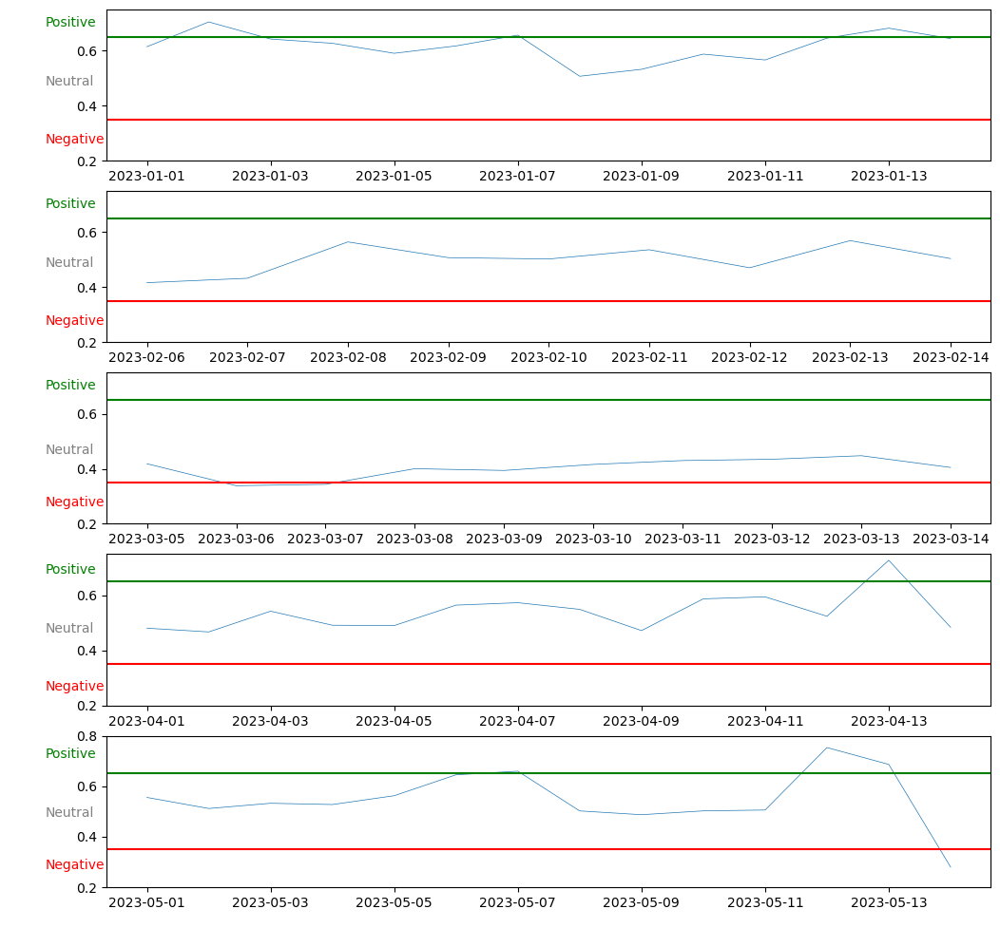

In [195]:
fig,((ax1), (ax2), (ax3), (ax4), (ax5)) = plt.subplots(5,1, figsize = (12,12))
ax1.plot(df1_p1_pn_grouped.index, df1_p1_pn_grouped['Score'], linewidth=0.5)
ax1.set_ylim(0.2,0.75)
ax1.axhline(y = 0.35, color = 'red', linestyle = '-')
ax1.axhline(y = 0.65, color = 'green', linestyle = '-')
ax1.text(-0.11, 1.43,'Positive', transform=ax.transAxes, color='green', fontsize=10)
ax1.text(-0.11, 1.33,'Neutral', transform=ax.transAxes, color='gray', fontsize=10)
ax1.text(-0.11, 1.23,'Negative', transform=ax.transAxes, color='red', fontsize=10)

ax2.plot(df1_p2_pn_grouped.index, df1_p2_pn_grouped['Score'], linewidth=0.5)
ax2.set_ylim(0.2,0.75)
ax2.axhline(y = 0.35, color = 'red', linestyle = '-')
ax2.axhline(y = 0.65, color = 'green', linestyle = '-')
ax2.text(-0.11, 1.12,'Positive', transform=ax.transAxes, color='green', fontsize=10)
ax2.text(-0.11, 1.02,'Neutral', transform=ax.transAxes, color='gray', fontsize=10)
ax2.text(-0.11, 0.92,'Negative', transform=ax.transAxes, color='red', fontsize=10)

ax3.plot(df1_p3_pn_grouped.index, df1_p3_pn_grouped['Score'], linewidth=0.5)
ax3.set_ylim(0.2,0.75)
ax3.axhline(y = 0.35, color = 'red', linestyle = '-')
ax3.axhline(y = 0.65, color = 'green', linestyle = '-')
ax3.text(-0.11, 0.81,'Positive', transform=ax.transAxes, color='green', fontsize=10)
ax3.text(-0.11, 0.7,'Neutral', transform=ax.transAxes, color='gray', fontsize=10)
ax3.text(-0.11, 0.61,'Negative', transform=ax.transAxes, color='red', fontsize=10)

ax4.plot(df1_p4_pn_grouped.index, df1_p4_pn_grouped['Score'], linewidth=0.5)
ax4.set_ylim(0.2,0.75)
ax4.axhline(y = 0.35, color = 'red', linestyle = '-')
ax4.axhline(y = 0.65, color = 'green', linestyle = '-')
ax4.text(-0.11, 0.495,'Positive', transform=ax.transAxes, color='green', fontsize=10)
ax4.text(-0.11, 0.395,'Neutral', transform=ax.transAxes, color='gray', fontsize=10)
ax4.text(-0.11, 0.295,'Negative', transform=ax.transAxes, color='red', fontsize=10)

ax5.plot(df1_p5_pn_grouped.index, df1_p5_pn_grouped['Score'], linewidth=0.5)
ax5.set_ylim(0.2,0.8)
ax5.axhline(y = 0.35, color = 'red', linestyle = '-')
ax5.axhline(y = 0.65, color = 'green', linestyle = '-')
ax5.text(-0.11, 0.18,'Positive', transform=ax.transAxes, color='green', fontsize=10)
ax5.text(-0.11, 0.08,'Neutral', transform=ax.transAxes, color='gray', fontsize=10)
ax5.text(-0.11, -0.01,'Negative', transform=ax.transAxes, color='red', fontsize=10)

As we can see the most negative attitude towards Ja Morant was in the March, when the gun accident happened and in the end of half of May when the second gun accident happened. In the other months attitude was neutral or positive. So we can see that fame and being young star of nba team don't protect your credibility.

# 6. Analising using Text2emotions

In [105]:
df2 = df.copy()
df2

,Datetime,Tweet Id,Text,Language
0,2023-01-14 23:59:19+00:00,1614411874761641989,SHOWTIME!! 🏀 at Grizzlies Starters: Ja Morant ...,en
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st NBA game! Let’s go JA #12,en
3,2023-01-14 23:55:09+00:00,1614410823883001856,You're a truly good man . Way to make it right...,en
4,2023-01-14 23:55:07+00:00,1614410816174055424,Lol nah but Ja ain’t gassing him rn.,en
6,2023-01-14 23:51:57+00:00,1614410019641987072,Hey ja,en
...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,Jordan Poole Silver Select 10 - $110 shipped A...,en
159988,2023-05-01 00:15:41+00:00,1652829106919153669,Grizzlies' Ja Morant reveals new goals after L...,en
159993,2023-05-01 00:08:20+00:00,1652827254206898177,I’m bout to go in food Iion and I see this lil...,en
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"Felt exactly the same way, Fox is a fucking be...",en


## 6.1 Preparing data

I get score of each emotion by using get_emotion method. Then I assign score of each emotion to specified column.

In [196]:
for i in df2.index:
    df2.at[i,'Text'] = df2.at[i,'Text'].lower()
    emotions = te.get_emotion(df2.at[i,'Text'])
    print(i), print(emotions)
    df2.at[i, 'Angry'] = emotions['Angry']
    df2.at[i, 'Fear'] = emotions['Fear']
    df2.at[i, 'Happy'] = emotions['Happy']
    df2.at[i, 'Sad'] = emotions['Sad']
    df2.at[i, 'Surprise'] = emotions['Surprise']
    

0
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
4
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
7
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
16
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18
{'Happy': 0, 'Angry': 0, 'Sur

157
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
158
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
162
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
163
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.0}
165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

326
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
327
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.0, 'Fear': 0.75}
328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
329
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
336
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
339
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
343
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
344
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
346
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
349
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 

522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
523
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
525
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
534
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
536
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.38}
538
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
539
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
541
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
542
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
543
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
546
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0

707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
708
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
709
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
710
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
711
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
712
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
715
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
717
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
719
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
724
{'Happ

883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
898
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
899
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
900
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}


1056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1060
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1061
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1064
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1066
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
1071
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1072
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
1073
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1076
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
1080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1081
{'Happy': 0.0, 'Angry': 0.0, 'Surp

1249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1253
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
1255
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1256
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1259
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1261
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
1262
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1265
{'Happy': 0, 'Angry': 0, 'Surprise

1464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
1468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
1470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1474
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
1478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1479
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
1480
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1481
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1487
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1488
{'Happy': 0.4, 'Ang

1641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1642
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1643
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
1644
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1645
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1646
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1647
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1648
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
1649
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
1651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1652
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
1654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.

1817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
1818
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1820
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1821
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1825
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
1826
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1827
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
1829
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
1830
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1832
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
1833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
1834
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
1838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1840
{'Happy': 0.2, 'Angry': 0.0, 'Surprise

1990
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
1992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
1996
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2002
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2006
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
2007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
2008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

2148
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2154
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2156
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
2157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
2158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
2160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
2163
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2164
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
2166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

2317
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2318
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
2320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
2323
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2325
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2328
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
2329
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
2330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2338
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2340
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2342
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2347
{'Happy':

2501
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
2503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2505
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
2507
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
2510
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2513
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
2515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2516
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2518
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fe

2670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
2672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2675
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
2677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
2678
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
2681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
2682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2687
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
2688
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
2693
{'Happy': 0.44, 'Angry': 0.11,

2841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2849
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
2852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
2854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
2855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
2856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
2857
{'Happy': 0

2998
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
2999
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3002
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3009
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
3012
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3014
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3016
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
3017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3018
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
3020
{'Happy': 0.75, 'Angry': 0.0, 'Surp

3178
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
3179
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3180
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
3181
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
3182
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3185
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3187
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3188
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3192
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3193
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
3194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
3196
{'Happy': 0.0, 'Angry': 0.33, 'Surprise

3387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3388
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
3392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3394
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3399
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
3402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3403
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3404
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3408
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear':

3560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
3561
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
3564
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3565
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.83, 'Sad': 0.17, 'Fear': 0.0}
3569
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
3574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
3575
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
3576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
3577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
3579
{'Happy': 0.0, 'Angry': 0

3716
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3717
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
3719
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
3720
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3723
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
3724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3725
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
3728
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
3731
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3732
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
3733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
3734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 

3872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
3873
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
3881
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3883
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.0}
3884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
3885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
3886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
3887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
3889
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
3890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1

4008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
4009
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4010
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4011
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.12}
4012
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
4013
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
4014
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
4015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4017
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
4018
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4020
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4021
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
4024
{'Happy': 0.0, '

4145
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
4147
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
4148
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4150
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
4153
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
4154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
4155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
4156
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
4157
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4158
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4159
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4160
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

4307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
4308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
4309
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4311
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4314
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4315
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
4316
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
4318
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
4319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
4323
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4326
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sa

4479
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4481
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4482
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
4484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
4486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4489
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
4491
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
4492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
4493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4494
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
4495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4496
{'Happy': 0, 'Angry': 

4645
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
4646
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
4648
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
4651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
4652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
4654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
4658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4659
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
4660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4662
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4663
{'Happy': 0, 'Angry'

4841
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4846
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
4847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4849
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4852
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
4853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
4859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
4861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
4862

5031
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5032
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
5034
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.0}
5035
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5036
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5037
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
5038
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5041
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5042
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
5043
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5045
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.12}
5046
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}


5180
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
5181
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5182
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5183
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
5185
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
5186
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5188
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
5189
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5191
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
5197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
5201
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
5202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
5203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

5361
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
5368
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
5369
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
5370
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.38, 'Sad': 0.0, 'Fear': 0.38}
5371
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
5372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5375
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
5376
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

5519
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5520
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5524
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5525
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
5526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
5528
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5529
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
5530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
5531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5532
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5534
{'Happy': 0.33, 'Angry': 0.0, 'Surprise':

5674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5675
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5677
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
5678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
5680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5681
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5683
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
5686
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5687
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
5688
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
5693
{'Happy': 0.0, 'Angry': 0.0, 'Surpr

5817
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
5818
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5821
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
5822
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5824
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
5825
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
5826
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5828
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
5831
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5833
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fea

5976
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5978
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
5981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
5982
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
5983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5984
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
5986
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
5987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
5988
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5991
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
5992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
5993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

6111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6114
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6115
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
6116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
6117
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6118
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6120
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
6121
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
6122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0,

6276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6277
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
6278
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6279
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
6280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6281
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6282
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
6283
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6284
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6285
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
6286
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6288
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6289
{'Happy': 0.25, 'Angry': 0.0, 'Surprise':

6416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6419
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6424
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
6427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6437
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0,

6595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
6596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
6600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6603
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
6609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
6611
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
6614
{'Happy': 0.0, 'Angry': 0.0, 'S

6785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.2}
6786
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
6787
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
6788
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6792
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6794
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
6795
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
6796
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6798
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
6801
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
6803
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
6807
{'Happy': 0.0, 'Angry': 0.

6980
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6983
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
6987
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
6992
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
6994
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
6995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
6996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
6997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7000
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
7001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0

7179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7180
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7181
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7182
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
7183
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7185
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7187
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7189
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7191
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
7192
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
7193
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
7194
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
7195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear':

7370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
7371
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
7373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
7379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7380
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
7381
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
7382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7384
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
7387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad

7524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7527
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
7534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7537
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7538
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
7542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7547
{'Happy': 0, 'Angry': 0, 'Surprise'

7690
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7692
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7694
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7695
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7699
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
7701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7703
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7704
{'Happy': 0.0, 'A

7857
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
7859
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7860
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
7861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7863
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
7864
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
7865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
7868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7869
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
7871
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
7872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0,

8013
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
8018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8019
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
8020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
8021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8023
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8026
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
8028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
8029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
8030
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8032
{'Happ

8197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
8203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
8209
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
8219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8223
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
8225
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8226
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear':

8375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8380
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8381
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
8383
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8395
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8400
{'Happy': 0, 'Angry': 0, 'Sur

8531
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
8532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8534
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8536
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8539
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
8543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8544
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
8545
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8547
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8549
{'Happy': 0

8686
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
8687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8694
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
8698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
8700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8703
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
8706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8708
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8709
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8710
{'Happy': 0.0, 

8847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
8856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
8857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
8859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
8860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.3

8991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
8997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
8998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
9001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9004
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
9005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9007
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
9009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

9139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
9140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9141
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9142
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9144
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9145
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9147
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9148
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9150
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
9151
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
9152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9157
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear':

9287
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
9288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9289
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
9290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
9291
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
9292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9294
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9295
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9300
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
9301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
9302
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
9304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9306
{'Happy': 0, 'Angry': 0, 'Surp

9460
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9464
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9465
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
9466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9470
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
9476
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9477
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
9478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9479
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
9480
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94

9645
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9646
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9647
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9650
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
9651
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9653
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
9654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
9658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9659
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9660
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9661
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
9662
{'Happy

9806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
9808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9811
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9813
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9815
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9820
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
9822
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9823
{'Happy': 1.0, 'Ang

9939
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
9940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
9942
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9943
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
9944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
9945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
9947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
9952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9954
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
9955
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
9956
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
9957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

10095
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
10096
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10097
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
10102
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10104
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.62, 'Sad': 0.12, 'Fear': 0.0}
10108
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10113
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10118
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
10119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10121
{'Happy': 0.0, 'Angry': 0.0, '

10275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10279
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10281
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
10282
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10283
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10287
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
10289
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10291
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad'

10430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10431
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
10432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10433
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
10436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
10437
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
10440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10441
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
10442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10445
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
10446
{'Happy': 0, 'Ang

10608
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10616
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10617
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
10622
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
10623
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10624
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10626
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, '

10780
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10781
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
10785
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10790
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10793
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
10794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
10795
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
10796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
10797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10798
{'Happy': 0, 'Angry': 0, 'Sur

10941
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10942
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
10948
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
10949
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
10952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
10957
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
10959
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10960
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10961
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
10963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10966
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
10968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
10969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

11128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
11129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
11131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
11140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11143
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
11145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
11146
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11147
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

11306
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
11308
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11310
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
11311
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
11315
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11318
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11321
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11323
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0,

11469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11472
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11473
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11475
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
11478
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11479
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
11480
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11481
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11484
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
11486
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11487
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
11488
{'Happy': 1.0, 'Angry': 0.0, 'Surprise':

11625
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11626
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11630
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11633
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
11634
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11635
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11637
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11639
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11640
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':

11782
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
11783
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
11786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11787
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
11788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11789
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
11790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
11791
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
11796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
11797
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11798
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11799
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

11935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11936
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
11937
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
11939
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11942
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11944
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11945
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
11946
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11947
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
11948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11949
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11950
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
11951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
11952
{'Happ

12100
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12101
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12102
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
12103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12104
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
12107
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12108
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
12110
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12112
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12113
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12114
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
12115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear':

12251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
12254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12256
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
12257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
12261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12262
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12265
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12266
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
12267
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
12268
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12274
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
12275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, '

12409
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
12413
{'Happy': 0.6, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
12414
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
12422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12423
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
12424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12426
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12

12566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
12568
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12570
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
12573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12574
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
12575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12577
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12579
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

12724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
12725
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12726
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
12727
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
12728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
12729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
12730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12731
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
12733
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
12737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
12739
{'Happy': 0.17, 'Angry': 

12887
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
12888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
12892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12895
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12896
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
12898
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
12899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
12900
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
12901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

13053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
13058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
13063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
13067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
13070
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
13074
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13075
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
13076
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13080
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13081
{'Happy': 0.0

13224
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
13225
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
13227
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.38}
13228
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13233
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
13234
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13235
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.57}
13236
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13237
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.0, 'Fear': 0.43}
13238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
13243
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
13245
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.29}
13248
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
13249
{'Ha

13407
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
13411
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13414
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13415
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
13416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13417
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
13419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

13617
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13619
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13620
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
13622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13625
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13626
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
13629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13632
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
13633
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
13636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13638
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

13821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13822
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
13823
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13825
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
13827
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13828
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
13830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
13831
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
13832
{'Happy': 0.0, 'Angry': 0.22, 'Surprise': 0.56, 'Sad': 0.11, 'Fear': 0.11}
13834
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13835
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13836
{

13977
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13980
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
13983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
13984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
13985
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
13986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
13988
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13989
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
13992
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
13993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

14148
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14149
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14150
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14151
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
14155
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.0, 'Fear': 0.71}
14157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
14161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
14163
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
14168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14171
{'Happy': 0.0, 

14368
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
14369
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
14372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14373
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
14374
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
14375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
14380
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
14382
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14387
{'Happy': 0.0, 'Angry': 0.

14555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
14556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
14561
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
14562
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
14563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14567
{'Happy': 0.12, 'Angry': 0.38, 'Surprise': 0.12, 'Sad': 0.12, 'Fear': 0.25}
14571
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
14574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
14575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14577
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, '

14733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
14734
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
14737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
14745
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
14746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
14748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14751
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
14753
{'Happy': 0.4, 'Angry': 0.0, 'S

14885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
14888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
14891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.1, 'Sad': 0.4, 'Fear': 0.5}
14892
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
14894
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
14895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
14896
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
14898
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
14899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
14900
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
14903
{'Happy': 0, 'Ang

15030
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15031
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
15032
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
15033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
15036
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15037
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15039
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
15040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15041
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
15042
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15043
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
15044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15045
{'Happy': 0.0

15195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
15205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15209
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
15210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15211
{'Happy': 0.0, 'Angry':

15364
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15365
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15366
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
15367
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15368
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
15370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15375
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15380
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
15382
{'Happy': 0.0, 'Ang

15558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
15560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15561
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
15575
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
15577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
15578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15580
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15583
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
15586
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

15812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
15813
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
15816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
15818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15819
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
15820
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
15821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
15822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
15824
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
15825
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15828
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
15829
{'Happy':

15975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15977
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15978
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
15982
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
15985
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
15989
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15991
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
15995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15996
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
16003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
16004
{'Happy': 0.38, 'Angry': 0.12, 'Surpri

16141
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
16142
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16143
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16144
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
16146
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16148
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
16155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
16156
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16158
{'Happy': 0.0, 'Ang

16297
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
16298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
16299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
16303
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
16306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
16308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
16312
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
16315
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
16316
{'Happy': 0,

16473
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
16475
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16476
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16479
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
16483
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16484
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16487
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
16489
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16493
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16494
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
16498
{'Happy': 0, 'A

16694
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16697
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16698
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16703
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16705
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
16709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
16

16849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
16850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
16853
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.43}
16854
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
16855
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
16856
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
16857
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
16858
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.43}
16859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
16860
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
16861
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
16862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
16864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.71, 'Sad':

16997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
16998
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.33}
17000
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17005
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
17006
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
17007
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
17008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17009
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17010
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.0}
17011
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
17013
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17014
{'Happy': 0, 'Angry': 0, '

17155
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17156
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17157
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17159
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17160
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17161
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
17166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
17167
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
17168
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17172
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17173
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
17176
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

17345
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17347
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
17349
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17350
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
17353
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
17354
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17355
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17356
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
17359
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
17362
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
17363
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17364
{'Happy': 0, 

17507
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
17510
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17511
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17512
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
17514
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
17515
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
17517
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17518
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
17519
{'Happy': 0.18, 'Angry': 0.18, 'Surprise': 0.18, 'Sad': 0.09, 'Fear': 0.36}
17520
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
17522
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
17527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0

17673
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
17675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17677
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
17680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
17682
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
17683
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17691
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17693
{'Happy': 0.0, 'Angry': 0.0, 'S

17833
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
17837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
17839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
17840
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
17844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
17845
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
17847
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17848
{'Happy': 0, 'Angry': 0, 'Surpris

17979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
17980
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
17984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
17985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17986
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
17987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17988
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
17993
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
17994
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
17995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
17996
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
17997
{'Happy': 0.0, 'Angry': 0.0, 'Su

18124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18126
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
18127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18128
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
18129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
18130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
18136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18138
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
18139
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

18262
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
18263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18264
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.43, 'Sad': 0.0, 'Fear': 0.29}
18265
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
18267
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18268
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
18269
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18271
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
18273
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
18274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
18275
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
18277
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
18278
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0

18399
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
18400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18402
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
18403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18405
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18407
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.14}
18408
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
18409
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18410
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18411
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18413
{'Happy': 0, 'An

18559
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18561
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18566
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
18567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
18568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
18573
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
18575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
18578
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
18579
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
18580
{'Happy': 0.0, 'An

18716
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
18722
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
18723
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18726
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18727
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18729
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
18730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18732
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
18733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18734
{'Happy': 0.5, 'Angry': 0.0

18877
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
18879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
18881
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
18882
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
18886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
18898
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.14}
18900
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
18902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
18903
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
18905
{'Hap

19063
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19064
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.67}
19067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
19069
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19071
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19073
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19077
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
19083
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
19085
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19088
{'Happy': 0.0, 'Angry': 0.0,

19263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19265
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
19270
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.43}
19271
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19272
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19273
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
19275
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
19281
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
19282
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
19283
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19285
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19286
{'Happy': 0.0, 'Angry': 

19467
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19472
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
19473
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19474
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19475
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19476
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19480
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
19482
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
19486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
19489
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
19491
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.17, 'Fear': 0.17}
19495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19496
{'Happy': 0.4, 'A

19671
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19672
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19673
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
19676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
19678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
19681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
19682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
19683
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
19684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19685
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19687
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19688
{'Happy': 0, 'Angry': 0, 'Surpris

19845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19849
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
19851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19853
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
19855
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
19856
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
19857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
19858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
19859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
19860
{'Happy': 0.25, 'Angry': 0.5, 'Surprise': 0.25,

20035
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
20037
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20038
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20040
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20042
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20045
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20050
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20056
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20057
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
20058
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20061
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
20063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
20064
{'Happy': 0.0, 'Angry': 0

20286
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.43, 'Fear': 0.0}
20287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
20289
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
20290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20291
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
20293
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
20295
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
20297
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
20299
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20300
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
20302
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20303
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20305
{'

20468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
20473
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
20476
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.57}
20477
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20478
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20480
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
20481
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20483
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
20484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20485
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
20486
{'Happy': 0.4, 'Angry': 0.0, 'Surpr

20634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
20638
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
20639
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20640
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
20641
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
20643
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
20645
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20647
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20648
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20649
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.14}
20650
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20651
{'Happ

20779
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20780
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
20782
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
20783
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20784
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.0}
20785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
20786
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20787
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20789
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
20790
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
20791
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20792
{'Happ

20922
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
20923
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20924
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20927
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20928
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
20929
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20931
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
20932
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
20933
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
20935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.2}
20937
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
20938
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
20939
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

21070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21073
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
21074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21078
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21079
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21080
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21083
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
21084
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21085
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
21087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21088
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 

21219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21223
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
21225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
21226
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
21227
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21228
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21229
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21230
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21231
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
21233
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21234
{'Happy': 0.5, 'Angry': 0.0, 'S

21373
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
21374
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21375
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
21376
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21380
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
21381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
21390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
21393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
21395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21397
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0

21556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
21557
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21564
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21566
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
21567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
21570
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
21579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0

21723
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.33}
21724
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.12, 'Fear': 0.25}
21726
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21727
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
21733
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.43}
21734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21737
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
21738
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
21740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
21743
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fea

21892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
21893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
21898
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21899
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
21900
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
21901
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
21902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.71, 'Sad': 0.29, 'Fear': 0.0}
21903
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
21906
{'Happy': 0.38, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.12, 'Fear': 0.38}
21910
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
21912
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
21913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
21

22051
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
22052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22053
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
22055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22056
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
22058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22061
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22062
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
22066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22068
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22069
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
22072
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22073
{'Ha

22208
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
22209
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22211
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22220
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22222
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
22223
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22224
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
22225
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.25, 'Fear': 0.12}
22226
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'S

22378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
22379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22382
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
22388
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22392
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
22394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22395
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
22397
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22399
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22402
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
22406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad

22578
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22579
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22586
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22588
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22591
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22593
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
22594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22595
{'Happy': 0.0, 'Angry': 1.0, 'Surprise':

22728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22729
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22731
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22732
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
22733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22734
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22740
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
22744
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

22877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22879
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22880
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
22881
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22883
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
22884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
22888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
22889
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
22890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
22891
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
22892
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
22893
{'Happy': 0

23032
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
23034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23036
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
23037
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
23038
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
23040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
23041
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
23042
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
23043
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23045
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23046
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23047

23188
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
23192
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
23193
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
23196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23198
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
23199
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23203
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23206
{'Happy': 0, 'Angry': 0, 'Surpris

23367
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23368
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23369
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23370
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
23374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23377
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
23378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23381
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
23382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23384
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
23385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23386
{'Happy': 0.75, 'Angry': 0.0, 

23540
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23543
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
23544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
23546
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23549
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
23553
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23554
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
23556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23559
{'Happy': 0, 'Angry': 0, 'Surprise': 0

23706
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
23707
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23708
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23709
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
23710
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23712
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23716
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23723
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}


23851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
23857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23858
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
23862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23863
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23864
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23865
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
23866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
23867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
23868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

24005
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
24007
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24010
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.22, 'Fear': 0.56}
24013
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
24014
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
24015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
24017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24021
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
24022
{'Happy': 0, 'Angry': 0,

24164
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
24165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24171
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24175
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24177
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24182
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24188
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
24190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

24373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24374
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
24375
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
24376
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24377
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
24380
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24381
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24388
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
24390
{'Happy': 0.0, 'Angry': 0.0, 'Surpr

24520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24523
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24524
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24525
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24527
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24528
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
24533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
24534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

24677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24684
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
24685
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
24687
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24688
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24690
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
24691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24693
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
24695
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
24696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24698
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear':

24865
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
24866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24869
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24871
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
24873
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
24874
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
24877
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.0}
24878
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
24881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
24882
{'Happy': 0.0, 'Ang

25032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25033
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25034
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
25037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.43}
25039
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
25040
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25041
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25043
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25044
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
25047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25049
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
25050
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25052
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25053
{'Ha

25213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
25214
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25215
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
25217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25222
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25223
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25224
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25225
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25226
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25231
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
25235
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25236
{'H

25404
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
25407
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
25408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
25409
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25410
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
25413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25414
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
25416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
25418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25423
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
25424
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25427
{'Happy

25601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25603
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
25604
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25605
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
25606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25608
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25610
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
25611
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25614
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
25615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25617
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad'

25754
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25761
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25762
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
25763
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
25764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
25767
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25769
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
25771
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25772
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25774
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
25775
{'Happy': 0, 'Ang

25900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25903
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25904
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
25906
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
25907
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25908
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
25912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
25914
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25915
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
25916
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
25918
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
25920
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
25921
{'Happy': 0.0, 'Angry': 0.0,

26084
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
26085
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
26086
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
26088
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26089
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
26091
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26093
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
26094
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
26095
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26096
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
26097
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26098
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26099
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
26101
{'Hap

26256
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
26257
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
26259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26261
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
26263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26265
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26266
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26267
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26268
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26270
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26

26409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26410
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
26411
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
26413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26414
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
26421
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26423
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26426
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
26427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26430
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26432
{'Happy': 

26583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26585
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
26586
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
26588
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.29}
26590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
26592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.71}
26593
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
26595
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
26596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
26597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
26598
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26601
{'Happy': 

26755
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
26757
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26760
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26761
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
26762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
26768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
26769
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
26774
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
26778
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
26781
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26782
{'Happy': 0, 'Angry': 0, 'Surpris

26934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
26935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26936
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
26938
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
26939
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
26941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
26943
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
26944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
26945
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
26947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
26949
{'Happy': 0.3,

27074
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
27075
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
27076
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27077
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
27078
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
27080
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27083
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27084
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27085
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27086
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
27087
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
27088
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
27089
{'Happy'

27225
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27230
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27231
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27232
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
27235
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27243
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27245
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27246
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27247
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27248
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27249
{'Happy': 0, 'Angry': 0, 'Surpris

27401
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27408
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
27409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
27412
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.57, 'Sad': 0.29, 'Fear': 0.14}
27415
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27417
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27421
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
27422
{'Happy': 0.0, 'Angry': 1.0,

27577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
27578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27580
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27582
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27586
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27588
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27591
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27

27730
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
27731
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
27734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
27736
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
27739
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
27740
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27745
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
27746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
27747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
27748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27751
{

27884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
27901
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
27902
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
27903
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
27905
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
27907
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
27908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
27909
{'Happy': 0.44, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.33, 'Fear': 0.11}
27910
{'Happy': 0, 'Angry': 0

28120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
28127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
28129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28130
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28

28269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28270
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28274
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28275
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
28276
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
28278
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28281
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28283
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
28286
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
28289
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.

28436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
28438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28441
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28442
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28445
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28446
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28447
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
28448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
28451
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
28454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28455
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
28459
{'Happy': 0.0, 'A

28590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
28591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
28593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28594
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28597
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
28598
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28599
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28602
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
28605
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28608
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28609
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, '

28733
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
28734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28736
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28738
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
28743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
28744
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
28747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
28748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28749
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.0}
28750
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.2}
28752
{'Happy': 0.0, 'Angry': 0.

28889
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
28891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28892
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
28893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
28898
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
28900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
28901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
28902
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28903
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.29}
28904
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28905
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
28906
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'S

29031
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
29033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29038
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29039
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29041
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29042
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29043
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29045
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
29048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29049
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
29050
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
29051
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'S

29191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29192
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29193
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
29194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29195
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
29196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29200
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29201
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
29202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
29206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

29335
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
29338
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29341
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29343
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29344
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29345
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29346
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29347
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29349
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29350
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29351
{'Happy': 0

29491
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
29492
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29494
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29496
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29498
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29500
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29504
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29505
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
29507
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29509
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

29653
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29655
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29656
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29658
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
29659
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29666
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29667
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
29668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
29669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29670
{'Happy': 0.5, 'Angry': 0.0, 

29805
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29807
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29812
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
29814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29815
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29817
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29819
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29823
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear

29952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29954
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
29955
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
29957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29958
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29959
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
29960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29961
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
29964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29965
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
29966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.67, 'Fear': 0.17}
29967
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
29969
{'Happy': 0.5, 'Angry': 0.0, 'Surpr

30095
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30096
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30097
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30098
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
30101
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30103
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30105
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30106
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.14}
30107
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
30110
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30111
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
30112
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30113
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad

30257
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
30261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30265
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
30267
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
30268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
30269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30270
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30271
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30272
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

30405
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
30406
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30407
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30408
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30409
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30411
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30412
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30414
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30418
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30419
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
30421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

30557
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30558
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
30560
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
30561
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
30563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
30564
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30565
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
30567
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
30568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
30570
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30575
{'Happy'

30708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
30709
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
30711
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
30713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30714
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30715
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30716
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30717
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30721
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
30722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30723
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30725
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

30865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30868
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30869
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
30870
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30871
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30872
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
30878
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30879
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
30880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30883
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
30884
{'Happy': 0.5, 'Angry': 0.

31030
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
31031
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31033
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
31034
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
31036
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
31037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31038
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31040
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31042
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
31048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

31189
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31192
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.8, 'Fear': 0.0}
31194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
31198
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
31200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31202
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
31203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31204
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31207
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}


31350
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
31357
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31358
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31359
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31361
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31364
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31365
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
31366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
31367
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31368
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
31369
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31370
{'Happy': 0.0, 'Angry': 0.0, 'Sur

31503
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
31504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31505
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
31507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
31508
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
31510
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31511
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31512
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31514
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31516
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
31517
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31518
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31519
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0,

31670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
31671
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31672
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31673
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
31676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
31679
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
31687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31688
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
31689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

31849
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31852
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
31853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
31856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31857
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31858
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31859
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
31860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
31864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
31865
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

32015
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32017
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32018
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32023
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32026
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32027
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32029
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32031
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

32200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32202
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
32204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
32205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32208
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32210
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
32212
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
32213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32218
{'Happy': 0.29, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.0}
32220
{'

32377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
32379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32380
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
32382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
32383
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32384
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
32387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32394
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
32396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32397
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

32610
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32614
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32616
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
32617
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
32626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32637
{'Happ

32811
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32812
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32815
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
32817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32818
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
32820
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32822
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
32824
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32825
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32828
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear

32987
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
32993
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
32995
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32996
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
32997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
32998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
32999
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33002
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
33005
{'Happy': 0.0

33129
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
33130
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
33132
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
33133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
33135
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
33139
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33140
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
33141
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33143
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
33144
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
33146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33149
{'Happy': 0.0, 'Angry': 0.0, '

33302
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33309
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33310
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33312
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
33315
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
33316
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
33318
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
33319
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
33321
{'Happy': 0, 'Angry': 0, 'Sur

33451
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
33452
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33455
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
33461
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33462
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33463
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33464
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
33465
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

33626
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
33627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33630
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
33631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
33632
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33633
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33634
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33638
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33640
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33642
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
33643
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

33798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33799
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
33800
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
33805
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33811
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33813
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33815
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
33817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33820
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 

33979
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33981
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33982
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33985
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
33986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33992
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
33995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
33999
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
34003
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34006
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34008
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear

34162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
34164
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
34167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34169
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34170
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34172
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34174
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34177
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}

34329
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
34330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34331
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
34332
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34333
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
34334
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
34335
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34336
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
34338
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34339
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
34341
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
34344
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
34345
{'Happy': 0.0, 'An

34460
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34461
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
34462
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
34463
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34465
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
34468
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34470
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
34471
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
34472
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34473
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34475
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34476
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

34587
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34588
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34590
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34593
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
34594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34595
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34596
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34599
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34602
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

34715
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
34717
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34719
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34721
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34722
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34723
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34725
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34726
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34729
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34731
{'Happy': 0.5, 'Angry': 0.0, 

34852
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34855
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
34860
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
34861
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34862
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34863
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34868
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34869
{'Happy': 1.0, 'Angry': 0.0, 'Sur

34977
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
34980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34981
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34983
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
34984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34985
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
34986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
34988
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
34989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
34990
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
34991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
34992
{'Happy': 0.0, 'Angr

35125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
35130
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35132
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35135
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35137
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35142
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
35143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35144
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

35270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
35271
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35274
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.17}
35275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35278
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
35279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35280
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
35281
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35282
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35283
{'Happy': 0, 'An

35417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35418
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
35420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
35425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35429
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35430
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
35433
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
35434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35437
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
35438
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
35439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
35440

35568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
35569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
35571
{'Happy': 0.4, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.2}
35575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
35577
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35578
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
35579
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
35580
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35581
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35582
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
35584
{'Happy': 0.0, 'Angry': 0.0

35713
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
35714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35715
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35716
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35720
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
35721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
35722
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
35723
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35726
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35727
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
35728
{'Ha

35845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
35847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
35851
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
35853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35854
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
35855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35858
{'Happy': 0.67, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35859
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
35863
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
35864
{'Happy

35981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35982
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
35984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35986
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
35987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
35988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
35990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
35991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.43}
35992
{'Happy': 0.29, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.14}
35994
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
35995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
35996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
35997
{'Happy': 0.14, 'An

36138
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
36139
{'Happy': 0.6, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.0}
36140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
36143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
36146
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
36147
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36148
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
36149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
36150
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
36151
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
36154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear'

36268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36270
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36271
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
36273
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36274
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36276
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
36279
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36280
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
36281
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36282
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36284
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
36285
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
36286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
36287
{'Happy': 0.33, 'Ang

36417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
36418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
36419
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
36421
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36426
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36427
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
36428
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
36429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
36430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
36433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36434
{'Happy': 0.0, 'An

36548
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
36549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36554
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36555
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36557
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
36559
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36562
{'Happy': 0.0, 'Angry':

36679
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36681
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36684
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
36685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
36686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36687
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36691
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
36693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
36694
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
36695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36696
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad

36822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
36824
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36825
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.43}
36828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36829
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
36832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36833
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36835
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
36837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
36838
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36839
{'Happy': 0, 'Angry': 0, 'S

36980
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36982
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36983
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36988
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
36989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
36992
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
36994
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
36996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
36997
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37000
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

37134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
37135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37138
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.38, 'Fear': 0.38}
37140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
37145
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37148
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37150
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37152
{'Happy': 0, 'Angry': 0, 'Su

37286
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37288
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37289
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
37290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37291
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37295
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
37299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37305
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

37422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37425
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
37427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
37428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
37431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
37433
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37434
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37437
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
37439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 

37564
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
37565
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
37567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37568
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37570
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
37572
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
37573
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
37575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37576
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37578
{'Happy': 0.25, 'Angry': 0.0, 'S

37698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
37699
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37700
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
37701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
37703
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37707
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
37709
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37710
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37711
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37712
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
37714
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
37715
{'Happy': 0, 'Angry': 0, 'Surpr

37847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37848
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
37849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
37858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
37860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
37861
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
37862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
37864
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
37865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

38001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
38003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38006
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
38007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38008
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
38010
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38012
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
38013
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38014
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38015
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38016
{'Happy': 0.0, 'Angry': 1.0

38136
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
38137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
38138
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38141
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38143
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38144
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
38145
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
38146
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38148
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38149
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38151
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'S

38270
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
38271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38272
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
38275
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38277
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38278
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38280
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
38281
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38282
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38283
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38284
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
38285
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38286
{'Happy': 0.33, 'Angry': 0.0, 'Su

38408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
38409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38410
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38411
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
38412
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
38414
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38417
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
38418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
38423
{'Happy'

38547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38548
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
38549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38550
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
38552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
38553
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
38554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38555
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38562
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
38563
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
38564
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
38565
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}


38682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38684
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
38686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38687
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
38689
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
38690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
38692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.67}
38693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38695
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
38696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38700
{'Happy': 0, 'Angry': 0,

38816
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
38817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
38818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
38819
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
38820
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38823
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
38827
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38828
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
38829
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
38830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
38831
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
38832
{'Hap

38942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
38943
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
38944
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
38945
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
38946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38949
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
38950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
38951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
38952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
38953
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
38954
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
38956
{'Happy': 

39076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
39077
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
39078
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
39079
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
39080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39081
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
39082
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
39083
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39084
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
39086
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
39087
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39088
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39089
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 

39215
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39217
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39218
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39219
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.38, 'Sad': 0.25, 'Fear': 0.12}
39221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
39223
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39224
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39227
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39228
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39229
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39230
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39231
{'Happy': 0.0, 'Angry': 0.

39352
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
39353
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
39354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
39355
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39358
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
39359
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
39360
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39361
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
39364
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
39366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39367
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39368
{'Happy': 0, 'Angry':

39477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.33}
39478
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39479
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39480
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39481
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39482
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39487
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39489
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
39491
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sa

39609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
39610
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
39612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39613
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
39615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39616
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39618
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39621
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
39622
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39623
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
39624
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39625
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'S

39738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39739
{'Happy': 0.27, 'Angry': 0.09, 'Surprise': 0.18, 'Sad': 0.09, 'Fear': 0.36}
39740
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
39741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39744
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
39745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39751
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
39752
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.33}
39753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39754
{'Happy': 0.0, 'Angry

39869
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39871
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
39872
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39873
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
39875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
39876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
39880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39881
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.0}
39882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
39885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
39886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
39887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sa

40009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40010
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
40011
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
40012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40013
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40014
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40015
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
40016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
40017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40018
{'Happy': 0.33, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.0}
40019
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
40020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40021
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.6

40132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
40136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40137
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40138
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40141
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
40145
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}


40256
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
40257
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
40258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
40260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
40261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40262
{'Happy': 0.2, 'Angry': 0.1, 'Surprise': 0.1, 'Sad': 0.3, 'Fear': 0.3}
40263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40264
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
40267
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40270
{'Happy':

40401
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
40404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40405
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
40406
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40407
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
40408
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40412
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
40413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
40414
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40417
{'Hap

40529
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
40530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
40533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
40535
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40537
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
40539
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
40540
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
40541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
40543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40544
{'Happy': 0.0, 'An

40658
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40659
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40660
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.28, 'Sad': 0.0, 'Fear': 0.61}
40661
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
40662
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40663
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.0}
40664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
40665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
40667
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40670
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40671
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
40672
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40673


40793
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
40794
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
40795
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
40796
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
40797
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40800
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40801
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40802
{'Happy': 0.17, 'Angry': 0.33, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
40805
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
40807
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40809
{'Happy': 0.0, 'Angry': 1.0, 'Surp

40920
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
40922
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
40923
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
40924
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
40925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
40926
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
40927
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
40928
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40929
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40930
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
40931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
40932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
40933
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
40935
{'Happy': 0, '

41045
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
41046
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41047
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
41048
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
41049
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
41051
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
41055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
41059
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
41060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41061
{'Happy':

41183
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
41186
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
41187
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
41190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41191
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
41193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41198
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
41199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
41200
{'Happy': 0, 'Angry': 0, 'S

41322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
41324
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41329
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41331
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
41332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
41334
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
41335
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41337
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
41338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41341
{'Happy': 0, 'Angry'

41463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
41464
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41468
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
41469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41471
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41472
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41473
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
41474
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
41476
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41477
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41479
{'Happy': 0.0, 'A

41607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41608
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
41610
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
41611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
41612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41614
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
41616
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41617
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
41618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41619
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
41620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41622
{'Happy': 1.0, 'Angry

41745
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41746
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
41747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41750
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
41751
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
41752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
41756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41758
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41762
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'S

41882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41883
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
41885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
41886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
41891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
41892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41893
{'Happy': 0.09, 'Angry': 0.0, 'Surprise': 0.09, 'Sad': 0.36, 'Fear': 0.45}
41894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
41896
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
41898
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sa

42009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
42013
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42014
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
42015
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42017
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
42020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
42021
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42022
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42023
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
42024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42025
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42026
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42028
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

42150
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42153
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
42154
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.29}
42156
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42158
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42159
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
42160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
42162
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42164
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
42165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42168
{'Happy': 0.0, 'Angry': 0.0

42296
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
42299
{'Happy': 0.11, 'Angry': 0.33, 'Surprise': 0.11, 'Sad': 0.11, 'Fear': 0.33}
42300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42303
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
42305
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
42308
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42309
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.44, 'Fear': 0.22}
42310
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42311
{'Happy': 0.25, 'Angry

42433
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
42434
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42436
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42437
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42441
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42442
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
42446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
42447
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42448
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
42449
{'Happy': 0, 'Angry': 0, 'Surprise':

42554
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42555
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42558
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42561
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42562
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
42563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.2, 'Fear': 0.0}
42564
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42565
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42566
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.67}
42569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42570
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear':

42686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42687
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
42688
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42693
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
42695
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
42697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
42698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
42699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42701
{'Happy': 0.2, 'Ang

42815
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42818
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42819
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
42820
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
42822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
42823
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
42825
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42828
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
42829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42832
{'Happy': 0.08, 'Angry': 0.0,

42948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
42949
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
42951
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42953
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
42954
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
42955
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
42957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42958
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42959
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42960
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
42961
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
42962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
42963
{'Happy': 0, 'Angry': 0, 'Surpr

43067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
43068
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
43070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
43071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43072
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
43073
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
43074
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43075
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
43076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
43079
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.67, 'Fear': 0.0}
43080
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
43081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fe

43192
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
43193
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43194
{'Happy': 0.1, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.1, 'Fear': 0.2}
43195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.2, 'Fear': 0.0}
43196
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.4}
43197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
43199
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43200
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43201
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
43203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
43204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43205

43315
{'Happy': 0.22, 'Angry': 0.11, 'Surprise': 0.33, 'Sad': 0.11, 'Fear': 0.22}
43316
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
43317
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.17}
43318
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
43319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43320
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43321
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43322
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
43323
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43325
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
43326
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
43327
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
43328
{'Happy': 0, 'Angr

43436
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43437
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43438
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
43439
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.43}
43440
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43441
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
43442
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
43443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43444
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43445
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
43447
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
43448
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
43449
{'Happy': 0.0, 'A

43556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
43557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
43558
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43560
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
43561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43562
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
43563
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43564
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
43565
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43566
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.29}
43567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
43568
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43569
{'Happy': 0.0, 'Angry': 0.33, 'S

43681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
43685
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43688
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
43689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43693
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43694
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43696
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
43697
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
43698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'S

43827
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43828
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
43829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43831
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
43832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
43834
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
43838
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
43839
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
43840
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
43841
{'Happy': 0.0, 

43960
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
43961
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
43965
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.83, 'Fear': 0.0}
43966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
43967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
43968
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.33, 'Fear': 0.0}
43969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43970
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
43972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
43974
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
43975
{'Happy': 0.0, 'Angry': 0.

44102
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44104
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
44106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
44107
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
44108
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
44111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44113
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44115
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
44116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44117
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44119
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad'

44243
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
44244
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44245
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44246
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44248
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44249
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44251
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44252
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44253
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
44255
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44256
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
44257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
44258
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

44379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
44380
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
44381
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
44382
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44383
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44385
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
44386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44388
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
44389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44390
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
44391
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44392
{'Happy': 0, 'Angry

44511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44513
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44514
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44515
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44516
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
44517
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
44523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
44526
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
44527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44528
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
44529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44531
{'Hap

44647
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
44648
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44649
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44651
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44653
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44654
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44655
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44656
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44657
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44659
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
44662
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
44665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
44666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0,

44788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44789
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44791
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
44792
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44795
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
44797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
44798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
44801
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44804
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

44924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44926
{'Happy': 0.17, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.17}
44927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
44928
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
44930
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
44932
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.83}
44933
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
44935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
44936
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
44937
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
44938
{'Happy': 0.0, 

45059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45060
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
45061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
45062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
45066
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
45067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
45068
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
45069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.2}
45072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45073
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
45074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45076
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45077
{'Happy': 0.0, 'Ang

45194
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
45195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45198
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.43, 'Sad': 0.29, 'Fear': 0.0}
45199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
45200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
45204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
45205
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
45206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
45207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45208
{'Happy': 0

45326
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45327
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45328
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
45329
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
45330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45334
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
45335
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45336
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
45338
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
45339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45342
{'Happy': 0, '

45455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
45458
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
45459
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
45460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
45461
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45462
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
45463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45468
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
45471
{'Happy': 0, 'Angry': 0, 'Surprise':

45592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45593
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
45594
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
45595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
45599
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
45600
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
45601
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
45602
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
45605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
45610
{'Happy': 0, 'Angry

45737
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
45738
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45740
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
45743
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45746
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45749
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
45751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45752
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
45753
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
45754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, '

45887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45888
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.29}
45889
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
45890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
45893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45895
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
45899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
45900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
45902
{'Happy': 0.0, 'Angry': 0.1, 'Surprise': 0.1, 'Sa

46054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
46055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
46057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
46058
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
46063
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46065
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
46067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46073
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46074
{'Happy': 0.17, 'Angry': 0.0, 'Surprise':

46196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46198
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
46199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46201
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46202
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46203
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
46204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
46207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46208
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46210
{'Happy': 0.0, 'Angr

46319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46320
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46321
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46322
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46323
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
46325
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46326
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46327
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
46329
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
46330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46331
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46333
{'Happy': 0.0, 'Angry': 0.25, 'Su

46455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.71}
46456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
46459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46461
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46462
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
46463
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
46464
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46465
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46466
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
46468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
464

46588
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
46591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.57}
46595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46596
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46599
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

46728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46732
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
46733
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
46734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46738
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
46741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46743
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46745
{'Happy': 0, 'Angry': 0, 'Surpris

46856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46858
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46862
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
46863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
46865
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
46866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
46867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46868
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46869
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46874
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
46875
{'Happy': 0, 'Angry': 0, 'Surprise':

46990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
46991
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
46992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
46993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
46996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46997
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
46998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
46999
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47000
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47005
{'Happy': 0.0, 'Angry

47121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47122
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
47123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
47124
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
47130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47132
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47133
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
47134
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
47135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47137
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 

47245
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47248
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
47251
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
47252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47255
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
47256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
47259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

47390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47397
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47399
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47401
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
47403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47405
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
47407
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
47414
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

47546
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47548
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
47549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47551
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
47552
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
47553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.2}
47557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
47558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47559
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47561
{'Happy': 0.0, 'Angry

47691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47693
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
47694
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
47695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
47698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47699
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
47700
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
47702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
47705
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
47706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47707
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47708
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

47841
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
47842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
47844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
47850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
47855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
47856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47857
{'Happy': 0.0, 'Angry': 1

47982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47983
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
47985
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
47986
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47987
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
47988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47990
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47991
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
47992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
47994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
47996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
47997
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
47998
{'Happy':

48132
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
48135
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48138
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
48139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48140
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
48141
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48142
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48144
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48146
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48147
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

48282
{'Happy': 0.25, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
48285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
48287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
48288
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48291
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48293
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
48294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48296
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48297
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
48298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48300
{'Happy': 1.

48424
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
48425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
48427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48431
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
48432
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48434
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
48436
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
48437
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
48440
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48441
{'Ha

48568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
48569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48570
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
48571
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
48572
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48573
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
48574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48582
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
48584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48586
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
48587
{'Happy': 0.0, 'Angry': 0.33, 'Surpri

48740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48743
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48744
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48745
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
48747
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
48748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48749
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
48751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48754
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
48756
{'Happy': 0.0, 'Angry': 0.0, 'Sur

48909
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48910
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
48911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
48913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48914
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48915
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48916
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
48917
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
48918
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48919
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
48920
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48921
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
48924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
48925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 

49059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49060
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
49062
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49063
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
49066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49067
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
49070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
49073
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
49074
{'Happy': 0.0, '

49193
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49194
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49196
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
49197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49199
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
49200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
49201
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
49204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
49205
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49208
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49209
{'Happy': 0.5, 'Angry': 0.0, 'Sur

49348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49350
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49351
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49352
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49354
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
49356
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49357
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49358
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49364
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49365
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49370
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49371
{'Happy': 0.0, '

49503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
49504
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
49505
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49509
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49510
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49512
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49515
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
49520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49523
{'Happy': 0.4, 'An

49656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49657
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49659
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49663
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49667
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49668
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49671
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
49672
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49

49792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
49795
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
49803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49804
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49809
{'H

49935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49937
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49938
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49939
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
49941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
49944
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
49948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
49949
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
49950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
49951
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
49952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
49955
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
49956
{'Happy': 0.0, 'A

50101
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50102
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50106
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50107
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
50108
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50109
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
50110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50111
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50112
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
50113
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50114
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50115
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
50116
{'Happy': 0.0, 'Angry': 0.0, 'S

50250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
50251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
50252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50255
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
50256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
50258
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50259
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50262
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50263
{'Happy': 0.0, 'Angry

50398
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50399
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50400
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.0}
50401
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
50404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
50405
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50407
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50408
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50409
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
50410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50411
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
50412
{'Happy': 0.0, 'Ang

50539
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
50540
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50541
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50542
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50545
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
50547
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50548
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
50550
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
50551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
50554
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50555
{'Happy': 0.67, 'Angry': 0.0,

50693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
50695
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50696
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50701
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
50702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50703
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
50708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
50709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
50711
{'Happy': 0.0, 'Angry': 0.0, 'S

50851
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
50852
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50853
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
50854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50855
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
50856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
50858
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
50861
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50863
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50864
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
50865
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
50866
{'Happy': 0.0, 'Angry': 0.0, 

51019
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
51021
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
51022
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51023
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51025
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
51026
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51027
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51030
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51031
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51032
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
51033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
51035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51036
{'Happy': 0, 'Angry':

51194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51195
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51199
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
51200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
51201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51205
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51207
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51208
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
51210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
51212
{'Happy': 0, 'Angry':

51357
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
51359
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
51360
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
51361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
51365
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51366
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51368
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
51370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
51371
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51375
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
51377
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 

51499
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51500
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51502
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51503
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51508
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51509
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
51510
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
51511
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
51512
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51513
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'S

51634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51637
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
51638
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
51639
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51640
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51642
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
51643
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51645
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51646
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
51651
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51653
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
51656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

51797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51798
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51799
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51800
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51802
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
51804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
51805
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
51806
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
51807
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
51808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51810
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
51811
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

51957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51958
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
51959
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51961
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
51964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51965
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.43}
51968
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51969
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.12}
51970
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
51971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.71}
51972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
51973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
51975
{'Happy': 0, 'Angry': 0

52115
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
52117
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
52118
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
52119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52123
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
52126
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
52129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
52133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.

52283
{'Happy': 0.0, 'Angry': 0.75, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
52284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52285
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
52286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
52287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
52290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
52292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52293
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
52295
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
52298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
52300
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52303
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52304
{'Happy': 0.33, 'Angry': 0.0, 'Surpri

52442
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
52443
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
52444
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
52445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
52447
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.0}
52449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
52450
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52451
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52453
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
52458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
52459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.

52626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
52627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
52628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52630
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52631
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
52632
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
52634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
52635
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52638
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52642
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
52645
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
52647
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
52649
{'Happy': 0, 'Angry': 0, 'Surprise': 

52840
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.0}
52845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
52847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52848
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
52850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
52857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52863
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
52873
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
52874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
52875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
52876
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
52883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

53047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53048
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
53049
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53051
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53052
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
53057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53058
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53059
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53060
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
53062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53065
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
53066
{'Happy': 0.0, 'Angry': 0.5, 'Surpris

53191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53192
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53193
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53194
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
53195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
53200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
53201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
53203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

53322
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53325
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53326
{'Happy': 0.33, 'Angry': 0.17, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
53327
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53328
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
53331
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
53334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53337
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53338
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

53455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
53456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53457
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
53458
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53461
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
53462
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
53463
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53464
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
53470
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53471
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

53614
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
53616
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53617
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53620
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
53621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
53622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53623
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53624
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
53626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
53627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
53630
{'Happy': 0.0, 'Angry': 

53749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53750
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
53759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
53760
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53761
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
53764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
53766
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
53767
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
53768
{'Happy': 0.0, 'Angry': 0.

53894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
53895
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
53899
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53900
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53901
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53902
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53903
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53904
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53905
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53907
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
53908
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
53909
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
53910

54041
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
54042
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54048
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54049
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54053
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
54054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54057
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
54058
{'Happy': 0, 'Angry': 0, 'S

54179
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
54180
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
54181
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54182
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54183
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54184
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54185
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
54186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54188
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54190
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
54191
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
54192
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54193
{'Happy': 0, 'An

54307
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
54308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54310
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54311
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
54312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54313
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
54314
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54316
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54317
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
54318
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
54320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54321
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54322
{'Happy': 0.0, 

54442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54443
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
54447
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54448
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
54451
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
54452
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54454
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
54455
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54456
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
54458
{'Happy': 0.67, 'Angry': 0.

54589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54590
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54593
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
54594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
54600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
54601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54602
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54605
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54607
{'Happy': 0, 'Angry': 0

54732
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
54733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
54734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54742
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
54743
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
54745
{'Happy': 0.25, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
54746
{'Happy': 0, 'Angry': 0, 'Surprise'

54873
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
54875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
54877
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54878
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54880
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
54881
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
54882
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
54884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
54886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
54887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
54889
{'Happy': 0.0, 'Angry': 0.0, '

55025
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55028
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
55030
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
55031
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55032
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
55033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55035
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55036
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55037
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55038
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
55041
{'Happy':

55157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
55158
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55159
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55160
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55162
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55163
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55164
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55169
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55171
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

55291
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55293
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
55294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55296
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
55299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
55300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55302
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

55420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
55425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55426
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
55427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
55429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55431
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
55432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.71}
55434
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad

55566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
55568
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
55569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55571
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
55572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55575
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
55576
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55578
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55579
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
55580
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55581
{'Happy': 0, 

55706
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
55708
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
55709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55710
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
55711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55712
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
55713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55716
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 

55841
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
55842
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
55843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
55844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
55845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
55851
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
55853
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
55855
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
55858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
55860
{'Happy': 0.14, 'Angry': 0.1

55992
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
55995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
55996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
55998
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
56001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56002
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56004
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
56005
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
56009
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
56010
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
56011
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56016
{'Happy': 0, 'Angry

56190
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
56191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56192
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
56195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56197
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
56198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
56203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
56204
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
56206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
56208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56209
{'Happy': 0.0, '

56347
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
56349
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
56350
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56353
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
56354
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.43, 'Fear': 0.29}
56355
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
56357
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56358
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56360
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56366
{'Happy': 0.0, 'Angry'

56491
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56492
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
56494
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56496
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
56497
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
56500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56504
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56505
{'Happy': 0.25, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.12, 'Fear': 0.38}
56508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56509
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
56511
{'Happy': 0.0

56660
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
56661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56666
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
56668
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56671
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
56672
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
56675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.83, 'Fear': 0.0}
56676
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
56677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

56806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
56809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
56812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
56813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
56814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
56818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
56820
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
56821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
56822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
56824
{'Happy': 0, 'A

56977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
56982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56985
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
56989
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
56990
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
56991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
56993
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
56994
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
569

57123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57125
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
57127
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
57129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
57131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
57133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
57134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57135
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
57137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
57138
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57139
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
57

57267
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
57268
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
57270
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
57272
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
57274
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
57275
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57277
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57278
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
57280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57281
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
57282
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
57283
{'Happy': 0.5

57406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57407
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
57408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57410
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
57412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57414
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
57418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57422
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
57423
{'Happy': 0.0, 'Angry': 0.0, 'S

57549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
57551
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
57552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57554
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57555
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
57560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57562
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57566
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
57567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

57687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57689
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
57690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57691
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
57694
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57695
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57696
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
57697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
57698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57700
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
57701
{'Happy': 0.25, 'A

57826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57827
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57828
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
57829
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
57830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
57831
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
57832
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
57833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.62, 'Fear': 0.38}
57834
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
57835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57837
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
57838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
57839
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57842
{'Ha

57971
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
57972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
57973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
57975
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
57976
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
57977
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
57980
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
57983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
57984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57985
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
57986
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
57987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
57988
{'Happy': 0, 'Angr

58113
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58114
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58115
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58117
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58119
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
58120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
58123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58124
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
58125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
58126
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58129
{'Happy': 0, 'Angry': 0, '

58249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58252
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58255
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
58257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58259
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
58260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
58261
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58262
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
58264
{'Happy': 0.0, 'A

58386
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
58387
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
58388
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
58389
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58395
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
58396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58397
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58400
{'Happy':

58518
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
58519
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.22, 'Fear': 0.33}
58520
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58525
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58533
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
58534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58535
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
58536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
58537
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}

58658
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
58659
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
58661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
58662
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
58663
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58666
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58672
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58673
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
58674
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
58680
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58681
{'Hap

58818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
58821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
58822
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
58823
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
58824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
58825
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.38}
58828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58829
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
58830
{'Happy': 0.2, 'Angry': 0.3, 'Surprise': 0.1, 'Sad': 0.3, 'Fear': 0.1}
58831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
58833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
58834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
58835
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
58837


59017
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59018
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59019
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59023
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59024
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
59025
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
59026
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59027
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
59029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59032
{'Happy': 0, 'Angry':

59165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
59167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59170
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
59171
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
59173
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59174
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59175
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
59177
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59178
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
59179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
59180
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 

59297
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59302
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
59303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59305
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59307
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59308
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59312
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad'

59423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59426
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59428
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59429
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
59430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59431
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59433
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
59434
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59436
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

59546
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
59547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
59548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59549
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59550
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59552
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
59553
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
59554
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.38}
59555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
59556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59557
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
59558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
59559
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59560
{'Happy': 0, 'Angry': 0, 

59672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59673
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59675
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
59676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59680
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59681
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59683
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59685
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59686
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59688
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 

59793
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
59794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59795
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
59797
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59799
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
59800
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59801
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
59802
{'Happy': 0.09, 'Angry': 0.18, 'Surprise': 0.0, 'Sad': 0.27, 'Fear': 0.45}
59803
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59805
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
59807
{'Happy': 0.0, 'Angry': 

59921
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
59922
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
59923
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59925
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
59926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
59929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
59933
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
59935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
59936
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

60051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
60052
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
60055
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
60056
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60057
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60058
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
60060
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
60061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
60063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
60064
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60065
{'Happy': 0

60186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
60187
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60191
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
60192
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
60194
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
60200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
60202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

60318
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
60319
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
60320
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60321
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
60322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
60324
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
60325
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
60326
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60328
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60329
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60331
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.62, 'Fear': 0.25}
60333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

60452
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
60453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
60454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60455
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
60456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60457
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
60459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.4}
60460
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60461
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60462
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60464
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
60466
{'Happy': 0.0, 'Angry': 0.0, 'S

60594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60595
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60596
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.38}
60598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
60599
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
60600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
60601
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
60602
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
60603
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
60604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
60605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
60606
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.29, 'Fear': 0.14}
60607
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0,

60735
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
60736
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60739
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
60742
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
60743
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
60744
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
60745
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60746
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60753
{'Happy': 0.33, 'Angry': 0.0, 'Surpris

60870
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
60873
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
60874
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
60877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
60878
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
60879
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
60880
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
60882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
60885
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
60886
{'Happ

61004
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
61007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61008
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61010
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
61011
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
61012
{'Happy': 0.43, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.29}
61013
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
61014
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61016
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.

61135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
61136
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61138
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
61141
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61142
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61143
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
61144
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
61145
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
61147
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61148
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61149
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61151
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
6

61275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
61276
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61279
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
61281
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
61282
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61285
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61286
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61287
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
61289
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61290
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61291
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61292
{'Happy': 0, 'Angry': 0, 'Surpr

61405
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
61406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61407
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61410
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61411
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
61412
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61413
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
61414
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61415
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61417
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61418
{'Happy': 0.0, 'Angry

61537
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61538
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61539
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
61540
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
61541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
61542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
61543
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61544
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61545
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
61548
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
61549
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61553
{

61667
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61668
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61671
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
61672
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
61673
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
61674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
61675
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
61676
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
61677
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61678
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
61679
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
61681
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61682
{'Happy': 0.0, 'Angry': 0.0, 'Su

61791
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
61792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
61794
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
61796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61797
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61800
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
61801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
61805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad':

61908
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
61909
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
61910
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61911
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61912
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
61913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61914
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
61915
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61916
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
61917
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
61918
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
61919
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
61920
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
61922
{'Happy': 0,

62044
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
62047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
62050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62051
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
62055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62056
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
62058
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
62059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62060
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
62061
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.14}
62065
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
62066
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.12}
62067
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad'

62199
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62203
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
62204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
62207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62212
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
62213
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62215
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
62216
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62222
{'Happy': 0.5, 'Angry': 0.0, 'Surp

62331
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
62333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62334
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
62335
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
62337
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62340
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
62341
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
62342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62343
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
62344
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62345
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62346
{'Happy': 0.0, 'Angry': 0.0,

62463
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
62464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62471
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62472
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62473
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.6, 'Fear': 0.0}
62474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
62475
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
62477
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62478
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
62479
{'Happy': 0, 'Angry': 0, 'S

62592
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
62593
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
62594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62596
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
62597
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
62600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
62603
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
62604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
62605
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
62606
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
62608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.

62728
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
62729
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62730
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
62731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
62733
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
62734
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
62736
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
62738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62739
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
62741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62742
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
62744
{'Happy': 0.33, 'A

62855
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
62857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62858
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
62859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
62860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
62861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
62862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
62863
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
62864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
62866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
62869
{'Happy': 0, 'Angry': 0, 'Surpr

62994
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
62995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
62996
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
62998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
62999
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
63000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63002
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63005
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63006
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63007
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63008
{'Happy': 0.22, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.22, 'Fear': 0.44}
63009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.

63131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
63134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
63138
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63141
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
63142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
63144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
63146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
63147
{'Happy

63275
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
63277
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63278
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63280
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63281
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
63282
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63283
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
63284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
63286
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
63287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
63289
{'Happy': 0.5, 'A

63416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63417
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63419
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
63425
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
63427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
63431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
63432
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
63433
{'

63553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63554
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
63555
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63556
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63559
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
63560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63561
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
63562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63566
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63567
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.43, 'Sad': 0.0, 'Fear': 0.43}
63568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
63569
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
63570
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63571
{'Happy': 0.0, 'A

63690
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
63691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
63693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
63695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63697
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
63699
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
63700
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
63701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
63703
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
63704
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
63705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63706

63824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
63825
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
63827
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
63834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63835
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
63837
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
63838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad'

63993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
63996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
63999
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64000
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
64003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
64004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
64006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
64010
{'Happy': 0.0, 'Angry': 0.0, 

64166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64171
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
64172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64174
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64175
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
64177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64180
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64181
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64182
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
64183
{'Happ

64313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64314
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64315
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64317
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
64319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
64320
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64323
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
64324
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64325
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64326
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64327
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64329
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

64450
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64451
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
64452
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64454
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64458
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
64459
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
64460
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64461
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
64463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64467
{'Happy'

64586
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64590
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64593
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64596
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
64597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64599
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
64600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64603
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
64606
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64608
{'Happy': 0, 'Angry': 0, 'Surprise': 

64736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64737
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64738
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64740
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64749
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
64750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64751
{'Happy': 0, 'Angry': 0

64866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
64869
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
64870
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
64871
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
64875
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
64876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
64877
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64879
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
64880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
64883
{'Happy': 0.0, 'Angry': 0.0, 'Sur

65005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
65006
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65007
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65010
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65011
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65013
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65014
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
65015
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
65016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65020
{'Happy': 0, 'Angry':

65140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65141
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
65143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65145
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
65146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65148
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65149
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
65153
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65154
{'Happy': 0.0, 'Angry': 0.

65273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65277
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
65278
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65279
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65281
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65283
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65284
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65286
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
65288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65290
{'Happ

65422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
65427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
65428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65429
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.43, 'Fear': 0.0}
65430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
65432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
65433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65435
{'Happy': 0, '

65563
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65564
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65565
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65568
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
65569
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
65570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
65571
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65576
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
65577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65579
{'Happy': 0.0, 'Angry': 1.0, 'Surp

65694
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65695
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
65697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
65699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65700
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65702
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
65703
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
65708
{'Happy': 0.0, 

65829
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65832
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65833
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65836
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65840
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65842
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
65843
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65844
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
65845
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
65846
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
65847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
65848
{'Happy'

65966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
65968
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65969
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
65974
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
65975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
65976
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
65977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
65978
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
65979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
65980
{'Happy': 0.0, 'Angr

66097
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66100
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66101
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
66102
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66105
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
66106
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
66107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66109
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
66110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

66244
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
66245
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
66247
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66248
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66256
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
66257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
66258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':

66391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66394
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
66396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66397
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
66398
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
66400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
66401
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
66403
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66404
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

66531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
66533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
66535
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
66536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66537
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66538
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
66539
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66541
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
66542
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
66543
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
66544
{'Ha

66660
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
66662
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
66663
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
66667
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66668
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
66669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66671
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66672
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
66673
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
66674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
66676
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
66677
{'Happy': 0.0, 'Angry'

66798
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
66800
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.43}
66802
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.83, 'Fear': 0.17}
66804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
66806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66807
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66808
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
66809
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
66810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
66811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
66812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66813
{'Happy': 0.

66932
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66933
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
66934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
66935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
66937
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66938
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66939
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
66940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
66943
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
66944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
66946
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
66947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
66948
{'Happy': 0.0, 'Angry

67070
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67071
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
67072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67073
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67075
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67078
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
67080
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
67081
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67082
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
67083
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67085
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67087
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67088
{'Happy': 0.0, 'Angry': 0.33,

67211
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67212
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
67213
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
67215
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67218
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67222
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67223
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67226
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67227
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

67343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67344
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67345
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67347
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67349
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67350
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
67351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67352
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
67353
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
67355
{'Happy': 0.25, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.25}
67356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67357
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67358
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 

67474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
67475
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67476
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
67478
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.0}
67479
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67480
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.38}
67481
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67483
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67484
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
67485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
67486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.57}
67488
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
67489
{'Happy': 

67603
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
67604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67610
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67611
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
67612
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
67613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67614
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
67615
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
67616
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
67617
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67619
{'Ha

67741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
67742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.33}
67743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67744
{'Happy': 0.62, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.0, 'Fear': 0.0}
67746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
67747
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
67751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
67753
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67755
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
67757
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
67758
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
67759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}

67880
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
67881
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67884
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
67885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
67886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
67892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
67894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
67895
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
67896
{'Happy': 0.5, 'Angry': 0.0

68014
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
68017
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
68020
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
68021
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.12, 'Fear': 0.25}
68023
{'Happy': 0.14, 'Angry': 0.43, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.14}
68025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68026
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
68027
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
68028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68031
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
68032
{'Happ

68151
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
68152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68153
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68154
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
68156
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
68157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68159
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
68160
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
68165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68170
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68171
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
68173
{'Happy': 0.0, 'Angr

68298
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
68299
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68301
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.43}
68302
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68303
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
68306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68315
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68316
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68317
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68318
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0

68439
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68441
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68444
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68447
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
68448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68450
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.67}
68452
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
68454
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
68455
{'Happy': 0, 'Angry': 0, 'Su

68580
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
68582
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
68583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
68585
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68586
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
68588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68589
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68590
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
68591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68592
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
68594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
68597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68598
{'

68728
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
68729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
68730
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
68731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
68732
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
68734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68735
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
68736
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.44, 'Fear': 0.44}
68740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
68741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68743
{'Happy': 1.0, '

68878
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
68879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
68883
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
68893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
68895
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
68896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
68897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

69038
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
69040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69043
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
69045
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
69048
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69049
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
69050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
69051
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.33, 'Fear': 0.33}
69052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
69053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0

69175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69176
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69179
{'Happy': 0.22, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.11, 'Fear': 0.44}
69180
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
69181
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
69182
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
69183
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69184
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.25, 'Fear': 0.38}
69185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69186
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69187
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69189
{'H

69298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69300
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69301
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
69302
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69305
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69307
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
69309
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.57}
69310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
69311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69312
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 

69433
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69438
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
69439
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
69440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
69442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69443
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69444
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.44, 'Sad': 0.33, 'Fear': 0.22}
69450
{'Happy': 0.0, 'Angry': 

69559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
69560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
69561
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
69562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69564
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69565
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69566
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69568
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
69569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
69570
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
69571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69572
{'Happy'

69682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69683
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69684
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69685
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
69687
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69691
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69692
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69693
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69694
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
69695
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.33}
69696
{'Happy': 0.0, 'Angry

69815
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
69816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69819
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69821
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69825
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
69826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
69827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
69828
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
69831
{'Happy': 0.6, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.2}
69

69949
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
69950
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69951
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69952
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69953
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
69954
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
69955
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69956
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
69957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69958
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
69959
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
69960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
69961
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
69962
{'Happy': 0.33, 'An

70082
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70083
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70084
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70085
{'Happy': 0.36, 'Angry': 0.18, 'Surprise': 0.0, 'Sad': 0.18, 'Fear': 0.27}
70087
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70088
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.0, 'Fear': 0.43}
70089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
70090
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70091
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
70092
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
70093
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70094
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
70095
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70096
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 

70214
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
70216
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
70217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70218
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.83, 'Fear': 0.17}
70219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
70220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.43}
70222
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.43}
70224
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70226
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
70227
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
70228
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
70229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.

70348
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70349
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70350
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70351
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70355
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
70356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70357
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70358
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70360
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70361
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
70363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 

70481
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70482
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
70483
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.33}
70484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
70486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70488
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70489
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
70490
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
70492
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70493
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
70494
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
70496
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70497
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70498
{'Happy': 0.0, 

70609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
70610
{'Happy': 0.22, 'Angry': 0.11, 'Surprise': 0.0, 'Sad': 0.22, 'Fear': 0.44}
70611
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70616
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70617
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
70618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
70619
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
70620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70623
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
70624
{'Happy': 0.0, 'Angry': 0

70741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
70742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
70744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
70745
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
70747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
70748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
70749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70752
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
70753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
70757
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
70758
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
70759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70760
{'Happy': 0,

70875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
70876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
70877
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.14}
70879
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70880
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
70882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
70886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
70889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70890
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
70891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
70892
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
70893
{'Happy': 0.33, 'Angry': 0

71016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71019
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
71020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71024
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
71025
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
71028
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
71030
{'Happy': 0.08, 'Angry': 0.15, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.77}
71032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71037
{'Ha

71161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
71162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71163
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
71164
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71165
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
71166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
71167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
71168
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
71169
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
71170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
71172
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
71173
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
71174
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71175


71289
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
71290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71291
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71293
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71295
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
71296
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
71298
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
71299
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
71303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71305
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71306
{'Happy': 0.0,

71424
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.83}
71425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
71427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71428
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
71429
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71434
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71437
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
71438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
71439
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

71557
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
71558
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
71559
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71563
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
71564
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71568
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
71570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
71571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
7

71688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71689
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
71690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71691
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
71692
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
71693
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71694
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71697
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
71698
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71699
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
71700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71701
{'Happy': 0, 'Angry': 0

71805
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
71806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71808
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
71809
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
71811
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71812
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
71813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71815
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
71816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
71818
{'Happy': 0.0, 'Angry

71923
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
71924
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
71925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
71926
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
71927
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
71928
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
71930
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
71931
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
71932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
71933
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
71934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
71936
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.

72048
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
72049
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72050
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72051
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
72052
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
72053
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72055
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
72056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72058
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
72059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
72060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72062
{'Happy': 0.0, 'Angry': 0.0, 'Surp

72166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72167
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
72169
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72170
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
72171
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
72172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72173
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
72174
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72177
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72180
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72181
{'Happy': 0, 'Angry': 0, 

72296
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
72300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
72301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72302
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
72303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
72304
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
72307
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
72308
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72309
{'Happy': 0.0, 'Ang

72418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
72421
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
72422
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
72423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
72424
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
72425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
72426
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
72427
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
72428
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
72429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
72430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}


72544
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72545
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72546
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72547
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
72548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72550
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72551
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
72552
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72553
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72555
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
72557
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, '

72666
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
72667
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72668
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
72671
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
72672
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72673
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72674
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
72676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
72678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72680
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
72682
{'Happy': 0, 'Angry':

72799
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
72801
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
72802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
72803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
72805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72808
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.29}
72809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72811
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
72813
{'Happy': 0.0, '

72934
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
72935
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
72936
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
72937
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
72938
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72943
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72944
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72945
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
72946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
72947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72949
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
72950
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
72952
{'Happy':

73066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
73067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73068
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.71}
73069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
73070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73073
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
73074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73076
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
73078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
7

73195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
73197
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73199
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
73200
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.12, 'Fear': 0.38}
73201
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
73202
{'Happy': 0.0, 'Angry': 0.8, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.0}
73203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73204
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
73206
{'Happy': 0.4, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.2}
73207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73210
{'Happy': 0, '

73325
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73326
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73327
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73331
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73337
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
73339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73340
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73341
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
73342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
73343
{'Happy': 0.0, 'Angry

73463
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
73470
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
73472
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73473
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
73475
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73476
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73477
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
73478
{'Happy': 0.0

73595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.43, 'Fear': 0.29}
73596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
73600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73604
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73605
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73607
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
73611
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
73612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'F

73724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73727
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73732
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73734
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
73736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
73738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73740
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
73741
{'Happy': 0.0, 'Angry': 0.5, 'Surprise':

73853
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73858
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73862
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
73863
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
73864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
73865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
73867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73868
{'Happy': 0.5, 'Angry': 0.0, 'Surpris

73981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
73984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73986
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73988
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
73989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
73990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
73993
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
73994
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.5}
73997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73998
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
73999
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

74121
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
74124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
74125
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
74127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
74131
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
74132
{'Happy': 0.6, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.2}
74133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
74135
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
74136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
74137
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74138
{'Happy': 0.0,

74257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
74258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
74259
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
74260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
74263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
74267
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
74268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
74269
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
74270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
74272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74273
{'Happy': 0.5, 'A

74384
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
74385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74386
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74388
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
74389
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74390
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
74393
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
74394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74

74517
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74519
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
74520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
74521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
74522
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
74523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
74524
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74525
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
74526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
74527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74528
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74529
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
74530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74531
{'Happy': 0, 'A

74647
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74648
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
74649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74653
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
74654
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
74655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74656
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
74657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74662
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

74778
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
74779
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74780
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.17}
74781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
74782
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
74783
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
74784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
74786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74788
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
74791
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74792
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74795
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74796
{'Happy': 0.0, 'Angry'

74910
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
74911
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
74912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
74913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74914
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
74916
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74917
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74918
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
74920
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
74921
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
74922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
74923
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
74924
{'Happy': 0.0, 'Angry': 0.0, 'S

75030
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
75035
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75036
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
75037
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
75038
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
75039
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75040
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75041
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75042
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75043
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75044
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
75045
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75046
{'Happy': 0, 'Angry':

75168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75171
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
75172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75173
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75175
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75176
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
75177
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75179
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
75181
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75182
{'Happy': 0.0, 'A

75293
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
75294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75296
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75298
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
75299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75302
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
75303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75304
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75307
{'Happy': 0.0, 'Ang

75419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
75421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75427
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
75428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
75429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75433
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
75434
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

75540
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75541
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75542
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
75551
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75552
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
75554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.2}
75556
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75558
{'Happy': 1.0, 'Angry': 0.0, 'Surprise':

75663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75665
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
75666
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75667
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
75669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
75671
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
75672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
75677
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75679
{'Happy': 0, 'Ang

75791
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
75793
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.38}
75794
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75795
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
75796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
75797
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
75798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
75799
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
75800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
75801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
75802
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
75803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75804


75911
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75912
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75916
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75917
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
75918
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
75919
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
75921
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
75922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
75923
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
75924
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
75925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
75926
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
75927
{'Happy': 0.0

76043
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
76044
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
76045
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
76048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
76053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.2}
76054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}

76167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
76168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
76170
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76171
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
76172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
76174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
76176
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
76178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
76180
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76182
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76183
{'Happy': 0.25, 'Angry': 0.

76293
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76295
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
76297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76299
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
76300
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76303
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
76305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76306
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
76307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76308
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76310
{'Happy': 0.25, 'Angry': 0

76412
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76414
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
76415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76417
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
76419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
76421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
76422
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
76424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76425
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
76426
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
764

76544
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
76546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76548
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
76549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
76550
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76553
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76554
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.62, 'Sad': 0.12, 'Fear': 0.12}
76555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
76558
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
76560
{'Happy': 0,

76675
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76676
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.5, 'Fear': 0.12}
76677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
76679
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
76681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76683
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76684
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
76685
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
76686
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
76687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76693
{'Hap

76814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
76817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
76821
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
76825
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
76826
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
76829
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
76830
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
76831
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76835
{'Happy': 0.0, 'Angry': 0.0, 'Sur

76942
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
76943
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76944
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
76945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76949
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
76950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
76951
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
76953
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
76955
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
76956
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
76957
{'Happy': 0.0, 'Angry': 0.0, 'Sur

77069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
77070
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
77071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77073
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77074
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
77075
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
77076
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77077
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77078
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
77079
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
77080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77081
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77083
{'Happy': 0.0, 'Angry': 0

77184
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77185
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77186
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77187
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77188
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77189
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77194
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
77197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
77198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77199
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear

77309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
77310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
77311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77312
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
77313
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77317
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.71}
77318
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
77319
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
77320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
77321
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77322
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
77324
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 

77429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77434
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77436
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
77438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77439
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
77440
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
77441
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77442
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
77443
{'Happy': 0.0, 

77563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77564
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77565
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77566
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77568
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
77569
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
77570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.57}
77574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77577
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
77578
{'Happy': 0.0, 'Angry': 

77684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
77686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
77687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77688
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77689
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77690
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77691
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
77692
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77694
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
77695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77698
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
77699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 

77808
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
77809
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
77812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77813
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
77815
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
77816
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
77817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
77818
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
77819
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77820
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
77821
{'Happy': 0, '

77929
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
77930
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77932
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
77933
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
77934
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
77935
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
77938
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.57}
77939
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
77940
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77941
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77942
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
77944
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

78052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
78055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78058
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.43, 'Sad': 0.0, 'Fear': 0.29}
78059
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.14}
78061
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78062
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78064
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78067
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
78068
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78069
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

78186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
78187
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78188
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78191
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78192
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78194
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78195
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78200
{'Happy': 0.0, 'Angry': 1.0, 'S

78312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78313
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78315
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.0}
78316
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.33}
78317
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78320
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78321
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78322
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.0, 'Fear': 0.38}
78323
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78324
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78326
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78327
{'Happy': 0, 'Angry

78435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78437
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
78438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78440
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
78441
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78443
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78447
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78449
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78450
{'Happ

78566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
78567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78570
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
78571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78573
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78577
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78580
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
78581
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
78582
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78583
{'Happy': 0.0, 'Angry': 0.5, '

78700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
78702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
78705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78707
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78708
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
78710
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
78711
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78712
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78713
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78714
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78716
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

78835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78837
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78840
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78841
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
78842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78843
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
78844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
78845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
78846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78848
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78849
{'Happy': 0, 'Angry': 0, 'Surpr

78969
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78971
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
78972
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
78974
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
78978
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
78979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
78980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
78981
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
78982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
78984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
78986
{'Happy': 0.0, 'Angry': 0.0, 'Sur

79119
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
79120
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
79121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79124
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79126
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79129
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
79131
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
79132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79133
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.57}
79134
{'Happy': 0.12, 'Ang

79249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
79250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
79254
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
79255
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79257
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
79258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
79259
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
79260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79262
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79263
{'Happy': 0.0,

79381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
79383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79385
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79388
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
79389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
79390
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.57}
79394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79395
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
79396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79398
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
79399
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}

79527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
79528
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.5, 'Fear': 0.38}
79534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
79535
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.0}
79536
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79539
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.12}
79541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79544
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79545
{'Ha

79675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79679
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
79680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
79682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79683
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
79686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

79814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79815
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79820
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79821
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79826
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79829
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79830
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
79832
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
79833
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79834
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
79835
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

79969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
79970
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79971
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79973
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
79974
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
79975
{'Happy': 0.33, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.17}
79976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
79978
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79981
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
79982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
79983
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
79985
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
79988
{'Happy': 0,

80113
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80114
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80116
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80117
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80118
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
80119
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
80125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
80126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
80128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
80130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 

80251
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80255
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80256
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.67, 'Fear': 0.17}
80258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80259
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
80260
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
80261
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
80262
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
80264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6

80380
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
80383
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80384
{'Happy': 0.0, 'Angry': 0.43, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.29}
80385
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.29}
80386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
80387
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
80388
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80389
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80390
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
80391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
80392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80395
{'Happy': 0, 'Angry'

80506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.44, 'Fear': 0.33}
80509
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
80510
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80512
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80513
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80514
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
80515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80517
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80518
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
80519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
80520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
80521
{'Happy': 0.0, 'Angry': 0.0,

80629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
80630
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
80634
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
80635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
80636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80637
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80638
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80639
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
80640
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80641
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80642
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
80643
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
80644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80645
{'Happ

80769
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80770
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80772
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80773
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80774
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
80775
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80776
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
80777
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80778
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
80779
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
80780
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
80782
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
80783
{'Happy': 0.0, 'Angry': 0.33, 'Surprise

80900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
80901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
80902
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
80903
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
80904
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80907
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80909
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
80910
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
80912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
80914
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
80915
{'Happy'

81025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81026
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81027
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81029
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81030
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81031
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
81032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
81034
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81036
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad'

81157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
81158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81159
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
81162
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
81166
{'Happy': 0.4, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.2}
81167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
81172
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81173
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81174
{'Happy': 0.0, 'Angry

81289
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81291
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81292
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
81293
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81295
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81296
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
81302
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
81307
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}


81422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
81423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
81424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
81426
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
81427
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
81428
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.57}
81429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81434
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
81435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81437
{'Happy': 0, 'Angry': 0, 'Surp

81551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
81552
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81553
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81554
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81556
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
81558
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
81561
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
81562
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81563
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
81565
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81566
{'Happy': 0.0, 'Angry': 0.0, 

81692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
81693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81694
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81697
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81700
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
81701
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
81702
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
81704
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.5}
81705
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81707
{'Happy': 0.0, 'Angry': 0.0, '

81845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81848
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
81849
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
81850
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81852
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81853
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
81854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
81857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81859
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
81860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81861
{'Happy': 0.0, 'Angry': 1.0

81991
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
81993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
81997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
81998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
81999
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82003
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82006
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82007
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82010
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
82012
{'Happy': 0, 'Angry': 0, 'Surpris

82157
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
82158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
82159
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
82160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82163
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82164
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
82166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82167
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
82168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82170
{'Happy': 0.0, 'Ang

82292
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82293
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82296
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
82297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82299
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82302
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
82303
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
82306
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
82307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82309
{'Happy': 0, 'Angry': 0, 'Su

82436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
82438
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82439
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82440
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82441
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82447
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
82449
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
82451
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

82573
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
82575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82577
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
82578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82580
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82581
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
82582
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
82583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
82584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82585
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82586
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82588
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
8

82709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82710
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
82711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82712
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
82714
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82715
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
82716
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82717
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
82718
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
82719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82722
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
82723
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
82725
{'Happy': 0, 'Angry':

82846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
82847
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
82848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82850
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
82851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
82852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82853
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.12}
82854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
82858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
82860
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
82861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82862
{'Ha

82981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
82983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
82984
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
82985
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
82989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
82990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82991
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
82992
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
82993
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
82996
{'Happy': 0, 'Angry': 0, 'Surprise': 

83121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
83124
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
83125
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
83126
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83128
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
83129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83135
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 

83263
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83265
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
83266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
83267
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83269
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.0}
83270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83271
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
83272
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
83273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83274
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83275
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.71}
83276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83

83400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
83402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83406
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83407
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83410
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83411
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83414
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
83418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83419
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sa

83543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83546
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83547
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
83550
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
83552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83556
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
83558
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
83559
{'Happy': 0.0, 'Angry': 0.0, 

83676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83677
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
83678
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
83679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
83680
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
83681
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.0}
83682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83687
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
83688
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
83689
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
83690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83691
{'Happy': 0, 'A

83811
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
83812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
83813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83815
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.14}
83816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83817
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83818
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.29}
83819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83820
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83821
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83822
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83824

83940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
83941
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.57}
83942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
83943
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
83944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
83945
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
83947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83950
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
83951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
83952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
83953
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83954
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
83956
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
83958
{'Happy': 0.4, '

84071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84073
{'Happy': 0.67, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.0}
84074
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
84075
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84077
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84079
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84080
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84081
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
84082
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84083
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84084
{'Happy': 0.0, 'Angry': 0

84209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
84210
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
84212
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
84213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
84214
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84215
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
84217
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84218
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84219
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.43}
84220
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
84221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84222
{'Happy': 0.0, '

84340
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84341
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84342
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
84343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84344
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84345
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84346
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
84347
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84349
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84350
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
84351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84352
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
84353
{'Happy'

84462
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
84463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84464
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84465
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84472
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84473
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
84474
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
84476
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
84478
{'Happy

84585
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
84586
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84588
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84589
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
84592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84594
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
84597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
84600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
84601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84603
{'Happy': 0.0, 'Angry': 0.0, 'Surprise

84719
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
84721
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
84726
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84727
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
84730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
84732
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, '

84854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
84855
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
84858
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84859
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84861
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
84863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84869
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84870
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
84871
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
84872
{'Happy': 0.75, 'Angry': 0.0, 'Surprise':

84990
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
84991
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
84993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84996
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
84997
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
84998
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
85000
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
85002
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85004
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
85005
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
85011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 

85123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85124
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.29}
85125
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
85126
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
85127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
85130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
85131
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
85132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85134
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
85135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85137
{'Happy': 0.0,

85257
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85259
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
85260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
85263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
85265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85266
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
85267
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
85268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85269
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
85271
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
85272
{'Happy': 0.0, 

85392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
85393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
85394
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
85395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85397
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
85398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
85399
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.43}
85400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85403
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85404
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
85405
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
85406
{'Happy': 0.

85522
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
85523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85525
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
85526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85529
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
85530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85531
{'Happy': 0.29, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.14}
85532
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85534
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
85535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
85537
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
85538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
85539
{'H

85665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
85666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
85670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85671
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
85672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
85675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
85679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
85680
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85681
{'Happy': 0.0, 'Angry

85801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85802
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
85803
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85804
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85807
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
85808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85809
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
85810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
85813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
85814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
85817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85818
{'Happy': 0

85959
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
85960
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85963
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85965
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
85966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
85967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85968
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
85969
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
85970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85974
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
85975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
85977
{'Happy':

86097
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.57, 'Fear': 0.0}
86098
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86099
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86100
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86101
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86102
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.43}
86103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86104
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86105
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86106
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
86107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86108
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86109
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86110
{'Happy': 0.5, 'Angry': 0.0, 'Surpri

86227
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
86228
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86232
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
86233
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
86234
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86235
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86236
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86238
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
86239
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86240
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86241
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86242
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86244
{'Happy': 

86372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86375
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86377
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
86379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86380
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
86381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
86383
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
86384
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86385
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86386
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86388
{'Happy': 0.0, 'Angry': 0.0, 'Sur

86521
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86525
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
86526
{'Happy': 0.2, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.2}
86527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
86529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
86531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86535
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86537
{'Happy': 0.0, 'Angry': 0.0

86656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
86657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
86658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86659
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
86660
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
86662
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86665
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
86667
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
86668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86671
{

86776
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.43}
86777
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86778
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
86779
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
86780
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86781
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
86782
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
86783
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
86784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
86785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
86786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86787
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86788
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.

86908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
86909
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86910
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
86911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
86912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
86915
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
86917
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
86918
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
86919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
86920
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
86922
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86924
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
86925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
86927
{'Happy': 0, '

87040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
87041
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87042
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87043
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87044
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
87045
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87046
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87047
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87048
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
87049
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87051
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.43}
87052
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
87053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87054
{'Happy': 0.0, 'Angry': 0.0, 'Su

87202
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
87203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
87205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
87207
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
87208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
87209
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87210
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87211
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
87212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87215
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.17}
87216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
87217


87353
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
87354
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87355
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87356
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87360
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87361
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
87362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87363
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
87365
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87367
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87368
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87369
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0

87514
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87516
{'Happy': 0.22, 'Angry': 0.11, 'Surprise': 0.22, 'Sad': 0.22, 'Fear': 0.22}
87517
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.29}
87518
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
87519
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87521
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87524
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
87527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
87530
{'Happy': 0.0, 'Ang

87666
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
87667
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87670
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
87672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87673
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.56, 'Fear': 0.22}
87675
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87679
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87680
{'Happy': 0.4, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.0}
87681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
87682
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87684
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87688
{'Hap

87838
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
87840
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
87841
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87842
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
87843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87844
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87846
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
87850
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
87851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87852
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
87855
{'Hap

87992
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
87993
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87994
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
87997
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
87999
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
88000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88001
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
88003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
88006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
88007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
88008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
880

88144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88146
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
88147
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88148
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
88149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88153
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
88155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88156
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
88158
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88159
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88161
{'Hap

88293
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.33, 'Fear': 0.17}
88295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88296
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
88297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88299
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
88300
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
88301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88302
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
88305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
88306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
88308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
88313
{'Happy': 0.0

88443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88444
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
88445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88447
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
88448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88449
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88451
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88452
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
88453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
88455
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
88456
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88458
{'Happy': 1.0, 'Angry': 0.0, 'Surprise

88583
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
88584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88585
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.38, 'Fear': 0.38}
88587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88588
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
88589
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
88591
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88593
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
88594
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
88596
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
88597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88600
{'Happy': 0.0, 'Angry': 

88721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
88722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88724
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
88725
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
88726
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
88727
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
88730
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
88731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
88732
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
88733
{'Happy': 0.1, 'Angry': 0.1, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
88734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88735
{'Ha

88852
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88856
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
88858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
88859
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
88862
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
88863
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
88864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
88866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
88868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
88869
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
88872

88995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
88996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
88998
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89000
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
89001
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
89002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89005
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89010
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89011
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
89012
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':

89134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89135
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
89136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89137
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89138
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89139
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89140
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
89141
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
89142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
89144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
89146
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89147
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
89148
{'Happy': 0.0, 'Angry':

89268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89269
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
89271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89272
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89274
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
89275
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89278
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.25}
89279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
89280
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
89281
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89283
{'Happy': 0.0, 'Ang

89413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89414
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89419
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
89421
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89424
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
89426
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
89428
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
89429
{'Happy': 0.0, 'Angry':

89538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89539
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89540
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89541
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
89542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
89543
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89544
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89545
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
89547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89551
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
89552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89553
{'Hap

89667
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89671
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89672
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.5, 'Fear': 0.25}
89674
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89677
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89681
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89683
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}

89806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
89811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89812
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89813
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89815
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
89816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89817
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
89818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
89819
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad':

89944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
89946
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
89948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89949
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
89950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
89951
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
89952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
89953
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89954
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89955
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
89956
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
89957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89958
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
89959
{'Happy': 0, 'Angry': 0, 'Surprise': 

90078
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
90081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90083
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90084
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
90085
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90086
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
90087
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90088
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
90089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90092
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
90094

90211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90215
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
90216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90217
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
90219
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
90220
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
90222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
90223
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90224
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90225
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90227
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
90228
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.33}
90230

90347
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.83, 'Fear': 0.0}
90348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
90353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90354
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
90355
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90357
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
90358
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.29}
90359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90360
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90363
{'H

90467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.2}
90469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
90471
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90472
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90473
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
90474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90475
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90476
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
90477
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
90479
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90480
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90481
{'Happy': 0.0, 'Ang

90595
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
90596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90599
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
90601
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.2}
90603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90605
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.83}
90608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90609
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90610
{'Happy': 0.0, 'Angry': 0.

90729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
90730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90731
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90732
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
90735
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
90737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90738
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
90739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90740
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
90743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
90744
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':

90855
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
90857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90858
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
90859
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
90860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
90865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90866
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
90867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
90869
{'Happy': 0.0, 'Angry': 

90981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
90983
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90986
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
90987
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90988
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90991
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90992
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
90994
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
90995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
90996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
90998
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
90999
{'Happy': 0, 'Angry': 0, 'Surpris

91115
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91119
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91120
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
91121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91124
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91127
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
91131
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
91132
{'Happy': 0, 'Angr

91244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
91245
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.25, 'Fear': 0.0}
91247
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91248
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91249
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91250
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
91253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91254
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
91255
{'Happy': 0.44, 'Angry': 0.11, 'Surprise': 0.11, 'Sad': 0.0, 'Fear': 0.33}
91256
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.57, 'Fear': 0.14}
91257
{'Happy': 1.0, 'Angry

91374
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91376
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
91379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91380
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91382
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
91383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
91385
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91388
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91389
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
91390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91391
{'Happy': 0.0, 'An

91509
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
91510
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91512
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91513
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
91514
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91515
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91516
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91517
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
91518
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
91521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91522
{'Happy': 0, 'Angry': 0, 'Surpr

91638
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
91639
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91640
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
91641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91642
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
91644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91645
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
91646
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91647
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91648
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
91651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91653
{'Happy': 0.0, 'Angry': 0.

91777
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
91779
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91780
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91783
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
91784
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91785
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91787
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91791
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91792
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
91793
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
91795
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91796
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

91921
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91924
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
91925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91928
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
91929
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
91930
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
91932
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
91933
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
91934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
91935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
91936
{'Happy': 0.0, 'Angry

92051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92053
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.3, 'Fear': 0.1}
92054
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
92055
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
92056
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
92057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92058
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.12}
92060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92061
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
92062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
92063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
92065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
92067
{'Happy': 

92187
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
92189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.57, 'Fear': 0.29}
92190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
92191
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92193
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
92194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
92198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
92201
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.43}
92202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
92203
{'Happy': 0.0, 'Angry':

92318
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92321
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92323
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
92324
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92325
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92326
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92327
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
92329
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
92330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92331
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'F

92452
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92453
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
92454
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
92457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
92458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92461
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
92462
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
92464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
92466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92467
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
92468
{'Happy':

92589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92590
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92591
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
92592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92594
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
92595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.5}
92596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.57}
92597
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92598
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
92599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

92723
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
92724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92728
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
92729
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
92731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92732
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
92733
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92735
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
92736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
92737
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.43, 'Fear': 0.29}
92738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92739
{'Happy': 1

92847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
92850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92851
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
92852
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
92853
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
92854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
92855
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92858
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92859
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
92860
{'Happy': 0, 'Angry': 0, 'Su

92984
{'Happy': 0.62, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.12}
92985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92986
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
92987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
92988
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
92989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.57}
92991
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
92992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92993
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
92994
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
92995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
92996
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
92997
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.62, 'Sad': 0.0, 'Fear': 0.38}
92999
{'Happ

93116
{'Happy': 0.57, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.29}
93119
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
93121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
93125
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
93126
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93127
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93129
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
93131
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0

93238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93240
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
93241
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93242
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
93243
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
93244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93245
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93247
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93248
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93249
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
93250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
93252
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93253
{'Happy': 0.2, 'An

93366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
93367
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93368
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
93369
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93370
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93371
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
93372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93374
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
93375
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93376
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93377
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.43}
93378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93381
{'Happy': 0.0, 'Ang

93488
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
93489
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93491
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
93493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93494
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
93496
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
93497
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
93498
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93499
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
93501
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.38, 'Fear': 0.12}
93502
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
93503
{'Happy': 0.0, '

93617
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93618
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
93619
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93620
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
93621
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93622
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93623
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.22, 'Fear': 0.56}
93624
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
93626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
93627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
93628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
93629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93630
{'Happy': 0.

93751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
93752
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93754
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
93757
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93760
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
93761
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93763
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93764
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93765
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93768
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, '

93893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
93894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
93897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93901
{'Happy': 0.11, 'Angry': 0.11, 'Surprise': 0.22, 'Sad': 0.33, 'Fear': 0.22}
93902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.83}
93903
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93904
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
93905
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
93906
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
93907
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
93908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
93909
{'Happy': 0.0, 'Angry': 0.5, 'S

94028
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.17}
94029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94030
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94036
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94038
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
94040
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94042
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
94043
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94044
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
94045
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94046
{'Happy': 0, 'Angry':

94168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94169
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94171
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
94173
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94174
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
94175
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94176
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
94177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.83}
94178
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
94179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94180
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94181
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94184
{'Happy

94315
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94316
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94317
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
94318
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94320
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94321
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94324
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94326
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
94329
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
94330
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
94332
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
94333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

94466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
94469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94470
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94471
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94472
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94473
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94474
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94475
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94476
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94477
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94479
{

94615
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
94617
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94619
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
94621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
94623
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
94626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94627
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94628
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
94629
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
94631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
94632
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94633
{'Happy': 0, 'Angry

94762
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
94763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94765
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94766
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94767
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
94770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94772
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
94773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94774
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
94775
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
94777
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
94778
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
947

94898
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
94900
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
94901
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
94902
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94903
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94905
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
94906
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
94907
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94908
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.86}
94909
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
94910
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
94911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
94913
{'Happy': 0, 'Angry': 0, 

95049
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
95051
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
95052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
95053
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
95055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.12, 'Fear': 0.12}
95056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
95058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95059
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
95063
{'Happy': 0.33, 'Angr

95191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95193
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95199
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
95203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
95204
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95205
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
95206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

95327
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
95328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95330
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95331
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
95333
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95334
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95335
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95336
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95339
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
95340
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95341
{'Happy': 0, 'Angry': 0, 'S

95458
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
95459
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
95460
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
95461
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
95464
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
95473
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95475
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95476
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95477
{'Happy': 0.8, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.2}
95478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95479
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
95480
{'Happy': 0.0, 'Angry': 0.0, '

95601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95602
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
95603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
95606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95607
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95608
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95609
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
95611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
95612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95614
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95615
{'Happy': 0.0, 'Angry': 0.0, 

95746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
95747
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95748
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
95751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95752
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95753
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
95754
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95755
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
95756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95757
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
95759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95760
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95761
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.29}
95762
{'H

95893
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
95895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95899
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
95903
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
95904
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95905
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95906
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95907
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
95909
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
95910
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
95912
{'Happy': 0.0, 'Angry': 0.0, 'S

96051
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
96054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96059
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
96063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96070
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
96071
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise':

96201
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
96203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
96212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96213
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96214
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
96216
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96218
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
96219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad'

96363
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
96365
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
96366
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96368
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96369
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.14}
96370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96371
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96374
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
96375
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96376
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
96377
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
96378
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96380
{'Happy'

96509
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96510
{'Happy': 0.33, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.0}
96511
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96512
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96513
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.4, 'Fear': 0.0}
96514
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96516
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96517
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96518
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96519
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
96520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
96521
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
96522
{'Happy': 0,

96635
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
96636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96637
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96638
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
96640
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
96642
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96644
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96646
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96647
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
96649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
96650
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
96651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
96653
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
96654
{'Happy': 1.0, '

96769
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
96771
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
96772
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
96773
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96775
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96776
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96777
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
96778
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96779
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96780
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96781
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96783
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96784
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
96785
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.

96908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96909
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96910
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96912
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
96913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
96914
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96915
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
96916
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
96920
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
96921
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
96922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
96923
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
96924
{'Happy': 0.0, 'Angry

97052
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97055
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97059
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97060
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
97061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97062
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97063
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97064
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97067
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
97068
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear

97201
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97209
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97211
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
97212
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97213
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
97214
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
97215
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
97218
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97219
{'Happy': 0.0, 'Angry': 0.

97368
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97376
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
97383
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
97384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
97389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97390
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.

97537
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97539
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
97540
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97541
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97542
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
97543
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97548
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
97549
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
97550
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97552
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97553
{'Happy': 0, 'Angry': 0, 'Surpris

97678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97679
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97680
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
97683
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97685
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
97686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97694
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear

97824
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97825
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97828
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
97829
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97830
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
97838
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear

97969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97970
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97972
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
97974
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97975
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97976
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
97980
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
97983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
97984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
97985
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}

98125
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
98126
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
98135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
98136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98138
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
98139
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
98140
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98141
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
98142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
98143
{'Happy': 0.0, 'Angry': 0.

98271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98273
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
98276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98278
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98279
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98280
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
98284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98285
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
98286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
98287
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
98289
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}


98414
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
98416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
98418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
98421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98422
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
98424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
98425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
98426
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
98427
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
98428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98429
{'Happy': 0.33, 'Angr

98588
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98589
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
98595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98599
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
98600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
98603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98605
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
98611
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98614
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98618
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
98628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.

98797
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
98798
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
98800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
98801
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
98802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
98803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98804
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98805
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
98806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
98814
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
98815
{'Happy': 0.0, '

98964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98965
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
98971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
98972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
98973
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
98975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
98976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
98979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
98983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
98984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
98986
{'Happy': 0.0, 'Angry

99152
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
99162
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99163
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99164
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
99165
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
99166
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
99167
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99171
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
99173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
99177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99182
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
99183
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
99184
{'Happy': 0.0, 'Angry': 0.0, '

99404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
99406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
99409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99410
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
99411
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99412
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
99413
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
99414
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
99416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99417
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
99418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
99419
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99422
{'Happy': 0, 'Angry': 0

99575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
99577
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99578
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
99579
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
99582
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
99583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.5, 'Fear': 0.17}
99584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
99585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
99596
{'Happy': 0, 'Angry': 0, 'Surprise

99736
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
99739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99740
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
99742
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
99747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
99749
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
99752
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
99753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99754
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.57}
99755
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.57}
99756
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99757
{'Happy': 0.0, 'Angry

99890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
99891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
99893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
99894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
99895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99898
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99903
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99904
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99905
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
99907
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
99909
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
99910
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
99912
{'Happy': 0.0, 'Angry

100058
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
100060
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
100062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
100071
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100073
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
100074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
100076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100079
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100080
{'Happy

100206
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
100210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100213
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
100214
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.4}
100215
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100216
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100219
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100220
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
100223
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
100224
{'Happy': 0.0, 'Angry'

100361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
100364
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
100367
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.5}
100369
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100371
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
100372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100376
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
100377
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
100378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100380
{'Hap

100526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100530
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
100535
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100537
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100538
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100540
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100542
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
100544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100545
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

100691
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100694
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
100695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100697
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100698
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
100700
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
100701
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100703
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100704
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
100705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
100706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
100707
{'Happy': 0.0, 'Angry': 0.0, 'Sur

100855
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100856
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
100857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
100860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
100863
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100864
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100867
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
100868
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100869
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100870
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100871
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
100872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
100873
{'Happy': 0, 'Angry

101007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
101012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101013
{'Happy': 0.0, 'Angry': 0.11, 'Surprise': 0.56, 'Sad': 0.22, 'Fear': 0.11}
101014
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
101016
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
101017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
101020
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
101022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101023
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101027
{'H

101171
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101172
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
101175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101179
{'Happy': 0.5, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.17}
101181
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101183
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
101184
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101186
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
101190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101192
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}

101378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
101379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
101380
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101389
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101401
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101453
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
101455
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101456
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.29}
101457
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
101460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0,

101598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
101600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
101602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
101603
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
101605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
101607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101609
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
101610
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad'

101751
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101754
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
101756
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101760
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
101761
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101764
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101765
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101766
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101767
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
101769
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101772
{'Happy': 0, 'Angry': 0, 'Sur

101906
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
101909
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101910
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
101912
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101913
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
101914
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
101915
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
101916
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
101917
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101918
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
101919
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
101920
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
101921
{'Happy': 0.0, 'Angry': 0

102060
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
102061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102064
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
102067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
102068
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102073
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
102074
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102075
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102076


102209
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
102210
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
102214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102216
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102217
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
102218
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102223
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0

102359
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102360
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
102361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
102362
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102364
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102365
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102368
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102370
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
102371
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
102373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102376
{'Happy': 0.2,

102499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
102501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102502
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102503
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
102504
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
102505
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102506
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102507
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
102509
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102510
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102511
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102512
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
102513
{'Happy': 0

102628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
102629
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102630
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
102631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102632
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
102633
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
102636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102637
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102638
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102639
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102644
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102645
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102646
{'Happy': 0.33, 'Angry':

102763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102764
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102766
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
102770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.5}
102771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102773
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102776
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102779
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
102780
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102782
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102784
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102786
{'Happy': 0, 'Ang

102928
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102930
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
102931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102932
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
102934
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102938
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102945
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.33}
102946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
102948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
102950
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
102952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
102953
{'Happy': 0.0, 'A

103085
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103091
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103092
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103096
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
103097
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103098
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
103101
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103103
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
103107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103108
{'Happ

103237
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
103238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103241
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
103243
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
103247
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103248
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103249
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103255
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
103257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
103260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
103261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
103262
{'Happy': 0.0

103423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
103435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
103437
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, '

103574
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
103575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103578
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103580
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
103581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103582
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
103583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
103584
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103587
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
103588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103589
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0

103720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103721
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103724
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103725
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103726
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
103727
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103732
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
103733
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
103734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103735
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
103738
{'Happy': 0.

103873
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103874
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103875
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103878
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103879
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103880
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
103881
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.38}
103882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103883
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
103884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
103887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0,

104019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104022
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104023
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104026
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
104027
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104029
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
104030
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104031
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104032
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104033
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104034
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104039
{'Happy': 0, 'Angry': 0, 'Surprise': 

104161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
104163
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
104166
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
104167
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
104170
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
104171
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
104172
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104173
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104174
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104175
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104176
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
104177
{'Happy':

104294
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
104295
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
104299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104306
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
104309
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104310
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104312
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104314
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
104315
{'Happy': 0,

104440
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
104441
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104446
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
104449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104450
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104451
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104452
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.0, 'Fear': 0.43}
104453
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104455
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104456
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

104588
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104591
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104593
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
104595
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
104597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
104599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104604
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
104606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104607
{'Happy':

104728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104732
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104733
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104735
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
104736
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
104737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104739
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104742
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104743
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104744
{'Happy': 0, 'Angry': 0, 'Sur

104863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
104866
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
104867
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104869
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104870
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.5}
104871
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104873
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
104875
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
104876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
104878
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
104879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}

105001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
105003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
105004
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105007
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
105008
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
105009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
105013
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
105014
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
105016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
105017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
105018
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105020
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

105135
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
105136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105138
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
105141
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105142
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105143
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
105144
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105145
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105146
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
105147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105149
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
105151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105154
{'Happy': 0, 'Angry'

105293
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
105294
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
105295
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
105296
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105297
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
105301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105302
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105303
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
105308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105310
{'Happy': 0, 

105435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
105437
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105438
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105439
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105440
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105443
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
105444
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
105445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105446
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105447
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105449
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
105450
{'Happy': 0.67, 'Angry': 0.0, 'Surp

105574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
105575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
105577
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105579
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
105581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105582
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105586
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
105587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105588
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
105589
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
105590
{'Happy': 0, 'Angry': 0, 'Su

105735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105736
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105739
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
105741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105742
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105744
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105746
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
105747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105748
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
105749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sa

105889
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105890
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
105891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
105893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105895
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
105897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105898
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
105900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
105904
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
105905
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
105906
{'Happy': 0.0, 'Angry':

106053
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
106054
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
106055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
106056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
106059
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
106060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106062
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
106064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
106065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106067
{'Happy': 0, 'Angry'

106216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106217
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106219
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106222
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106224
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
106227
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.43, 'Fear': 0.14}
106230
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
106231
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106233
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106234
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
106236
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
106238
{'Happy': 0.5, 'Angry': 0.0, 'Surpr

106429
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106441
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
106442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106445
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106447
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.43}
106448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106451
{'Happy': 0.

106590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.83, 'Sad': 0.0, 'Fear': 0.17}
106591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106593
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
106594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
106595
{'Happy': 0.4, 'Angry': 0.1, 'Surprise': 0.1, 'Sad': 0.2, 'Fear': 0.2}
106596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.3, 'Sad': 0.1, 'Fear': 0.6}
106598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.43}
106599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
106603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106604
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
106605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
106607
{'Happy': 0

106758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
106759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106761
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106763
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
106766
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106768
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106769
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106770
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106772
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106775
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106777
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
106779
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

106923
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
106925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106926
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
106927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106928
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106929
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
106933
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
106935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106937
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106941
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
106942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0,

107070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
107074
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
107077
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107079
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
107081
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107083
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107088
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107090
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
107091
{'Happy': 0, 'Angry

107263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107266
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107273
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
107276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107280
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107281
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107284
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107288
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107294
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107299
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

107441
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
107442
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
107443
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107445
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
107446
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107450
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107451
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107452
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107454
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107461
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107463
{'Happy': 0, 'Angry': 0, 

107590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107591
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
107592
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.1, 'Sad': 0.2, 'Fear': 0.2}
107593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107594
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
107595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
107603
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
107606
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
107609
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
107611
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
107612
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
107613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107614
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}

107749
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
107751
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
107758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
107760
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
107766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107768
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107769
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107772
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
107774
{'Happy': 0, 'A

107901
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107902
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107905
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
107906
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
107907
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
107909
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
107910
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107912
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
107914
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107915
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
107916
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107918
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
107919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 

108052
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108054
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108058
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
108062
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
108064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108065
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
108066
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
108067
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
108068
{'

108207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108209
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
108211
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108214
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
108215
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.38}
108217
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108219
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108220
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
108222
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108224
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
108225


108362
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108366
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108368
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
108369
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108371
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
108372
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108375
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
108387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108388
{'Happy': 0.0, 'Angry': 0.33,

108514
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108515
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108516
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
108520
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108524
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108525
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
108529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
108530
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108531
{'Happy': 0, 'Angry': 0, 'Surprise': 

108640
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
108641
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108642
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
108643
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108644
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108646
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
108647
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.2}
108649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
108650
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108651
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108653
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108655
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
108658
{'Happy': 0

108771
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108772
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
108773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108774
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
108776
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108777
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108779
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108781
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
108782
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108783
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108787
{'Happy': 0.0, 'Angry': 

108917
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
108918
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
108919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108920
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108921
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
108922
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
108925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
108932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
108933
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
108935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
108936
{'Happy': 0.0, 'Angry': 0.0, 

109079
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
109082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
109084
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
109085
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
109086
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109088
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
109089
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109090
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109091
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
109092
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109093
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
109094
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
10909

109246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.2}
109247
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109248
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109251
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109255
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109256
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109257
{'Happy': 0.0, 'Angry': 0.08, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.42}
109258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109259
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
109260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109262
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.71}
109263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109264
{'Happy': 0.0, 'Angry'

109397
{'Happy': 0.0, 'Angry': 0.8, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.2}
109398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109401
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
109404
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109406
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109409
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109411
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109414
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
109415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.83, 'Fear': 0.17}
109417
{'Happy': 0, 'Ang

109571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.4, 'Fear': 0.0}
109572
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109579
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109581
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
109582
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109586
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109587
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109588
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109589
{'Happy': 0, 'Angry

109732
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109733
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109734
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
109736
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109738
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
109739
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
109741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
109743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
109744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
109747
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109749
{'Happy': 0, 'Ang

109891
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
109895
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
109897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
109899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
109904
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
109905
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
109908
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
109909
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
109913
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
109919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1099

110080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110082
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
110085
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110086
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110088
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110091
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110092
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110093
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
110094
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
110095
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
110096
{'H

110226
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110228
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
110229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110231
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110232
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110234
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
110235
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110236
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110237
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110238
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110241
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110243
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
110244
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110245
{'Happy': 0.0, 'Angry': 0.0, 

110392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110394
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110395
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
110396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110397
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
110398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110400
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
110401
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
110403
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
110404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110405
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 

110520
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
110521
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.2}
110523
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
110524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
110526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110527
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
110528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110530
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
110531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
110533
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110534
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110535
{'Happy': 0.0

110646
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110648
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
110649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110650
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110651
{'Happy': 0.38, 'Angry': 0.12, 'Surprise': 0.38, 'Sad': 0.12, 'Fear': 0.0}
110652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.8}
110653
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
110654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
110656
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110657
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110658
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110661
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.3

110761
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
110762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110764
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
110765
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
110766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110767
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110768
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
110769
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
110771
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
110772
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
110773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
110775
{'Happy': 0

110882
{'Happy': 0.75, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.0}
110883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
110884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110887
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
110890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110893
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
110894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
110895
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
110896
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
110897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
110898
{'Happy': 0.0, 'Angry': 0.5, 'S

111008
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
111009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111010
{'Happy': 0.0, 'Angry': 0.6, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.2}
111011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111012
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
111013
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
111014
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111015
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111017
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
111018
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25,

111124
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
111125
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
111126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111127
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
111128
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.17}
111129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
111131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111132
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
111133
{'Happy': 0.0, 'Angry': 0.08, 'Surprise': 0.17, 'Sad': 0.25, 'Fear': 0.5}
111134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
111135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
111137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 

111248
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
111250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
111251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
111253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111255
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
111256
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
111257
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111260
{'Happy': 0.1, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.5}
111261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
111263
{'Happy': 

111372
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.12, 'Fear': 0.75}
111373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111374
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
111375
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
111377
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.29, 'Fear': 0.14}
111378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111379
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
111380
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
111381
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
111382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
111383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
111384
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
111385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

111496
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
111497
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111498
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
111500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111502
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111503
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
111504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111505
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
111507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111510
{'H

111619
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
111620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111623
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
111624
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
111626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111630
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
111631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111632
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111633
{'Happy': 0.0, 'Angry': 1.0, 'Surp

111750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111751
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111752
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
111753
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
111754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
111755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111756
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
111757
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
111759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111760
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
111762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111763
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111764
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111765


111868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111869
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111872
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
111873
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
111874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
111875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
111878
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
111879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
111880
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
111881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
111883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
111885
{'Happy': 0

112003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
112004
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
112005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
112006
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
112007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
112008
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.33, 'Fear': 0.0}
112009
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
112010
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
112011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
112012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
112013
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112014
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112016
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.

112130
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.4}
112131
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.0}
112132
{'Happy': 0.38, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
112133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
112134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112135
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
112136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112137
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
112139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112141
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.14}
112142
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112143
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112144
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
1121

112253
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112254
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
112255
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112256
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112258
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
112259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112260
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.1, 'Sad': 0.5, 'Fear': 0.2}
112261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
112266
{'Ha

112376
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
112379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112380
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112383
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
112384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112387
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
112388
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
112389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
112390
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0,

112503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.11, 'Sad': 0.44, 'Fear': 0.44}
112504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112505
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
112506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112508
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112509
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112510
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112511
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
112512
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112513
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
112514
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112515
{'Happy': 0.17, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.0}
112516


112622
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112623
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
112624
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
112625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112626
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
112628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112630
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112631
{'Happy': 0.2, 'Angry': 0.4, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.2}
112632
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
112634
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
112636
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112637
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
112638
{'Ha

112753
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112757
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
112759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
112760
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
112762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112763
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
112764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
112765
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
112766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112767
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
112768
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
112769
{'H

112875
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
112876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
112878
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112879
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
112880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112881
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112882
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
112884
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
112885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112886
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
112887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
112888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
112889
{'Happy': 0.2,

112998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
113003
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113004
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113007
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113008
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
113009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113010
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
113011
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113012
{'Happy': 0.0, 'Angry': 0.

113126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113128
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
113129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
113130
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
113131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113135
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113136
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113137
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113138
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113139
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

113248
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
113249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113255
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
113256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113259
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
113260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.12, 'Fear': 0.62}
113263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0

113371
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.29}
113372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
113374
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
113375
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.5, 'Fear': 0.0}
113376
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113378
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113379
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113380
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
113381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113382
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113383
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113387
{'Happy': 0.0, 'Angry': 0.0,

113494
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
113495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113497
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113498
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
113499
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113501
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.57, 'Sad': 0.14, 'Fear': 0.14}
113502
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
113503
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113504
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
113505
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
113507
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113508
{

113617
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
113618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
113623
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113624
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113625
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113630
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, '

113744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
113748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113749
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
113751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
113752
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113753
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.17}
113755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113756
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113758
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113759
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
113760
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113761
{

113890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
113891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
113892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113898
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
113899
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
113901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
113904
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113905
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
113906
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
113908
{'

114026
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
114027
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
114029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
114030
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114033
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
114034
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114036
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114037
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114038
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114039
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114041
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
114042
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
114044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

114154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.8, 'Fear': 0.0}
114155
{'Happy': 0.25, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
114156
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114157
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114159
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114160
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114161
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114162
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
114163
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
114164
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
114165
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114168
{'Happy':

114276
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114278
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
114279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114280
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114281
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114282
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
114283
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
114284
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114285
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
114286
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114287
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114289
{'Happy': 1.0, 'A

114396
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
114397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114399
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
114401
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
114402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
114404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114405
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114406
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114407
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114409
{'Happy': 0.75, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114410
{'Happy': 0.43, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.0

114532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
114535
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
114536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
114538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114539
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
114540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.57}
114541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114542
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114544
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
114545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
114546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear

114657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
114658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114659
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
114660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
114663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114665
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114667
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
114669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}

114782
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114783
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114784
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114787
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
114788
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114789
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114791
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
114792
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
114793
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
114794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
114797
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
1147

114915
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114916
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114917
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114918
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114919
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114920
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114921
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
114922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
114923
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
114924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
114925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114926
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
114927
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
114928
{'Happy': 0.0, 'Angry': 0.0

115035
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
115037
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115038
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.0, 'Fear': 0.75}
115039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
115042
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
115043
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115045
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
115046
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
115047
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115052
{'Happy': 0,

115165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115166
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115167
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115170
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
115171
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
115173
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
115174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
115176
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
115178
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
115179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115180
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115181
{'Ha

115293
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
115294
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
115295
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.2, 'Fear': 0.0}
115296
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
115297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115299
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115300
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
115301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115302
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
115303
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
115305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
115306
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
1153

115415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115417
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115422
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
115423
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
115424
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
115425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
115429
{'Happy': 0.0, 'Angry'

115552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
115553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
115555
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115559
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
115560
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
115561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115562
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
115563
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115564
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
115565
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115566
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.0}
115568
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115570
{'

115676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
115677
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
115678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
115680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
115681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.33}
115682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115683
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115687
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
115688
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115689
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115690
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115692
{'Happ

115801
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
115803
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115804
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.71}
115805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
115806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115809
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
115810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115812
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115813
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115816
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115817
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115818
{'Happy': 0.0, 'Angry': 

115934
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
115935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115938
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115939
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
115940
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115941
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
115942
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
115944
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
115945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
115948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
115949
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
115950
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
115951
{'Happy': 0.0, 

116058
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116062
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
116063
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
116065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
116066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116068
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
116069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
116070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear'

116183
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
116185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116187
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
116188
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
116189
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
116190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
116191
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
116192
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
116193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116196
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
116197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fe

116319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116325
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
116326
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
116330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116331
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
116332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
116335
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
116336
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
116337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}


116453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
116454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116456
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116457
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116459
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116461
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116462
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116465
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116467
{'Happy':

116584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116586
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116587
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116588
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
116589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
116592
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
116596
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
116599
{'Happy': 0.2, 'Angry': 0.2, 'Surpris

116710
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116711
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
116712
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
116713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
116714
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
116715
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116716
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
116717
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
116718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116725
{'Happy': 0.0, 

116833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116835
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
116837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
116838
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116840
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116843
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.14}
116844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
116845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
116848
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
116849
{'Happy': 0.25, 'An

116959
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.12, 'Fear': 0.12}
116960
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116961
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116962
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116964
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
116965
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
116966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
116967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
116970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
116972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
116973
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
116974
{'Happy': 

117079
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117080
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
117081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
117082
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117083
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117084
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117085
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
117086
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117088
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
117089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117091
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117092
{'Happy': 0.5, 'Angry': 0

117204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117205
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
117206
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117209
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117210
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117211
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117215
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117216
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117217
{'Happy': 0, 'Angry': 0, 'Surprise': 

117330
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117333
{'Happy': 0.44, 'Angry': 0.15, 'Surprise': 0.07, 'Sad': 0.15, 'Fear': 0.19}
117334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117335
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
117337
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
117339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
117340
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
117341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
117343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
117345
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}


117458
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
117459
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
117461
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
117462
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
117464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
117465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117468
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
117470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117471
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
117473
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117474
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1

117582
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117583
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
117584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117586
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
117589
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117590
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
117591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117592
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117593
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
117594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
117595
{'Happy': 0.0, 'Angry': 1.0, 'S

117704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117705
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
117707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
117708
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
117710
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117712
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
117713
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
117714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.43}
117717
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
117719


117833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
117834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117836
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
117837
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
117839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117840
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117841
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
117842
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.29}
117843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117845
{'Happy': 0.11, 'Angry': 0.11, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.78}
117847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear'

117956
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
117957
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117958
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117959
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.6, 'Fear': 0.0}
117961
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
117962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117965
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
117966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
117967
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117968
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
117969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
117970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
117971
{'Happy': 0.0, 

118082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
118083
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
118084
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118085
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118086
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118087
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118088
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118089
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118091
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
118092
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
118093
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.29}
118094
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
118095


118201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
118203
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
118205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
118207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118208
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
118209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
118210
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118213
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
118214
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.25, 'Fear': 0.38}
118215
{'Happy':

118333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118334
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118335
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
118336
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.8, 'Fear': 0.0}
118338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118339
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
118340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118342
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118343
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118344
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
118345
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118346
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
118347
{'Happy': 0.

118458
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
118459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
118460
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
118461
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.57}
118462
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
118463
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.17}
118465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
118466
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.5}
118467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118471
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118472
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118474
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0

118585
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.29}
118586
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
118589
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118590
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
118591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118594
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
118595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
118597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.29, 'Fear': 0.29}
118598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118599
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118600
{'Happy

118709
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118710
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118712
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
118714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
118716
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118717
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
118720
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
118721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.83}
118722
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
118724
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
118725
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0

118839
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118840
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118843
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.5}
118844
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
118846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118848
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
118850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118853
{'Happy': 0, 'Angry': 0, 'Surprise':

118961
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
118962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118963
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118964
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118965
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118966
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
118968
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
118969
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
118970
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118971
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
118972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
118973
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
118974
{'Hap

119082
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
119083
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119085
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119087
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119088
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119090
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119091
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119092
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119093
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119094
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119095
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
119096
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119097
{'Happy': 0, 'A

119211
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119212
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119213
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119215
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
119216
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119218
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
119219
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119220
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.12, 'Fear': 0.62}
119221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119222
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
119223
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
119225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
119226
{'Happy': 0, 'Angry'

119333
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
119334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
119335
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119336
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
119337
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
119338
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.57}
119339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
119340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119341
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119342
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119345
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119346
{'Happy': 0.29, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29,

119454
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119455
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119456
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119457
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119458
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.8}
119461
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119462
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119463
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.1, 'Sad': 0.3, 'Fear': 0.6}
119465
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
119469
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
119470
{'Happy': 0.0, '

119587
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119590
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119591
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
119593
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119595
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
119597
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119599
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119600
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119603
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119604
{'Happy':

119716
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
119717
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119718
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
119719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
119723
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.4}
119725
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119728
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119729
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.17}
119730
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119731
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119732
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
119733
{'Happy': 0, 'A

119847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119849
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119852
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119853
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
119856
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119857
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
119858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
119862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
119864
{'Happy':

119979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
119980
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
119982
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
119983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
119984
{'Happy': 0.67, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119985
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
119986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119988
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
119989
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
119993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
119995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
119996
{'Happy': 

120106
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.11, 'Fear': 0.33}
120107
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120108
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120109
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
120111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120113
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120114
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120115
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
120117
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120118
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120119
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120122
{'Hap

120235
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.17}
120237
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120238
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
120239
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120241
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120243
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
120244
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120245
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120246
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120247
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
120248
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120249
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
120250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120251


120366
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120368
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
120370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
120371
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120372
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120374
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120375
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120376
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120377
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120380
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
120381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120382
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.83}
120383
{'Happy': 0, 'Ang

120496
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120497
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120498
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
120499
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
120500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
120501
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
120502
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
120503
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
120504
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
120505
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120506
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120507
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120508
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1

120625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120626
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
120628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120630
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
120632
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120633
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.29}
120634
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120635
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.12}
120637
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
120638
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120639
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120641
{'Happy': 

120751
{'Happy': 0.0, 'Angry': 0.08, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.42}
120753
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
120754
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
120755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120757
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
120758
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120760
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120761
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120762
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
120763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120764
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120765
{'Hap

120880
{'Happy': 0.27, 'Angry': 0.09, 'Surprise': 0.18, 'Sad': 0.27, 'Fear': 0.18}
120881
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
120882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120883
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120884
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
120885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
120886
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.38}
120887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
120889
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
120891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
120892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
120894
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}


121005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121006
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
121007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121009
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121010
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
121011
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
121012
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121013
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121014
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121016
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
121017
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121018
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
121019
{'Happy': 0.33, 'Angry'

121139
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121140
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
121141
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
121142
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
121143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
121144
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121145
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121148
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121150
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121151
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121152
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
121154
{'Happy'

121271
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
121272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121273
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
121274
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
121275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121278
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
121279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121280
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121281
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
121282
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121283
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121285
{'Happy': 0.5, '

121391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121392
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
121393
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.43}
121396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121398
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
121399
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
121400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121405
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121406
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
121407
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121409
{'

121521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
121522
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121523
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121524
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121526
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.43}
121527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
121531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121536
{'Happy': 0.0, 'Angry'

121643
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121646
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121647
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121648
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121650
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121651
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
121652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121653
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121654
{'Happy': 0.17, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.17}
121655
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121659
{'H

121768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
121769
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
121770
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
121771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
121774
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121775
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
121776
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121777
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
121778
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121779
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121780
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
121781
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
121782
{'Ha

121900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121901
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
121903
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
121904
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
121905
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121906
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
121907
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121908
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
121909
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
121911
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121912
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
121913
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121914
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
121915
{'Happy': 0.0, 'Angry': 0

122028
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
122032
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122034
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122036
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122038
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122039
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
122040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
122041
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
122042
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.0, 'Fear': 0.43}
122043
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122044
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0

122154
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122155
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122156
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
122158
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122159
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
122160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
122161
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122162
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122163
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
122165
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122166
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
122167
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122168
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122169
{'Happy': 0.0, '

122281
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
122282
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122283
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
122284
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
122286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122287
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122288
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122289
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122290
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122293
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122294
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122296
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
122297
{'Happy': 0.29, 'Angry': 0.0, 'Surpri

122412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122413
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122415
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122416
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122418
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
122420
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122422
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122423
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122424
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
122425
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122426
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
122428
{'Hap

122543
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.29}
122544
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
122545
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
122546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
122547
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122550
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122551
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
122553
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122555
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122556
{'Happ

122675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
122676
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122677
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122678
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122679
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
122680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
122681
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
122682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122683
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.12, 'Fear': 0.62}
122684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122685
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122687
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122688
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
122689
{'Happy': 0.0, 'Angry'

122805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.4}
122809
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
122810
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
122811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
122812
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
122813
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
122815
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
122816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122817
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
122818
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122821
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1

122940
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122942
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
122944
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122947
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122950
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122953
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122954
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
122955
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122956
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
122957
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
122958
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
122959
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fea

123069
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123070
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123071
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123073
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123075
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123077
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
123078
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123079
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
123080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
123081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123082
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123083
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 

123190
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123192
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123193
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123194
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123196
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123197
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123199
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123203
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

123316
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123317
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
123318
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123320
{'Happy': 0.38, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.12, 'Fear': 0.25}
123321
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
123322
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
123323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123325
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123326
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123327
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
123328
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
123329
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123

123442
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
123443
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
123444
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123445
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
123446
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
123447
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
123448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123449
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
123450
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.38}
123451
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.3, 'Fear': 0.7}
123452
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
123453
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
123454
{'Happy': 0, 'Angry': 0, 'Surprise':

123569
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123571
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
123572
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123574
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.38, 'Fear': 0.5}
123575
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123576
{'Happy': 0.6, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.0}
123577
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123579
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123580
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123582
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123584
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123585
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, '

123697
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123698
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123699
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
123700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123701
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123703
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123705
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
123706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
123711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
123712
{'Happy': 0, 'Angry': 0, 

123829
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123830
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
123831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
123832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.0, 'Fear': 0.62}
123836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123839
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123840
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123841
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
123842
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
123843
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123844
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
123845
{'Happy': 0.0, 'Angry': 0

123964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123965
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
123967
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123969
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.33}
123971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123972
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
123973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
123974
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123975
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
123976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
123978
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
123979
{

124090
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124091
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
124092
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
124093
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
124094
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
124095
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124097
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124099
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
124100
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124101
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124102
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124103
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
124104
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, '

124230
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
124231
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124233
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
124234
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124235
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124236
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124239
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124240
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
124241
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124242
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
124243
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124244
{'Happy': 0.0, 

124353
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124354
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124357
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124358
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124359
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
124360
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124364
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
124365
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124366
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124369
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124370
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

124476
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
124477
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
124478
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124479
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124480
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124481
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
124482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124483
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124484
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
124487
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
124490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124491
{

124595
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
124596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
124598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124599
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124602
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.38, 'Sad': 0.0, 'Fear': 0.12}
124603
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
124605
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
124606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
124607
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124608
{'

124718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124720
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
124722
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
124723
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124727
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124728
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
124731
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
124737
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124738
{'Happy': 0.0, 'Ang

124845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124848
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
124850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124851
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124853
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
124854
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124856
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
124857
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
124858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
124859
{'H

124973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124974
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124975
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
124976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
124977
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
124978
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
124979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
124980
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124981
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
124984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
124987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
124988
{'Happy': 0.0, 'A

125107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125109
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
125110
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125113
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125116
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
125117
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125118
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125121
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125122
{'Happy': 0.0, 'Angry': 0.0, 

125229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125230
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125231
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
125232
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
125233
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
125234
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125235
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
125236
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125238
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125239
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
125240
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
125241
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125242
{'Hap

125351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125352
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.29}
125353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125355
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125357
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
125358
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
125359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125360
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125362
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
125363
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'F

125482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125483
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
125484
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
125485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
125486
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125487
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125489
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125491
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
125492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125493
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
125494
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 

125606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125607
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
125608
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125610
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
125612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125614
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125616
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
125617
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125618
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125619
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125620
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
125621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125622
{'Happy': 0.0, 'Angry': 0.

125731
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.12, 'Fear': 0.62}
125732
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125735
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
125739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
125742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
125743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125744
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
125745
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
125746
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125747
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125748
{

125860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
125861
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
125862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125863
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
125864
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
125865
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125866
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
125867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
125868
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
125869
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125870
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125871
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
125872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125873
{'Happy': 0.

125981
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125982
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125983
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125984
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125989
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125990
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
125991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
125992
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
125993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
125994
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
125995
{'Happy': 1.0, 'Angry': 0.0, 

126116
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126117
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126118
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126120
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126123
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126124
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
126125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
126132
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear':

126252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126253
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
126254
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.5}
126257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126261
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.0}
126262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126265
{'Happy': 0.09, 'Angry': 0.0, 'Surprise': 0.09, 'Sad': 0.45, 'Fear': 0.36}
126266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126267
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126268
{'H

126386
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126388
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
126389
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
126391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
126394
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
126395
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
126396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126397
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
126398
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126399
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126400
{'Happy': 0.0, 'Angry': 0

126526
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
126527
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
126528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126531
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
126532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126533
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126534
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126536
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126537
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126538
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
126539
{'Happy': 0.0, 'Angry': 0

126649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
126650
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126651
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
126652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
126653
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126655
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
126656
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
126657
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126659
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126660
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126662
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126663
{'Happy': 0.5, 

126778
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126779
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126780
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126782
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
126783
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
126784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
126785
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126786
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
126789
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
126792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126793
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0

126914
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126915
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
126916
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126917
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126918
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
126919
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126920
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
126921
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126922
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126924
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
126925
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
126926
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
126928
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
126929
{'Happy': 0.4, 'Angry': 0.0, 'Su

127042
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127043
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127044
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127045
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
127047
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127048
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127049
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127054
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.0, 'Fear': 0.6}
127055
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127057
{'Happy': 0.0, 'Angry': 1.0

127171
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127172
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127176
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
127177
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127178
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127179
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
127180
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127182
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127184
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
127186
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127187
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
127188

127303
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127305
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127307
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127308
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127310
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127313
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
127314
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127315
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
127316
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1

127422
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127430
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127431
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127434
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
127435
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
127438
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
127439
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
127440
{'Happy': 0.5, 'Angry': 0.0, 'Surpri

127565
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
127567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127568
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127569
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127573
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127574
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.5}
127575
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127576
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127577
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
127578
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
127579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127580
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
127581
{

127699
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
127701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127702
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127703
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127705
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127706
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
127708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
127709
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
127710
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127712
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127713
{'Happy': 0, 'Angry': 

127835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
127836
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
127838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127841
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127842
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127844
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
127845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127846
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
127847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127848
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127

127969
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
127971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
127972
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127974
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127975
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127976
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127977
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127978
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
127979
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
127980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
127982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
127983
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

128099
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128101
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128102
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
128103
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
128104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
128106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128109
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128110
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
128111
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
128112
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
128113
{'Ha

128230
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128231
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128232
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
128233
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128234
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128236
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128238
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
128239
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128240
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128242
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128243
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128244
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
128245
{'Happy': 0, '

128361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
128362
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128363
{'Happy': 0.43, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.29, 'Fear': 0.14}
128367
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
128368
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
128369
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
128370
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128371
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128373
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128374
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
128375
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128376
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128377
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128378
{'Happy

128490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128491
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128492
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128494
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128495
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
128497
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128498
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
128499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128500
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128501
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128502
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
128503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128504
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128505
{'Happy': 0.0, 'A

128620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
128623
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.6}
128624
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
128625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
128626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
128627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
128630
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128632
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
128633
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128634
{'H

128753
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
128754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128757
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
128760
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
128761
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128762
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
128765
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128767
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128768
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
128771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128772
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128774
{'Happy': 0.0, 'Angry': 0.0

128888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
128889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128890
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
128891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
128892
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
128893
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128894
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
128895
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
128896
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
128897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
128898
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
128899
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
128900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
128901
{'Ha

129020
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
129021
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
129022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129023
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
129024
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129026
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
129027
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
129029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129031
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129032
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129035
{'Happy': 0, '

129149
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129150
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129151
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129152
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129153
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
129154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
129155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129156
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129157
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129158
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129159
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
129160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129162
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
129163
{'Happy': 0.0, 'Angry': 0.

129285
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129287
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
129289
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129290
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
129291
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129292
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129293
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129296
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
129297
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129301
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
129302
{'Happy': 0, 'An

129425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129426
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129428
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129429
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129431
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129433
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
129436
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
129438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129439
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129440
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129442
{'Happy': 0.0, 'Angry': 0.

129559
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129563
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129565
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
129566
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129567
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
129570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
129571
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129573
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
129574
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
129575
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
129576
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
129578
{'Happy': 0, 'Angry': 0, 'Surpri

129695
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
129696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
129698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129699
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129700
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129703
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.29}
129704
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
129705
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129706
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
129708
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
129709
{'Happy': 0.0, 'An

129826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
129827
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129829
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129830
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
129831
{'Happy': 0.0, 'Angry': 0.11, 'Surprise': 0.11, 'Sad': 0.44, 'Fear': 0.33}
129833
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129834
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
129835
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
129838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
129839
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
129843
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129844
{'Happy': 0, 'Angry': 0, 'Su

129953
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129954
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129955
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129956
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
129957
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129958
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129959
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
129960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129961
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
129963
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
129964
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
129965
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
129968
{'Happy': 0.0, 'A

130095
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
130096
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130097
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
130098
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130099
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
130101
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
130102
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
130104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
130106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
130107
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
130108
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130109
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}

130217
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130219
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
130220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130222
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130223
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
130224
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
130226
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130227
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
130228
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130231
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
130232
{'Happy': 0.0, 'Angry': 0.0

130351
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.43}
130352
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
130353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130354
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130356
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
130359
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
130361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130364
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
130366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130367
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130369
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
13037

130489
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
130490
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
130494
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.0}
130495
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
130496
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
130497
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130498
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
130499
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
130500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130501
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
130502
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}

130626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130628
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
130629
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130630
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130632
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130633
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
130635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
130636
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130637
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
130638
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130639
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.29}

130759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
130760
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
130761
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
130762
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
130763
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130764
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130766
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130767
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130768
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
130769
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130771
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130772
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130775
{'Happy': 0.5,

130888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
130889
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
130890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130894
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130895
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
130897
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130898
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
130899
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
130900
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
130902
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
130903
{'Happy': 0.4, 'Angry': 0

131024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131025
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
131027
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.0, 'Sad': 0.62, 'Fear': 0.25}
131028
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
131029
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
131030
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
131031
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131032
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
131033
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131034
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131035
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131036
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131037
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
131038
{'Happy': 0, '

131159
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131160
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131161
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
131162
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131163
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131164
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131165
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131167
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131168
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131169
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131170
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131172
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131175
{'Happy': 0.0, '

131292
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131293
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131294
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
131295
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
131296
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131297
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131298
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131300
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131302
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131303
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
131304
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131305
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

131424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131426
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131428
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131429
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131431
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131432
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131433
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131434
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131436
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131437
{'Happy': 1.0, 'Angry': 0.0, 

131549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131550
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131551
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131552
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
131554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131555
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
131556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131557
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131560
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131562
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
131563
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
131564
{'Happy': 0.0,

131684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131686
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
131687
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131689
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131693
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131696
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131697
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131699
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
131701
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131702
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131704
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131706
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.2

131818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131819
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131820
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
131822
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131824
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131826
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131830
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131832
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
131834
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131835
{'Happy

131957
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131958
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131959
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
131960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
131962
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
131965
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
131966
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
131967
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
131968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
131969
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.5, 'Fear': 0.0}
131971
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
131972
{'Happy': 0.09, 'Angry': 0.09, 'Surprise': 0.27, 'Sad': 0.55,

132094
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.43}
132095
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132096
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132097
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 'Fear': 0.0}
132099
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
132100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
132101
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
132104
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132109
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132110
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132111
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
132112
{'

132226
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132227
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
132228
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132230
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132232
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
132233
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
132234
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132235
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
132236
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132237
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
132238
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132239
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
132240
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132241
{'Happy': 1.0,

132353
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132355
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132358
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132359
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132360
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132361
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132362
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
132369
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132370
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
132371
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132372
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132373
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

132493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
132494
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132495
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
132496
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
132497
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
132498
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132500
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
132501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132502
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132503
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132504
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132505
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
132507
{'Happy

132618
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
132619
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132620
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132622
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132623
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
132625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132626
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132628
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132629
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
132630
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
132631
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132632
{'Happy': 0, 'Angry': 0, 

132751
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
132752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132753
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
132754
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132755
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
132757
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
132759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132760
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132761
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132762
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132764
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132765
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132767
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.

132881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132882
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
132884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
132886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
132887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132888
{'Happy': 0.6, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
132889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
132892
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
132893
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
132896
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
132897
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
132898
{'Happy': 0, 'Angry': 

133014
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133017
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
133018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133021
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
133023
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
133024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133025
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133026
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
133027
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133028
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133029
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133030
{'Happy': 0.0, 'Ang

133142
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133143
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
133144
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133145
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133146
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133149
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133150
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133151
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
133152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133153
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
133155
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
133156
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133157
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133158
{'Happy': 0, 'Ang

133273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
133274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
133275
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133278
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133279
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133281
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
133285
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133286
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133288
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
133290
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
133291
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133292
{'Happy': 0.17, 'Angry': 0

133412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133414
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
133415
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133416
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133417
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133418
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
133420
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
133421
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133422
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.62}
133423
{'Happy': 0.67, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
133424
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133425
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0

133540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133541
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133542
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
133544
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133545
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133547
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
133548
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133549
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
133550
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133551
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133553
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.43}
133554
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
133556
{'Happy': 0,

133672
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
133673
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
133674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133677
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133678
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133679
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133682
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133683
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
133684
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133685
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133686
{'Happy

133797
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
133798
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
133799
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133800
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
133801
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
133802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133803
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
133804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
133805
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133807
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133808
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133809
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133810
{'Happy': 0.

133924
{'Happy': 0.2, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.0}
133925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
133928
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
133929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133930
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
133931
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
133933
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133934
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
133936
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
133937
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
133940
{'Happy': 0, 'An

134064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
134065
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
134069
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134070
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134071
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134072
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134073
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134075
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134077
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134078
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
134080
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 

134198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134199
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.62, 'Fear': 0.0}
134200
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134201
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
134202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134204
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
134205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
134206
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
134207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134208
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134209
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
134210
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
134211
{'Happy': 0.0, 'An

134340
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134343
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
134344
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134347
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134348
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134349
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
134350
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
134351
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
134352
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
134355
{'Happ

134465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
134466
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
134468
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
134469
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134471
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134472
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
134473
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134474
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134475
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
134476
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
134478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
1344

134611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134614
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
134615
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
134616
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
134617
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134618
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134619
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.33}
134620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134622
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
134623
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134624
{'Happy': 0

134742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134743
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134744
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.33}
134745
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
134746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
134749
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134751
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
134755
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134756
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134757
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.

134872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134873
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
134874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
134877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134878
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
134879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
134880
{'Happy': 0.67, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134881
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
134882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134883
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134885
{'Happy': 0

134993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134994
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
134996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
134997
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
134998
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
134999
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135002
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135004
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135005
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135006
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135007
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

135121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135122
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
135124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135126
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135128
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
135129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
135130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
135132
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
135133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135136
{'

135248
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
135251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
135253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135254
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135255
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135256
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135257
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135259
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135262
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
135263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135264
{'Happy': 0.0, 'Angry': 0.5

135381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135383
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
135385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
135387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135388
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
135389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
135391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135393
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135399
{'Happy': 0, 'Angry': 0, 'Surprise': 0, '

135522
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
135523
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135527
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
135529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
135532
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135533
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135536
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135538
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
135539
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
135540
{'Happy': 0.0, 

135657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135659
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
135661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
135662
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135663
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
135664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135665
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135667
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135668
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135670
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
135671
{'Happy': 0, 'Angry': 0

135787
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135788
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135789
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
135792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135795
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135796
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
135797
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
135798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
135799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135800
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135801
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
1

135920
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135921
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135922
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
135923
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135924
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135928
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
135931
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
135932
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135933
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
135934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
135935
{'Happy': 0.0, 'Ang

136050
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136051
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
136052
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
136053
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
136056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
136059
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
136060
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
136061
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136062
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136063
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
136064
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136065
{'Happy': 0.0, 'Angry': 

136193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
136194
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
136195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
136198
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
136200
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
136201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136203
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
136204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136205
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
136206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
136207
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}


136325
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136326
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136327
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136328
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136329
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136332
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136336
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136338
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
136339
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136341
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136342
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, '

136464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
136465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
136467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136468
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136469
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
136470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136471
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136472
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
136475
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
136476
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
136477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
136478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
136479
{'Happy

136595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
136598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136599
{'Happy': 0.67, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.0}
136600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
136603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136604
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136606
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.2}
136608
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
136610
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0

136718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136720
{'Happy': 0.22, 'Angry': 0.0, 'Surprise': 0.44, 'Sad': 0.11, 'Fear': 0.22}
136721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136723
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136724
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136725
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136726
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
136727
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
136728
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
136729
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
136730
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136731
{'Happy': 0.0, 'Angry

136848
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136849
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
136850
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
136851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136855
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136856
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
136857
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136859
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136860
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
136862
{'Happy': 0.0, 'Angry': 0.33, 'Surpri

136982
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
136983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136984
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136985
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.0}
136986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
136990
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
136992
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136993
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136994
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136995
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
136996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.

137112
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137113
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137114
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137116
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
137118
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
137119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137120
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
137121
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137122
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
137123
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
137124
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
137125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137126
{'Happy': 0, 'Angry': 0, 'Surpr

137236
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
137237
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
137238
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137239
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137241
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
137242
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137243
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
137246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
137247
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137248
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
137249
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137250
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
137251
{'Happy': 0.0, 'Angry': 

137366
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
137367
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
137368
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137369
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
137370
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.57}
137371
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
137372
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
137373
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137376
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
137377
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
137378
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137379
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
137380
{'Happy': 0.0

137486
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
137487
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137488
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137490
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137491
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
137492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
137493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137494
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
137497
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137498
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137499
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
137500
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137501
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137502
{'Happy': 0, 'Angry': 0, 'Surpris

137619
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137620
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137623
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137626
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137628
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
137629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137631
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
137632
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137633
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
137635
{'Happy': 0, 'Ang

137745
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
137746
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
137749
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
137752
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
137753
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
137754
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
137755
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
137756
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
137757
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
137758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}


137876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137877
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
137878
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
137879
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.43}
137880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137881
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
137882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137884
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
137885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
137888
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
137889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
137890
{'Happy': 1.0, 'Angry': 0.0, '

138012
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138013
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138014
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138016
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
138017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138023
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.2}
138024
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138025
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138026
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0

138148
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.2}
138149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
138150
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138151
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
138152
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138153
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138154
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
138155
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138156
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138157
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138158
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
138159
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138160
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138161
{'Happy': 0.0, 'Angry': 0.0, 

138288
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
138289
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138290
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138291
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138292
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138294
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
138295
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138298
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
138300
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
138301
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
138302
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
138304
{

138435
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
138436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138440
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138441
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
138442
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138443
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
138444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138445
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
138446
{'Happy': 0.3, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.3, 'Fear': 0.2}
138447
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138450
{'Happy': 0.0, 'Angry': 0

138577
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
138579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
138580
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138582
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
138583
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
138584
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138585
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
138586
{'Happy': 0.4, 'Angry': 0.2, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.0}
138587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138588
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
138589
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
138590
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
138591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
13859

138714
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138715
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138716
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138717
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
138718
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
138719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138722
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
138723
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138724
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
138726
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
138727
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138728
{'Happy': 0.0, 'Angry': 0.0, 'Surpr

138847
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
138849
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
138850
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138852
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138853
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138855
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
138856
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
138858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138859
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138860
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138861
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
138862
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear'

138991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
138993
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.33}
138994
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.12, 'Fear': 0.75}
138995
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
138997
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139001
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139003
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139004
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139005
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
139006
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139007
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
1

139122
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139123
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139126
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
139130
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
139132
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
139135
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
139136
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139137
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
139138
{'Happy': 0.0, 'Angry': 0.

139249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
139251
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
139254
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.17}
139258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139260
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139262
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139263
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139266
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
139267
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
139268
{'Happy': 0.0, 'Angry': 0

139390
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
139391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139393
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139394
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
139395
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
139396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139397
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139398
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139400
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139401
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139403
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
139404
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139405
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 

139534
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139535
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
139538
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139539
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
139540
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
139541
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139543
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139546
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139547
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139548
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139551
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
139553
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
139555
{'Happy': 0.0, 'Angry'

139684
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139685
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139686
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139687
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139688
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139689
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139691
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139692
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139695
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139696
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139697
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139698
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139699
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
139700
{'Happy': 0, 'Angry': 0, 'Sur

139823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139825
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
139826
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
139827
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139828
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139831
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139832
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139833
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139837
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139838
{'Happy':

139972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139973
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
139974
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139975
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
139976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
139978
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139980
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.33}
139981
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
139982
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
139986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
139987
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
139988
{'Hap

140111
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140114
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
140119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140122
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
140125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140129
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140131
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140132
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
140133
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140136
{

140268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140272
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140273
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140274
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140276
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140277
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140278
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
140279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140282
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140283
{'Happy': 0.0, 'Angry': 0.0

140410
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140411
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140413
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
140414
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140415
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140417
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140418
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
140419
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140420
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140422
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140423
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140424
{'Happy': 0.25, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.12}
140425
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140427
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fea

140542
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140543
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140545
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
140546
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140547
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140548
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
140549
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140550
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140553
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140554
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
140556
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140559
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, '

140680
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140681
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140682
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140684
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140687
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140688
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140689
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
140690
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140691
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140692
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140693
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140694
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
140695
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140696
{'Happ

140804
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
140805
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
140809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140812
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140813
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140815
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140817
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
140818
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
140819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0,

140935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140936
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140937
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
140938
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140939
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
140941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
140945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140946
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
140948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
140951
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
140952
{'Happy': 0, 'Angry': 0, 'Surprise': 

141066
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
141067
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141068
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141069
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
141071
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141073
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141074
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141075
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141077
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141079
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141080
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
14

141188
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141190
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141191
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141192
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
141193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141194
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
141195
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
141198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141199
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
141200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141202
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141204
{'Happy': 0

141316
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141317
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141318
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141319
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141320
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
141322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141323
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141325
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141326
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141327
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141328
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141329
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141331
{'Happy': 0.33, 'Angry': 0.17, 'Surp

141442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141443
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
141444
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141445
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141448
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
141449
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141451
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141453
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141456
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141458
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
141459
{'Happy': 0, 'Angry': 0, '

141578
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141580
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141581
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141582
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
141583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141584
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141586
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141591
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141592
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
141593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141594
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

141706
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
141707
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141708
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
141709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
141710
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
141711
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141712
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
141715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.43}
141716
{'Happy': 0.08, 'Angry': 0.0, 'Surprise': 0.31, 'Sad': 0.08, 'Fear': 0.54}
141717
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141720
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
141721


141829
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141830
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141831
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141832
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
141833
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141834
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141835
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141836
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141838
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141839
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141842
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141844
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141845
{'Happy': 0.0, 'Angry': 0.5, 

141961
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
141962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141964
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141965
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
141966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
141971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
141972
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141973
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141975
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
141976
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
141977
{'Happy': 0.0, 'Angry': 0.

142092
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142093
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142094
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
142095
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142096
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
142097
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
142098
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142099
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142101
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
142102
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142103
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
142104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
142105
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear':

142218
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142219
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
142220
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142221
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142222
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
142223
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142224
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
142225
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142226
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
142227
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142228
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142229
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
142230
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142232
{'Happy': 0, 'A

142349
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
142350
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142351
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142352
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142353
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142355
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
142356
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142357
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142358
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142360
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142361
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142362
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142363
{'Happy': 0.5, 'Angry': 0.0

142479
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
142482
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142483
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142484
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142485
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
142486
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
142487
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
142488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142490
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
142491
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142492
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
142493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
142495
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25,

142609
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142610
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142612
{'Happy': 0.0, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.57}
142613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142614
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
142615
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142616
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142617
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142620
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142621
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142622
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.1

142739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142741
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142742
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142744
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
142745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142746
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142747
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
142748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142749
{'Happy': 0.12, 'Angry': 0.0, 'Surprise': 0.12, 'Sad': 0.0, 'Fear': 0.75}
142751
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142752
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
142753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142755
{'Happy': 1.0, 'Angry'

142863
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142864
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142866
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142867
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
142868
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
142870
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142871
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142873
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142874
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142875
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142876
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142877
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
142878
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, '

142987
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
142989
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142990
{'Happy': 0.2, 'Angry': 0.1, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.3}
142991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
142995
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
142996
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
142997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
142998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
142999
{'Happy': 0.5, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
143000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
143001
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143002
{'Ha

143115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143118
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
143119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143120
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143124
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143125
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143129
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143130
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143132
{'Happy': 0, 'Angry

143250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143251
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143255
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143256
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143258
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
143260
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
143264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 

143383
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143384
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143385
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
143387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143388
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143389
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143390
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
143391
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
143392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143394
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143395
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
143397
{'Happy': 0.0, 'Angry'

143515
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143516
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143517
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143518
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143520
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143522
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.2, 'Fear': 0.0}
143523
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143525
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
143529
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143530
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
143532
{'Happy':

143650
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143651
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
143655
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143656
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143657
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
143658
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143659
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143660
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143663
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
143664
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143665
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

143786
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143787
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143790
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
143791
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143792
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
143793
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
143794
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143795
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143796
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143797
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143798
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143799
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
143800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sa

143920
{'Happy': 0.0, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
143921
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
143922
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143924
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
143925
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143927
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
143928
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
143930
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
143931
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
143932
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143933
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
143935
{'Happy': 0.12, 'Angry

144046
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144047
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144049
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144050
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144051
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144052
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144053
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
144057
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
144058
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
144059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

144172
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.67}
144173
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.2}
144174
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
144175
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
144176
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
144177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144179
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144181
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144182
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144183
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144184
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144186
{'H

144309
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144310
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
144312
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144313
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144314
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144315
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
144316
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144317
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.33, 'Fear': 0.17}
144318
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144320
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
144321
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144324
{'Ha

144438
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144439
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
144440
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
144441
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144443
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
144444
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144445
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
144446
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144447
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144448
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144449
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
144450
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
144451
{'Happy': 1.0, 'Angry': 0.0, 'Surpr

144571
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
144573
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144574
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144576
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144577
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
144579
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
144580
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144581
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144582
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144583
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144584
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
144586
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144587
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144588
{'Happy': 1.0, 'Angry': 0.0

144707
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144709
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144710
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144711
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144712
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
144713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
144715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
144716
{'Happy': 0.12, 'Angry': 0.12, 'Surprise': 0.12, 'Sad': 0.25, 'Fear': 0.38}
144717
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144719
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144721
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}

144842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144843
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144844
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144845
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144846
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144847
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
144848
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144849
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144851
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144853
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144854
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144855
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
144856
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144858
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, '

144979
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
144981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
144982
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
144983
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
144984
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
144985
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144986
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144987
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144988
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
144989
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
144990
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144991
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
144992
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
144993
{'Happy': 0.0, 

145105
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145106
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145109
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
145110
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145111
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145112
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145113
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145114
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
145115
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145117
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145118
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145121
{'Happy': 0, 'Angry': 0, '

145244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145247
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145249
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
145250
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145251
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
145252
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145253
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145254
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
145256
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
145257
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145260
{'Happy': 0, 'Ang

145380
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145381
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145382
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145383
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145384
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145385
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
145386
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145387
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145388
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145389
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145391
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145392
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145393
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'S

145518
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145519
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145520
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
145521
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
145522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145524
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.56, 'Fear': 0.33}
145525
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
145526
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145527
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
145528
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
145529
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145531
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
145532
{'Happy': 0,

145643
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145645
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145646
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
145647
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145648
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145649
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145650
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145652
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145653
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
145655
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145656
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145657
{'Happy': 0, 'Angry': 0, 'Surprise': 0,

145781
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145782
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145785
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145786
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145787
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145788
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145789
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145790
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145793
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
145794
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
145796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
145797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
145798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
145799
{'Happy': 0.0, 'Angry': 0.0, 'Surpris

145917
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145918
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145919
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
145921
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145922
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145924
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
145925
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
145926
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145927
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145929
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145930
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
145931
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
145932
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.25}
145933
{'Happy': 0, 'Angry': 0,

146051
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
146052
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146055
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
146056
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
146057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146058
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146059
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
146060
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146061
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146062
{'Happy': 0.5, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.25}
146064
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146065
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146066
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146067
{'Happy': 0, 'Angry': 0, 'Surprise'

146196
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146199
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
146200
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146201
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
146203
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146204
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146207
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146208
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.0}
146211
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.8}
146212
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.75, 'Fear': 0.0}
146213
{'Hap

146320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
146321
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.2, 'Fear': 0.4}
146322
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146323
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
146324
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146326
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146329
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
146330
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
146331
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146332
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146333
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
146334
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
146336
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
1

146453
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
146454
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146455
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146457
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146458
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146459
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146460
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146462
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146463
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146464
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
146466
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146467
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
146470
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146471

146593
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146596
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 'Fear': 0.33}
146597
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
146598
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
146603
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146604
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146606
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146609
{'Happy': 1.0, 'Angry': 0.0, 'Surpr

146731
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
146732
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146733
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146734
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146735
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
146736
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146737
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146738
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146739
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
146740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
146741
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
146743
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146744
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
146745
{'Happy': 0, 'Angry': 0,

146864
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146865
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
146866
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
146867
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
146868
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
146869
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
146870
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.5}
146871
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146872
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146873
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.22, 'Fear': 0.44}
146874
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
146876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
146877
{'Happy': 

146995
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
146996
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
146997
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
146998
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
146999
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
147000
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
147002
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147003
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
147004
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147005
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
147006
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147007
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147008
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147009


147122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147123
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147124
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147125
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
147126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147129
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
147132
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147133
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
147134
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147135
{'Happy': 0.0, 'Ang

147253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147255
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147258
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147259
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147261
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147266
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147267
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147270
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147271
{'Happy': 0, 'Angry': 0, 'Sur

147384
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147385
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147386
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147387
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147388
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147389
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147390
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147391
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
147392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147393
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147395
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147398
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0,

147518
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
147519
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147520
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147521
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
147522
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147525
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147527
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.43, 'Fear': 0.14}
147528
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147531
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
147532
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147535
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
147536
{'Happy': 0,

147661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
147665
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
147666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147667
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
147668
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
147669
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147670
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147671
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147672
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147674
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147675
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, '

147804
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147807
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147808
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
147809
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147810
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147811
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147812
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
147815
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
147817
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
147818
{'Happy': 0.0, 'Angry': 

147941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
147942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147944
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
147945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147946
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.43, 'Fear': 0.14}
147947
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147948
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147949
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
147950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
147951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
147952
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147953
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
147954
{'Happy': 0, 

148073
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148074
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148076
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
148077
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148078
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148079
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148080
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
148081
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
148082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148084
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148085
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148086
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148087
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
148088
{'Happy': 0.5, 'Angry': 0.0, 'S

148205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148206
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
148208
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
148209
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
148212
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148213
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148214
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148215
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148219
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
148220
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148221
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
148222
{'Happy': 0, 'Angry': 0, 'Sur

148348
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148349
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148350
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
148352
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148353
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148354
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.6}
148355
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148356
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148357
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148358
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
148359
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
148361
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148363
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148364
{'Happy': 1.0, 'Angry': 0.0, 'Surpri

148491
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148493
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
148494
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148496
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148497
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148498
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148499
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
148501
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148502
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
148504
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
148505
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
148506
{'Hap

148649
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148651
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
148653
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.2, 'Fear': 0.4}
148655
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148656
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148657
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
148658
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148659
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148661
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148662
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
148663
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
148664
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
148665
{'Happy': 0, 'Angry': 0, 'Sur

148798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148799
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148800
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
148802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
148803
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
148804
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148806
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148807
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148809
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148810
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.2}
148813
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148814
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148815
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
148816
{'Happy

148958
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
148959
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148960
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
148962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148963
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148965
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
148966
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
148967
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
148968
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
148969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
148970
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148971
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
148972
{'Happy': 0.0, 'Angry': 0.0, 'Surpri

149119
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149121
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149124
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.17}
149125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149126
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
149127
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149128
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149129
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149130
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149131
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
149132
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149134
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
149135
{'Happy': 0.33, 'Angry': 0.0, 'Sur

149266
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149267
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149270
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.0}
149271
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149272
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
149276
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149277
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149278
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
149279
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
149285
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149286
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149287
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0,

149427
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.75}
149428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149430
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
149431
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149432
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
149434
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
149435
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149436
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149437
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149440
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
149443
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
149444
{'Happy

149601
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149604
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
149606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149608
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149609
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149612
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
149614
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
149616
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149618
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149619
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149621
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149623
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
149624
{'Happy': 0.0, 'Angry': 0.0

149745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149746
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149749
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
149750
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
149751
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149752
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149753
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149754
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149755
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
149756
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.29, 'Sad': 0.0, 'Fear': 0.29}
149757
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149758
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149759
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad'

149874
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
149875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
149879
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149880
{'Happy': 0.0, 'Angry': 0.12, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.38}
149882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
149886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149890
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149891
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
149892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
149893
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5,

150025
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
150026
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150027
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
150028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150029
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150030
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150033
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
150035
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
150036
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
150037
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
150038
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150039
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.43, 'Sad': 0.43, 'Fear': 0.14}
150040
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4,

150203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150205
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150208
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150210
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150212
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150213
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150214
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150216
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
150218
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150219
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.5}
150221
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
150223
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
150225
{'Happy': 0.17, 'Angry

150392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150393
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150394
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
150395
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150396
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
150397
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150398
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150399
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150400
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150403
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
150405
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
150406
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150407
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 

150558
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0.83}
150559
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.43}
150560
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150564
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150565
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150566
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
150567
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150568
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150570
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150571
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150572
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150575
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150576
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150577
{'Happy': 0

150704
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150705
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
150706
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150707
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
150708
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150710
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150711
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150712
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.2}
150713
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150715
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
150717
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150718
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
150719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150720
{'Happy': 0.12,

150898
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150899
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150901
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.43}
150902
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150903
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
150904
{'Happy': 0.25, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.0}
150905
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.2}
150906
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150907
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150910
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
150911
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
150913
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
150914
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
150915
{'

151065
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
151067
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
151068
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
151070
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151071
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
151072
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
151077
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
151078
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151080
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151082
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
151083
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
151084
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}


151299
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
151303
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
151305
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
151306
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
151310
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151311
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151313
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
151315
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151316
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151319
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
151320
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151322
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151325
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151326

151464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
151465
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
151466
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
151470
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151471
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
151472
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151475
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
151477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
151478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151479
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151480
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
151482
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.8, 'Sad': 0.0, 

151622
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151623
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
151624
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151626
{'Happy': 0.12, 'Angry': 0.38, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
151627
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151628
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151629
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151630
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
151632
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
151633
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
151634
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151635
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
151636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151637
{'Happy': 0.0, 'Angry

151780
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
151782
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
151783
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151784
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151785
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151787
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
151788
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
151789
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151790
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
151791
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
151795
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151796
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
151797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, '

151934
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
151935
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
151939
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.0}
151940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151941
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
151943
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151944
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151945
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
151946
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
151948
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
151949
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
151950
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 

152070
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152071
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
152073
{'Happy': 0.57, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.43}
152074
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152076
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.83, 'Fear': 0.0}
152078
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
152079
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
152081
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
152082
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152083
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
152084
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152085
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152086
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, '

152193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
152194
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
152195
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152196
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152199
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152201
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
152202
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
152203
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152206
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
152207
{'Happy': 1.0, 'Angry': 

152333
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152334
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152335
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152337
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152338
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
152341
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
152342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
152343
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152344
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
152345
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152346
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152347
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152348
{'Happy': 0.0, 'Angry':

152464
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
152465
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152467
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152469
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.6}
152470
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
152471
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
152472
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
152473
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152474
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152475
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152476
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152477
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
152478
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152480
{'Happy': 0

152598
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152599
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152600
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152601
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
152602
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152603
{'Happy': 0.33, 'Angry': 0.67, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
152604
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
152606
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
152607
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152609
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152612
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
152613
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
152614


152740
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152741
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152742
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
152743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152744
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
152745
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152746
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
152747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152748
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152749
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
152750
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152751
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152752
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152753
{'Hap

152871
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
152872
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
152875
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
152876
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
152878
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
152879
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
152880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152881
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
152882
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
152883
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152884
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
152885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
152886
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
152887
{'Ha

153015
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153019
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153020
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153021
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153023
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
153024
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
153025
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
153027
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153028
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153030
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153031
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153032
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
153033
{'Happy': 0.0, 'Ang

153189
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
153197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153198
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153200
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
153203
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.0}
153204
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153205
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153209
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
153211
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153213
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
153214
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
153215
{'Happy': 0.33, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.17}
153217
{'Happy': 0.0, 'Angr

153367
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.4}
153368
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
153369
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153370
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153371
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153372
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.17}
153374
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153377
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
153378
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
153379
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153380
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
153381
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
153383
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
15338

153498
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153499
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153500
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153501
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153502
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
153505
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
153506
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
153507
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
153509
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
153510
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
153512
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153513
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153514
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.

153625
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
153626
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
153627
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
153630
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153631
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153632
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153633
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153634
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153636
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153637
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153638
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
153639
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153641
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}


153757
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153758
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153759
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153760
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
153761
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
153764
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153766
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153767
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153768
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153770
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153771
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153773
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153774
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153775
{'Happy': 0.5, 'A

153880
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.0}
153881
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
153883
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153884
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153885
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153886
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153887
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
153888
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
153889
{'Happy': 0.25, 'Angry': 0.25, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
153890
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
153891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
153893
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
153896
{'Happy'

154009
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154011
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154012
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154013
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154014
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154015
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154016
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154017
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.0, 'Fear': 0.4}
154018
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154019
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
154020
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154022
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154023
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154024
{'Happy': 0.33, 'An

154171
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154173
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154174
{'Happy': 0.11, 'Angry': 0.0, 'Surprise': 0.22, 'Sad': 0.11, 'Fear': 0.56}
154175
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154176
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154177
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154178
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154180
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154186
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154187
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154188
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154189
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154191
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0,

154324
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
154327
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154330
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154331
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154333
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154334
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154335
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154336
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.57}
154338
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.8, 'Fear': 0.2}
154339
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154340
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154342
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154343
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154345
{'Happy': 0,

154480
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154481
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154482
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154484
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154485
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.5, 'Fear': 0.25}
154487
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.17, 'Sad': 0.17, 'Fear': 0.5}
154488
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154489
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154491
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154492
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
154493
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
154494
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154496
{'Happy': 0, 'Angry'

154630
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
154635
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154636
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154637
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154639
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.25}
154640
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154643
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154646
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
154647
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154650
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154651
{'Happy': 0.14, 'Angry': 0.29, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.14}
154652
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
154654


154787
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
154788
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154789
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154790
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154791
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
154792
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154793
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
154794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154795
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154796
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154797
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154799
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154800
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
154802
{'Happy': 0, 'Angry': 0, 'Surprise':

154939
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
154941
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154944
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
154948
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154950
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
154952
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
154953
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
154954
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154956
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
154957
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
154958
{'Happy': 0, 'Angry': 0, 'Surprise':

155089
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
155090
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155091
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155092
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155094
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155096
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155097
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155100
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155101
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155105
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155107
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155108
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155109
{'Happy': 0.0, 'Angry': 0.0, 'Surprise'

155239
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155241
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155243
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
155245
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
155248
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155249
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
155250
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
155251
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155253
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155254
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155256
{'Happy': 0.0, 'Angry': 0.0

155389
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155390
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
155392
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155393
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155394
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155395
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155396
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155397
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155398
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155400
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
155402
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155403
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155404
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
155407
{'Happy': 0.0, 'Angry': 0.25,

155524
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155525
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155526
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155527
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
155528
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
155529
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155530
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155531
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155532
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155533
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155534
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
155535
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155536
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155537
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.17, 'Fear': 0

155659
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155660
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.6}
155661
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155662
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155663
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155664
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.29, 'Sad': 0.14, 'Fear': 0.29}
155666
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155667
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155668
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.67}
155669
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155670
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155671
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155673
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155676
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.

155813
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
155814
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155816
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
155817
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155819
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
155820
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155821
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155822
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155823
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
155827
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155828
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155830
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155831
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155832
{'Happy': 0.25

155961
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155962
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155963
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155964
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155965
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
155966
{'Happy': 0.0, 'Angry': 0.25, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.25}
155969
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
155970
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
155973
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
155974
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
155976
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
155977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
155978
{'Happy': 0.29, 'Angry': 0.14, 'Surprise': 0.14, 'Sad': 0.14, 'Fear': 0.29}
155980
{'Happy': 

156115
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156116
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156117
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156118
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156119
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156120
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156121
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156122
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156124
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.4, 'Fear': 0.0}
156125
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156126
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.25}
156127
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156128
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.33}
156129
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.2,

156261
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156263
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156264
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156265
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156266
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156268
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
156269
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156270
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156271
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
156273
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
156274
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156275
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156277
{'Happy': 0.0, 'Angry': 0.0

156423
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
156424
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156425
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
156426
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
156428
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156429
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
156430
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156431
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156432
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156433
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156434
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156435
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
156442
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156443
{'Happy': 0

156582
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156583
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.29, 'Sad': 0.29, 'Fear': 0.14}
156585
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156587
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156588
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156589
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156591
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
156593
{'Happy': 0.12, 'Angry': 0.25, 'Surprise': 0.12, 'Sad': 0.38, 'Fear': 0.12}
156594
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156595
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156596
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
156598
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156599
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156601
{'Happy': 0, 'Angry': 0, 'Surprise': 0

156732
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
156734
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
156735
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156737
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
156739
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156740
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
156741
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156743
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156744
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
156745
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156746
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
156747
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
156748
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156749
{'Hap

156880
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156881
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156882
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156883
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.25}
156884
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156885
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.6, 'Fear': 0.2}
156887
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156888
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156889
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156890
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
156891
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156892
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156894
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
156896
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
156897

157048
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157051
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
157052
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
157053
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.25, 'Fear': 0.25}
157054
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157055
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157056
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157057
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157058
{'Happy': 0.33, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
157060
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157062
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
157063
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
157064
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157065
{'Happy': 0.0, 'Angry'

157184
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.12, 'Fear': 0.88}
157185
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.17, 'Fear': 0.17}
157186
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
157187
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157188
{'Happy': 0.2, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
157189
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.0}
157190
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157192
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157193
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157195
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
157197
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157198
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157199
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
1

157345
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157346
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157347
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
157350
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
157351
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157352
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
157353
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157354
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
157355
{'Happy': 0.4, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
157356
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
157357
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157359
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
157362
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear

157489
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
157490
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.0}
157491
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
157492
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157494
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.0}
157495
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157496
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157497
{'Happy': 0.0, 'Angry': 0.4, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.2}
157498
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
157499
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
157500
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157502
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157506
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad'

157636
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.6, 'Sad': 0.2, 'Fear': 0.2}
157638
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157639
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157641
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157644
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
157645
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157646
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
157648
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157649
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157650
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
157651
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.33, 'Fear': 0.0}
157653
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157654
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
157655
{'Happy': 0.0, 'Angry': 0

157770
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
157771
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157772
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157773
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.67, 'Fear': 0.0}
157775
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157776
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157777
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
157778
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157779
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.67}
157780
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.4, 'Fear': 0.0}
157781
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157783
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157784
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157786
{'Happy': 0.0, 'Angry':

157925
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
157926
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157927
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157929
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
157930
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157931
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
157932
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157933
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
157935
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157936
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157937
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
157938
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
157940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
157941
{'Happy': 0.0, 'Angry': 0.0

158092
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
158093
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
158095
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158096
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158097
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158098
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158101
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158102
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158103
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.4}
158104
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
158105
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158106
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
158108
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.75, 'Sad': 0.0, 'Fear': 0.25}
158109
{'Happy': 0.0, 'A

158241
{'Happy': 0.67, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.0}
158242
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
158244
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.0, 'Fear': 0.5}
158245
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158246
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158250
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.5}
158251
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158252
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158256
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
158260
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158262
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
158263
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
158264
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.

158398
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158400
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
158401
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158402
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158403
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.33, 'Fear': 0.5}
158404
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158405
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158406
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158407
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158408
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.6, 'Fear': 0.4}
158409
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158410
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158412
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158413
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fe

158557
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
158558
{'Happy': 0.5, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158559
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
158560
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158561
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158562
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158563
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
158565
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
158566
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
158567
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
158569
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158570
{'Happy': 0.0, 'Angry': 0.29, 'Surprise': 0.0, 'Sad': 0.29, 'Fear': 0.43}
158573
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158574
{'H

158712
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158713
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158714
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158715
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
158716
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158717
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
158718
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158719
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158720
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158721
{'Happy': 0.17, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.17, 'Fear': 0.17}
158722
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158723
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158724
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158725
{'Happy': 0.25

158835
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.25}
158836
{'Happy': 0.0, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.4}
158838
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
158840
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158841
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
158842
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158843
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158845
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158846
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.25, 'Fear': 0.75}
158847
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158848
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
158849
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158850
{'Happy': 0.2, 'Angry': 0.2, 'Surprise': 0.0, 'Sad': 0.4, 'Fear': 0.2}
158851
{'Happy': 0, 'Angry': 0, 'Surpri

158970
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158971
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.4, 'Sad': 0.0, 'Fear': 0.6}
158972
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158973
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
158974
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.5}
158975
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.0}
158976
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
158977
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
158978
{'Happy': 0.0, 'Angry': 0.17, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.5}
158979
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
158980
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
158981
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
158982
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.5, 

159132
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159134
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159135
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.17}
159138
{'Happy': 0.14, 'Angry': 0.14, 'Surprise': 0.43, 'Sad': 0.14, 'Fear': 0.14}
159140
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159141
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.75}
159142
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159147
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159149
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159150
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159151
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159152
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.17, 'Fear': 0.17}
159155
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.17, 'F

159296
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159297
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159299
{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.14, 'Fear': 0.71}
159300
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
159301
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159303
{'Happy': 0.25, 'Angry': 0.12, 'Surprise': 0.25, 'Sad': 0.0, 'Fear': 0.38}
159304
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.33}
159305
{'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.75, 'Fear': 0.0}
159306
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159308
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159309
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159310
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.33, 'Sad': 0.0, 'Fear': 0.33}
159311
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159313
{'Hap

159446
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.67}
159447
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159448
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159450
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.5}
159451
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159452
{'Happy': 0.17, 'Angry': 0.0, 'Surprise': 0.17, 'Sad': 0.0, 'Fear': 0.67}
159453
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159455
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.25, 'Sad': 0.25, 'Fear': 0.5}
159456
{'Happy': 0.0, 'Angry': 0.5, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
159457
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159458
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159459
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159460
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159461
{'Happy': 0, 'Angry': 

159602
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159604
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67, 'Sad': 0.0, 'Fear': 0.33}
159605
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159606
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159609
{'Happy': 0.0, 'Angry': 0.33, 'Surprise': 0.0, 'Sad': 0.67, 'Fear': 0.0}
159610
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159611
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
159612
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159613
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159614
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159615
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, 'Sad': 0.5, 'Fear': 0.0}
159616
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159618
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159619
{'Happy': 1.0, 'Angry': 0.0, 'Surpr

159791
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
159792
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
159793
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.5}
159794
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
159797
{'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.33, 'Fear': 0.33}
159798
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159801
{'Happy': 1.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159802
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33, 'Sad': 0.33, 'Fear': 0.33}
159803
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159805
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159806
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159807
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159808
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}


159939
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159940
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159941
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159942
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 1.0}
159943
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159944
{'Happy': 0.0, 'Angry': 1.0, 'Surprise': 0.0, 'Sad': 0.0, 'Fear': 0.0}
159945
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159946
{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad': 0, 'Fear': 0}
159947
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159950
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 1.0, 'Fear': 0.0}
159951
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, 'Sad': 0.0, 'Fear': 0.0}
159953
{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.5, 'Fear': 0.0}
159958
{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, 'Sad': 0.57, 'Fear': 0.43}
159959
{'Happy': 0.0, 'A

In [197]:
df2

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.0,0.00,1.00,0.0
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st nba game! let’s go ja #12,en,0.0,0.0,0.00,0.00,0.0
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.0,0.0,0.50,0.50,0.0
4,2023-01-14 23:55:07+00:00,1614410816174055424,lol nah but ja ain’t gassing him rn.,en,0.0,0.0,0.00,0.00,0.0
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.0,0.0,0.00,0.00,1.0
...,...,...,...,...,...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.0,1.0,0.00,0.00,0.0
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.0,0.00,0.00,1.0
159993,2023-05-01 00:08:20+00:00,1652827254206898177,i’m bout to go in food iion and i see this lil...,en,0.0,0.5,0.00,0.50,0.0
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"felt exactly the same way, fox is a fucking be...",en,0.0,0.0,0.33,0.67,0.0


Creating columns with type and score

In [207]:
df2['Type'] = df2[['Angry','Fear', 'Happy','Sad','Surprise']].idxmax(axis=1)
df2['Score'] = df2[['Angry','Fear', 'Happy','Sad','Surprise']].max(axis=1)

In [212]:
df2

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.0,0.00,1.00,0.0,Sad,1.00
2,2023-01-14 23:57:56+00:00,1614411524227100673,1st nba game! let’s go ja #12,en,0.0,0.0,0.00,0.00,0.0,Angry,0.00
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.0,0.0,0.50,0.50,0.0,Happy,0.50
4,2023-01-14 23:55:07+00:00,1614410816174055424,lol nah but ja ain’t gassing him rn.,en,0.0,0.0,0.00,0.00,0.0,Angry,0.00
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
...,...,...,...,...,...,...,...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.00
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
159993,2023-05-01 00:08:20+00:00,1652827254206898177,i’m bout to go in food iion and i see this lil...,en,0.0,0.5,0.00,0.50,0.0,Fear,0.50
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"felt exactly the same way, fox is a fucking be...",en,0.0,0.0,0.33,0.67,0.0,Sad,0.67


As we can see there are rows in which score are even or all scores equal 0. Now I will delete rows in which scores of all emotions equal zero.

In [218]:
df2 = df2[df2[['Angry','Fear', 'Happy','Sad','Surprise']].sum(axis=1)!=0]

In [219]:
df2

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.0,0.00,1.00,0.0,Sad,1.00
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.0,0.0,0.50,0.50,0.0,Happy,0.50
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
7,2023-01-14 23:48:33+00:00,1614409162091532290,game tonight vs rooting for and supporting,en,0.0,1.0,0.00,0.00,0.0,Fear,1.00
9,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.0,0.0,1.00,0.00,0.0,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.00
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
159993,2023-05-01 00:08:20+00:00,1652827254206898177,i’m bout to go in food iion and i see this lil...,en,0.0,0.5,0.00,0.50,0.0,Fear,0.50
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"felt exactly the same way, fox is a fucking be...",en,0.0,0.0,0.33,0.67,0.0,Sad,0.67


Now I have to deal with recors in which there are even scores of some emotions. In such situations script choose emotions by alphabet order.

In [249]:
for idx in df2.index:
    duplicate = []
    for column in ['Angry','Fear', 'Happy','Sad','Surprise']:
        if df2.at[idx, column] > 0 and df2.at[idx, column] <1:
            duplicate.append(df2.at[idx, column])
    duplicate = list(duplicate)
    if (len(set(duplicate)) == len(duplicate)):
        df2.at[idx, 'Delete'] = 0
    else:
        df2.at[idx, 'Delete'] = 1

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\245949733.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.at[idx, 'Delete'] = 0


In [250]:
df2['Delete'].value_counts()

0.0    53264
1.0    30376
Name: Delete, dtype: int64

As we can see there are is huge amount of rows to delete. Let's see how many rows of each category would be deleted.

In [260]:
df2['Type'][df2['Delete'] == 1].value_counts()

Fear        15617
Angry        5667
Happy        4052
Sad          3941
Surprise     1099
Name: Type, dtype: int64

In [251]:
df2['Type'].value_counts()

Fear        35412
Sad         17206
Happy       11427
Surprise    10647
Angry        8948
Name: Type, dtype: int64

Comparing these two distributions we can see that after deleting mostly all of Angry tweets will be deleted, so I decided to don't delete these rows.

In [261]:
df2.drop('Delete', axis='columns', inplace=True)
df2

C:\Users\danio\AppData\Local\Temp\ipykernel_11164\3542853727.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop('Delete', axis='columns', inplace=True)


,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.0,0.00,1.00,0.0,Sad,1.00
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.0,0.0,0.50,0.50,0.0,Happy,0.50
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
7,2023-01-14 23:48:33+00:00,1614409162091532290,game tonight vs rooting for and supporting,en,0.0,1.0,0.00,0.00,0.0,Fear,1.00
9,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.0,0.0,1.00,0.00,0.0,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.00
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.0,0.00,0.00,1.0,Surprise,1.00
159993,2023-05-01 00:08:20+00:00,1652827254206898177,i’m bout to go in food iion and i see this lil...,en,0.0,0.5,0.00,0.50,0.0,Fear,0.50
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"felt exactly the same way, fox is a fucking be...",en,0.0,0.0,0.33,0.67,0.0,Sad,0.67


## 6.2 Analising emotion from all tweets

Word clouds and plots in time will appear in summary of this section, the best conclusions can be drawn from plots, which compare all emotions. In analising tweets I use the same method as in nltk vader section, so I won't be describing them, I will just comment results.

### 6.2.1 Tweets classified as Angry

In [262]:
df_angry = df2[df2['Type'] == 'Angry'] # getting tweets in which angry emotion dominates
df_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
89,2023-01-14 22:20:17+00:00,1614386952257798146,coach you are absolute trash,en,0.50,0.50,0.00,0.00,0.00,Angry,0.50
93,2023-01-14 22:17:30+00:00,1614386248856002561,ja morant has scored 32 points or more in 4 of...,en,0.60,0.00,0.00,0.00,0.40,Angry,0.60
100,2023-01-14 22:08:48+00:00,1614384060595568645,3 of the last 4 nba most improved players won ...,en,0.33,0.33,0.33,0.00,0.00,Angry,0.33
142,2023-01-14 20:53:31+00:00,1614365114299486208,"thug? he’s a hard working coach’s son, gets to...",en,0.50,0.50,0.00,0.00,0.00,Angry,0.50
188,2023-01-14 19:52:54+00:00,1614349860953812992,this is so hard. just had the same experience ...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
...,...,...,...,...,...,...,...,...,...,...,...
159905,2023-05-01 02:28:16+00:00,1652862470946713600,ja morant's stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159911,2023-05-01 02:23:54+00:00,1652861371950718976,ja morant’s stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159912,2023-05-01 02:23:51+00:00,1652861359598567424,ja morant's stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159918,2023-05-01 02:04:14+00:00,1652856421182996482,i think d'angelo russell and austin reaves are...,en,0.50,0.00,0.00,0.00,0.50,Angry,0.50


In [263]:
all_words_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_angry[word] = all_words_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [298]:
wc_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_angry)

In [265]:
df_angry_grouped = df_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_angry_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.715256
2023-01-02 00:00:00+00:00,0.575437
2023-01-03 00:00:00+00:00,0.559259
2023-01-04 00:00:00+00:00,0.601346
2023-01-05 00:00:00+00:00,0.719036
...,...
2023-05-10 00:00:00+00:00,0.509915
2023-05-11 00:00:00+00:00,0.662603
2023-05-12 00:00:00+00:00,0.657241


### 6.2.2  Tweets classified as Fear

In [267]:
df_fear = df2[df2['Type'] == 'Fear']
df_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
7,2023-01-14 23:48:33+00:00,1614409162091532290,game tonight vs rooting for and supporting,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00
12,2023-01-14 23:43:40+00:00,1614407933135147008,update #nba #nbatwitter game : mem vs. ind gri...,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00
24,2023-01-14 23:37:28+00:00,1614406374531760129,update #nba #nbatwitter starting lineup : mem ...,en,0.0,0.50,0.50,0.00,0.00,Fear,0.50
28,2023-01-14 23:34:47+00:00,1614405698472878085,first #nba game for both of us. came to see #j...,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00
29,2023-01-14 23:32:21+00:00,1614405086490271744,yea ts on deebo was crazy def should be a fine...,en,0.0,0.50,0.25,0.00,0.25,Fear,0.50
...,...,...,...,...,...,...,...,...,...,...,...
159973,2023-05-01 00:42:29+00:00,1652835850462326784,jordan poole silver select 10 - $110 shipped j...,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00
159979,2023-05-01 00:29:00+00:00,1652832455773044736,hope you man understand why i was so vocal the...,en,0.0,0.25,0.25,0.25,0.25,Fear,0.25
159981,2023-05-01 00:25:30+00:00,1652831576596553728,you grizzles been talking for way to long trad...,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.0,1.00,0.00,0.00,0.00,Fear,1.00


In [268]:
all_words_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_fear[word] = all_words_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [297]:
wc_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_fear)

In [270]:
df_fear_grouped = df_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_fear_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.738189
2023-01-02 00:00:00+00:00,0.686114
2023-01-03 00:00:00+00:00,0.710830
2023-01-04 00:00:00+00:00,0.706842
2023-01-05 00:00:00+00:00,0.723426
...,...
2023-05-10 00:00:00+00:00,0.660058
2023-05-11 00:00:00+00:00,0.681502
2023-05-12 00:00:00+00:00,0.695816


### 6.2.3 Tweets classified as Happy

In [272]:
df_happy = df2[df2['Type'] == 'Happy']
df_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.0,0.00,0.5,0.50,0.00,Happy,0.5
9,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.0,0.00,1.0,0.00,0.00,Happy,1.0
15,2023-01-14 23:40:28+00:00,1614407128512331776,shai is going to go to the free throw line mor...,en,0.0,0.20,0.4,0.20,0.20,Happy,0.4
23,2023-01-14 23:37:30+00:00,1614406380693102593,update #nba #nbatwitter game : mem vs. ind gri...,en,0.0,0.00,1.0,0.00,0.00,Happy,1.0
45,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.0,0.00,1.0,0.00,0.00,Happy,1.0
...,...,...,...,...,...,...,...,...,...,...,...
159938,2023-05-01 01:27:44+00:00,1652847235879542786,from ja morant wilding out to dillon brooks ha...,en,0.0,0.00,0.5,0.50,0.00,Happy,0.5
159953,2023-05-01 01:08:29+00:00,1652842394604240899,i'll say this on golden state eliminating the ...,en,0.0,0.00,0.5,0.50,0.00,Happy,0.5
159964,2023-05-01 00:59:25+00:00,1652840112365944832,it will be interesting to see the matchups bec...,en,0.0,0.17,0.5,0.17,0.17,Happy,0.5
159966,2023-05-01 00:58:06+00:00,1652839779820511234,can’t believe i dreamt of ja morant some days ago,en,0.0,0.00,1.0,0.00,0.00,Happy,1.0


In [274]:
all_words_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_happy[word] = all_words_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [296]:
wc_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_happy)

In [277]:
df_happy_grouped = df_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_happy_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.851538
2023-01-02 00:00:00+00:00,0.778561
2023-01-03 00:00:00+00:00,0.791230
2023-01-04 00:00:00+00:00,0.762262
2023-01-05 00:00:00+00:00,0.752167
...,...
2023-05-10 00:00:00+00:00,0.794588
2023-05-11 00:00:00+00:00,0.766098
2023-05-12 00:00:00+00:00,0.846053


### 6.2.4 Tweets classified as Sad

In [280]:
df_sad = df2[df2['Type'] == 'Sad']
df_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.00,0.00,1.00,0.0,Sad,1.00
26,2023-01-14 23:35:17+00:00,1614405825912799233,"don’t shoot me for saying this, but i don’t be...",en,0.2,0.00,0.20,0.40,0.2,Sad,0.40
64,2023-01-14 22:47:03+00:00,1614393688142094337,i’ve learned more about ja morant than i ever ...,en,0.0,0.00,0.00,0.50,0.5,Sad,0.50
77,2023-01-14 22:32:42+00:00,1614390076527759360,did not know suns legend isaiah canaan went to...,en,0.0,0.00,0.00,1.00,0.0,Sad,1.00
80,2023-01-14 22:30:06+00:00,1614389422857781248,top draftkings nba dfs picks for jan 14: 1. lu...,en,0.0,0.00,0.00,0.50,0.5,Sad,0.50
...,...,...,...,...,...,...,...,...,...,...,...
159950,2023-05-01 01:15:44+00:00,1652844219554209792,ja morant blames the wrong guy for the collaps...,en,0.0,0.00,0.00,1.00,0.0,Sad,1.00
159958,2023-05-01 01:06:10+00:00,1652841809478049793,the greatest offense in nba history with home ...,en,0.0,0.43,0.00,0.57,0.0,Sad,0.57
159959,2023-05-01 01:05:28+00:00,1652841634478936066,"i’m a fan of klay, but this version of him is ...",en,0.0,0.00,0.00,0.50,0.5,Sad,0.50
159971,2023-05-01 00:45:55+00:00,1652836713465618432,the emojis grizzlies paid dillon brooks made m...,en,0.0,0.00,0.00,1.00,0.0,Sad,1.00


In [281]:
all_words_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_sad[word] = all_words_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [295]:
wc_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_sad)

In [283]:
df_sad_grouped = df_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_sad_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.834513
2023-01-02 00:00:00+00:00,0.828722
2023-01-03 00:00:00+00:00,0.870843
2023-01-04 00:00:00+00:00,0.838077
2023-01-05 00:00:00+00:00,0.832202
...,...
2023-05-10 00:00:00+00:00,0.816522
2023-05-11 00:00:00+00:00,0.819314
2023-05-12 00:00:00+00:00,0.815902


### 6.2.5 Tweets classified as Surprise

In [285]:
df_surprise = df2[df2['Type'] == 'Surprise']
df_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
11,2023-01-14 23:45:29+00:00,1614408393724416000,i want to see how he is able to move against e...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
27,2023-01-14 23:35:16+00:00,1614405820699054080,took my boy to see ja 🏀!! go grizzlies beat th...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
41,2023-01-14 23:15:43+00:00,1614400902244220936,nba props 📝 ja morant o28.5 points (-110) d’an...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
68,2023-01-14 22:39:54+00:00,1614391885220429827,new video: ja morant memphis grizzlies - we ar...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
...,...,...,...,...,...,...,...,...,...,...,...
159972,2023-05-01 00:44:25+00:00,1652836337018449923,lmao? so ja morant isn't a fast guard?,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
159975,2023-05-01 00:35:24+00:00,1652834066008252420,"so u saying ja is better than curry?,bron? kd?...",en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
159983,2023-05-01 00:20:15+00:00,1652830255202316288,a variation on what i already heard but he is ...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0


In [286]:
all_words_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_surprise[word] = all_words_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [294]:
wc_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_surprise)

In [288]:
df_surprise_grouped = df_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_surprise_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.911545
2023-01-02 00:00:00+00:00,0.884667
2023-01-03 00:00:00+00:00,0.890515
2023-01-04 00:00:00+00:00,0.905000
2023-01-05 00:00:00+00:00,0.896786
...,...
2023-05-10 00:00:00+00:00,0.885873
2023-05-11 00:00:00+00:00,0.883367
2023-05-12 00:00:00+00:00,0.887838


### 6.2.6 Summary of all emotions 

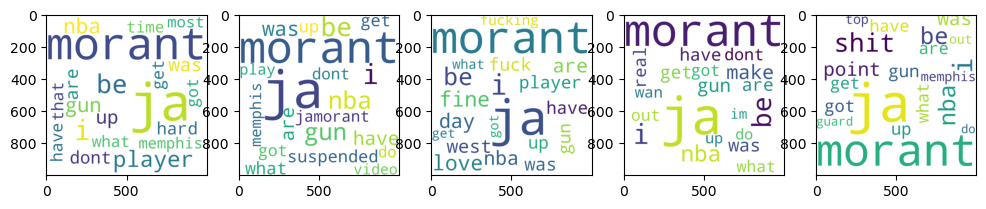

In [290]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_angry)
ax2.imshow(wc_fear)
ax3.imshow(wc_happy)
ax4.imshow(wc_sad)
ax5.imshow(wc_surprise)

As we can see word gun appeared in all emotion, which suggest, that there were some people, who defended Ja Morant after the incident. Let's see how emotions were chnaging in time.

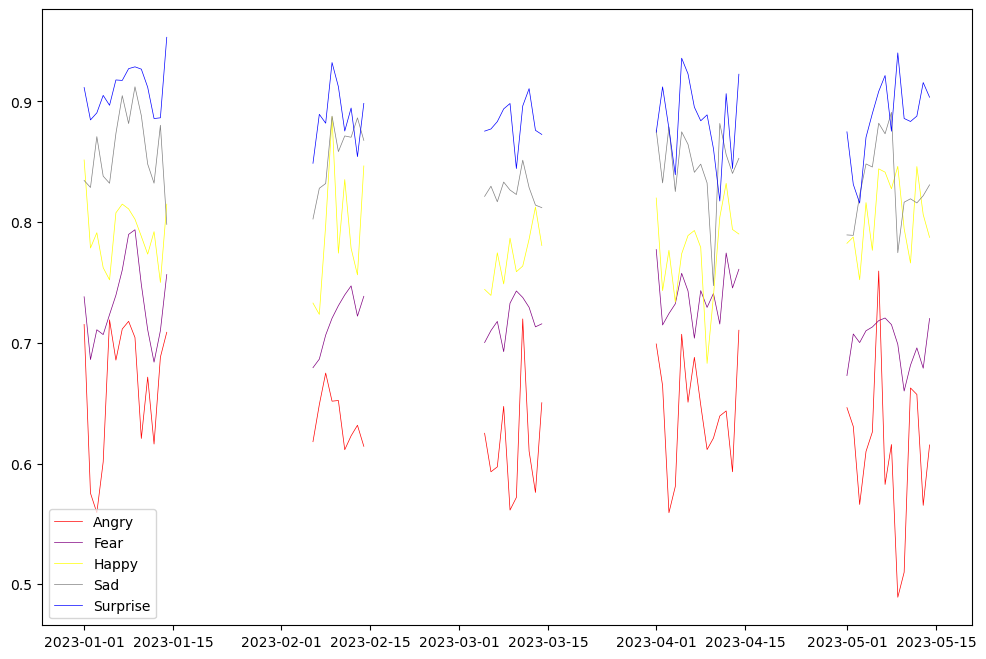

In [293]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_angry_grouped.index, df_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_fear_grouped.index, df_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_happy_grouped.index, df_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_sad_grouped.index, df_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_surprise_grouped.index, df_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

What is interesting, according to this plot, after the gun incident there wasn't any signifact change in level of angry emotions, which seem a little bit surprising. To be honest the difference, which ca be easily spot is lower level of happy emotion after the incident. To sum it up, in my opinion the more predictible and logical tendency could be seen in the section, in which I used nltk vader. One conclusion seem to be easy to draw - that it was much more harder for scrritp to detect basic emotions, than to classify if tweet is in general postive, negative, neutral or compound.

## 6.3 Analising first period ( from 2023-01-10 to 2023-01-15)

Just as in the previous section all plots will appear in the summary, which will make it easier to draw conclusions. I will have the same approach in each period.

In [299]:
mask1 = (df2['Datetime'] > '2023-01-01') &(df2['Datetime'] < '2023-01-15') # mask with condition for chossing tweets
df_p1 = df2[mask1]
df_p1

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.00,0.00,0.50,0.50,0.00,Happy,0.50
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
7,2023-01-14 23:48:33+00:00,1614409162091532290,game tonight vs rooting for and supporting,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
9,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.00,0.00,1.00,0.00,0.00,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
23284,2023-01-01 00:06:06+00:00,1609340150609334273,i gotta see ja morant play next year 💙,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
23285,2023-01-01 00:05:46+00:00,1609340066714771456,i felt the blog hit another gear with our post...,en,0.17,0.17,0.17,0.17,0.33,Surprise,0.33
23288,2023-01-01 00:01:33+00:00,1609339006596030465,❤️ 🏀 #1 ja morant fan in 🇺🇸! will the grizzlie...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
23289,2023-01-01 00:01:03+00:00,1609338878305136640,jordan poole is a better player as a starter t...,en,0.00,0.00,0.50,0.50,0.00,Happy,0.50


### 6.3.1 Angry tweets

In [300]:
df_p1_angry = df_p1[df_p1['Type'] == 'Angry']
df_p1_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
89,2023-01-14 22:20:17+00:00,1614386952257798146,coach you are absolute trash,en,0.50,0.50,0.00,0.0,0.0,Angry,0.50
93,2023-01-14 22:17:30+00:00,1614386248856002561,ja morant has scored 32 points or more in 4 of...,en,0.60,0.00,0.00,0.0,0.4,Angry,0.60
100,2023-01-14 22:08:48+00:00,1614384060595568645,3 of the last 4 nba most improved players won ...,en,0.33,0.33,0.33,0.0,0.0,Angry,0.33
142,2023-01-14 20:53:31+00:00,1614365114299486208,"thug? he’s a hard working coach’s son, gets to...",en,0.50,0.50,0.00,0.0,0.0,Angry,0.50
188,2023-01-14 19:52:54+00:00,1614349860953812992,this is so hard. just had the same experience ...,en,1.00,0.00,0.00,0.0,0.0,Angry,1.00
...,...,...,...,...,...,...,...,...,...,...,...
23178,2023-01-01 01:27:01+00:00,1609360511862472707,ja morant just got an and one despite not bein...,en,0.50,0.00,0.00,0.5,0.0,Angry,0.50
23203,2023-01-01 01:14:37+00:00,1609357390943592448,early fireworks. |,en,1.00,0.00,0.00,0.0,0.0,Angry,1.00
23229,2023-01-01 00:54:07+00:00,1609352233493184513,🏀ja morant is facing zion williamson on new ye...,en,1.00,0.00,0.00,0.0,0.0,Angry,1.00
23235,2023-01-01 00:50:47+00:00,1609351394708041732,"i forget how young these players are, listenin...",en,1.00,0.00,0.00,0.0,0.0,Angry,1.00


In [301]:
all_words_p1_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p1_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_p1_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p1_angry[word] = all_words_p1_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [302]:
wc_p1_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p1_angry)

In [303]:
df_p1_angry_grouped = df_p1_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p1_angry_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.715256
2023-01-02 00:00:00+00:00,0.575437
2023-01-03 00:00:00+00:00,0.559259
2023-01-04 00:00:00+00:00,0.601346
2023-01-05 00:00:00+00:00,0.719036
2023-01-06 00:00:00+00:00,0.685673
2023-01-07 00:00:00+00:00,0.711461
2023-01-08 00:00:00+00:00,0.717812
2023-01-09 00:00:00+00:00,0.704412


### 6.3.2 Fear tweets

In [304]:
df_p1_fear = df_p1[df_p1['Type'] == 'Fear']
df_p1_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
7,2023-01-14 23:48:33+00:00,1614409162091532290,game tonight vs rooting for and supporting,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
12,2023-01-14 23:43:40+00:00,1614407933135147008,update #nba #nbatwitter game : mem vs. ind gri...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
24,2023-01-14 23:37:28+00:00,1614406374531760129,update #nba #nbatwitter starting lineup : mem ...,en,0.00,0.50,0.50,0.00,0.00,Fear,0.50
28,2023-01-14 23:34:47+00:00,1614405698472878085,first #nba game for both of us. came to see #j...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
29,2023-01-14 23:32:21+00:00,1614405086490271744,yea ts on deebo was crazy def should be a fine...,en,0.00,0.50,0.25,0.00,0.25,Fear,0.50
...,...,...,...,...,...,...,...,...,...,...,...
23260,2023-01-01 00:25:22+00:00,1609344998981378049,got my working on my nye party getup to go out...,en,0.00,0.33,0.33,0.00,0.33,Fear,0.33
23261,2023-01-01 00:23:35+00:00,1609344550115360768,ja morant scored 52 points and had the game of...,en,0.25,0.38,0.12,0.00,0.25,Fear,0.38
23278,2023-01-01 00:09:44+00:00,1609341062581043200,i have stuffed myself with bbq until i’m about...,en,0.20,0.40,0.20,0.00,0.20,Fear,0.40
23279,2023-01-01 00:08:56+00:00,1609340863213101056,why got limitless takeoff irl plus his build i...,en,0.00,0.67,0.00,0.33,0.00,Fear,0.67


In [305]:
all_words_p1_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p1_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_p1_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p1_fear[word] = all_words_p1_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [306]:
wc_p1_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p1_fear)

In [307]:
df_p1_fear_grouped = df_p1_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p1_fear_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.738189
2023-01-02 00:00:00+00:00,0.686114
2023-01-03 00:00:00+00:00,0.710830
2023-01-04 00:00:00+00:00,0.706842
2023-01-05 00:00:00+00:00,0.723426
2023-01-06 00:00:00+00:00,0.739429
2023-01-07 00:00:00+00:00,0.760298
2023-01-08 00:00:00+00:00,0.789832
2023-01-09 00:00:00+00:00,0.793676


### 6.3.3 Happy tweets

In [308]:
df_p1_happy = df_p1[df_p1['Type'] == 'Happy']
df_p1_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
3,2023-01-14 23:55:09+00:00,1614410823883001856,you're a truly good man . way to make it right...,en,0.00,0.00,0.50,0.5,0.00,Happy,0.50
9,2023-01-14 23:45:51+00:00,1614408484061343744,way to show love!,en,0.00,0.00,1.00,0.0,0.00,Happy,1.00
15,2023-01-14 23:40:28+00:00,1614407128512331776,shai is going to go to the free throw line mor...,en,0.00,0.20,0.40,0.2,0.20,Happy,0.40
23,2023-01-14 23:37:30+00:00,1614406380693102593,update #nba #nbatwitter game : mem vs. ind gri...,en,0.00,0.00,1.00,0.0,0.00,Happy,1.00
45,2023-01-14 23:09:37+00:00,1614399363576639489,ready to see our favorite racer,en,0.00,0.00,1.00,0.0,0.00,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
23256,2023-01-01 00:29:27+00:00,1609346024686129160,ok i think i should win. no i don’t have a swa...,en,0.14,0.29,0.43,0.0,0.14,Happy,0.43
23272,2023-01-01 00:16:09+00:00,1609342679258927105,yeah let’s free a violent criminal. sounds legit!,en,0.00,0.00,0.50,0.5,0.00,Happy,0.50
23274,2023-01-01 00:12:57+00:00,1609341873558294528,are ja morant and the grizzlies ready to take ...,en,0.00,0.00,1.00,0.0,0.00,Happy,1.00
23275,2023-01-01 00:10:45+00:00,1609341321738866688,happy new year eve 🎊❤️,en,0.00,0.00,1.00,0.0,0.00,Happy,1.00


In [309]:
all_words_p1_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p1_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_p1_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p1_happy[word] = all_words_p1_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [310]:
wc_p1_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p1_happy)

In [311]:
df_p1_happy_grouped = df_p1_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p1_happy_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.851538
2023-01-02 00:00:00+00:00,0.778561
2023-01-03 00:00:00+00:00,0.791230
2023-01-04 00:00:00+00:00,0.762262
2023-01-05 00:00:00+00:00,0.752167
2023-01-06 00:00:00+00:00,0.807703
2023-01-07 00:00:00+00:00,0.814924
2023-01-08 00:00:00+00:00,0.810946
2023-01-09 00:00:00+00:00,0.802444


### 6.3.4 Sad tweets

In [312]:
df_p1_sad = df_p1[df_p1['Type'] == 'Sad']
df_p1_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
0,2023-01-14 23:59:19+00:00,1614411874761641989,showtime!! 🏀 at grizzlies starters: ja morant ...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
26,2023-01-14 23:35:17+00:00,1614405825912799233,"don’t shoot me for saying this, but i don’t be...",en,0.2,0.0,0.2,0.4,0.2,Sad,0.4
64,2023-01-14 22:47:03+00:00,1614393688142094337,i’ve learned more about ja morant than i ever ...,en,0.0,0.0,0.0,0.5,0.5,Sad,0.5
77,2023-01-14 22:32:42+00:00,1614390076527759360,did not know suns legend isaiah canaan went to...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
80,2023-01-14 22:30:06+00:00,1614389422857781248,top draftkings nba dfs picks for jan 14: 1. lu...,en,0.0,0.0,0.0,0.5,0.5,Sad,0.5
...,...,...,...,...,...,...,...,...,...,...,...
23195,2023-01-01 01:18:15+00:00,1609358308179066881,ja morant with his passing since charles barkl...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
23237,2023-01-01 00:49:00+00:00,1609350944059453440,couldn't resist making it myself! and you were...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
23255,2023-01-01 00:30:49+00:00,1609346370074480640,showtime!! 🏀 vs. grizzlies starters: ja morant...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
23280,2023-01-01 00:08:46+00:00,1609340819886034944,ok i’m triggered going into 2023! whoever made...,en,0.0,0.0,0.0,0.5,0.5,Sad,0.5


In [313]:
all_words_p1_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p1_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_p1_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p1_sad[word] = all_words_p1_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [314]:
wc_p1_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p1_sad)

In [315]:
df_p1_sad_grouped = df_p1_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p1_sad_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.834513
2023-01-02 00:00:00+00:00,0.828722
2023-01-03 00:00:00+00:00,0.870843
2023-01-04 00:00:00+00:00,0.838077
2023-01-05 00:00:00+00:00,0.832202
2023-01-06 00:00:00+00:00,0.873371
2023-01-07 00:00:00+00:00,0.904789
2023-01-08 00:00:00+00:00,0.881654
2023-01-09 00:00:00+00:00,0.912135


### 6.3.5 Surprise tweets

In [316]:
df_p1_surprise = df_p1[df_p1['Type'] == 'Surprise']
df_p1_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
6,2023-01-14 23:51:57+00:00,1614410019641987072,hey ja,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
11,2023-01-14 23:45:29+00:00,1614408393724416000,i want to see how he is able to move against e...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
27,2023-01-14 23:35:16+00:00,1614405820699054080,took my boy to see ja 🏀!! go grizzlies beat th...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
41,2023-01-14 23:15:43+00:00,1614400902244220936,nba props 📝 ja morant o28.5 points (-110) d’an...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
68,2023-01-14 22:39:54+00:00,1614391885220429827,new video: ja morant memphis grizzlies - we ar...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
...,...,...,...,...,...,...,...,...,...,...,...
23266,2023-01-01 00:19:48+00:00,1609343597429530625,ja morant top 3 finest nba players all time!,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
23271,2023-01-01 00:18:00+00:00,1609343146537664512,he better turn those alerts on so he can get t...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
23273,2023-01-01 00:15:40+00:00,1609342558877978624,2019 impeccable ja morant rookie signatures #w...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
23285,2023-01-01 00:05:46+00:00,1609340066714771456,i felt the blog hit another gear with our post...,en,0.17,0.17,0.17,0.17,0.33,Surprise,0.33


In [317]:
all_words_p1_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p1_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_p1_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p1_surprise[word] = all_words_p1_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [318]:
wc_p1_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p1_surprise)

In [319]:
df_p1_surprise_grouped = df_p1_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p1_surprise_grouped

,Score
Datetime,
2023-01-01 00:00:00+00:00,0.911545
2023-01-02 00:00:00+00:00,0.884667
2023-01-03 00:00:00+00:00,0.890515
2023-01-04 00:00:00+00:00,0.905000
2023-01-05 00:00:00+00:00,0.896786
2023-01-06 00:00:00+00:00,0.917784
2023-01-07 00:00:00+00:00,0.917398
2023-01-08 00:00:00+00:00,0.927143
2023-01-09 00:00:00+00:00,0.928654


### 6.3.6 Summary of first period

Text(0.5, 1.0, 'Surprise')

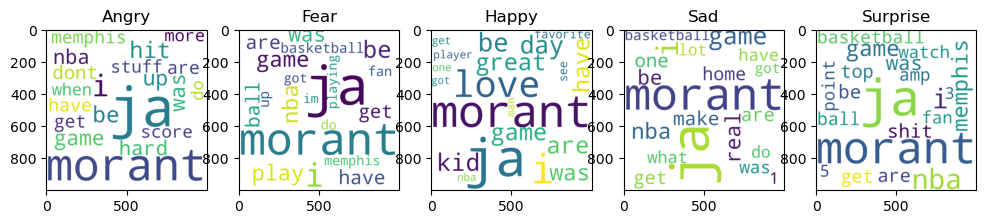

In [324]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_p1_angry)
ax1.set_title('Angry')
ax2.imshow(wc_p1_fear)
ax2.set_title('Fear')
ax3.imshow(wc_p1_happy)
ax3.set_title('Happy')
ax4.imshow(wc_p1_sad)
ax4.set_title('Sad')
ax5.imshow(wc_p1_surprise)
ax5.set_title('Surprise')

What can be easily spot is the fact, that most of the words appear in cloud for every emotion. We can spot the differnce. Maybe it will be easier in the third period, when the incident happened.

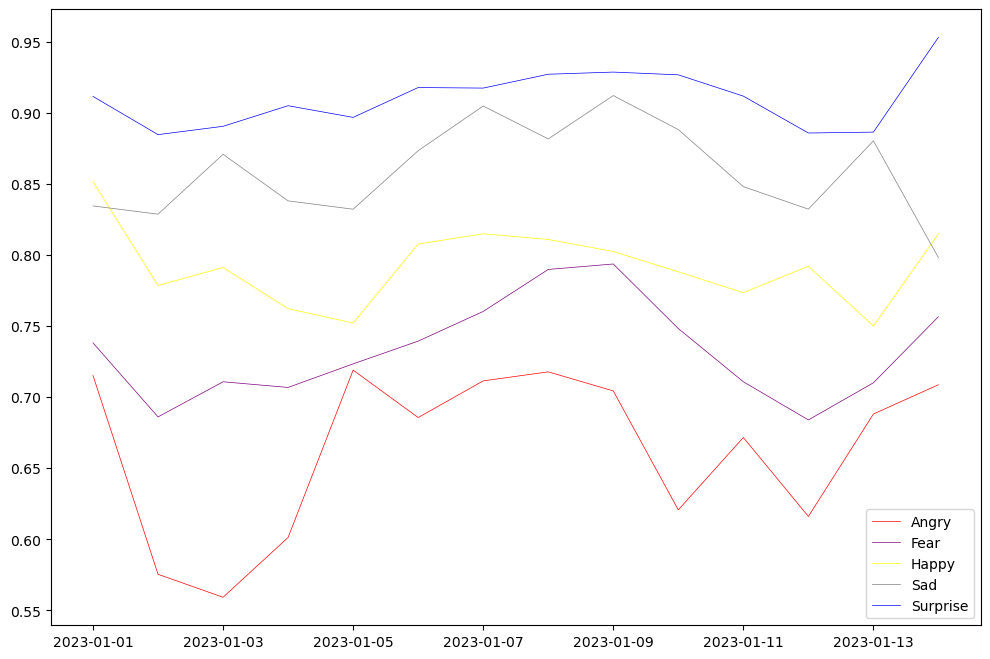

In [326]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_p1_angry_grouped.index, df_p1_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_p1_fear_grouped.index, df_p1_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_p1_happy_grouped.index, df_p1_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_p1_sad_grouped.index, df_p1_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_p1_surprise_grouped.index, df_p1_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

Nothing interesting happens here. We can see, that there was mix of every emotion in this period, which is normal during regular season. The surprise emotion has the highest score, which is also normal, as it is usually connected with some spectacular moves or play.  High level of the sad emotion could be connected wiht some misses or dissapointment with referees decisions. To sum it up, everything seems to be making sense.

## 6.4 Analising  second period ( from 2023-02-01 to 2023-02-15)

In [329]:
mask2 = (df2['Datetime'] > '2023-02-01') &(df2['Datetime'] < '2023-02-15') # mask with condition for chossing tweets
df_p2 = df2[mask2]
df_p2

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23291,2023-02-14 23:59:54+00:00,1625646041730060290,stop tryna portray as a “thug” or “gangsta” my...,en,0.00,1.0,0.00,0.00,0.00,Fear,1.00
23292,2023-02-14 23:56:05+00:00,1625645082312409089,damn clearly that man was hating.. 🌐🌎,en,0.00,0.0,0.00,1.00,0.00,Sad,1.00
23293,2023-02-14 23:44:39+00:00,1625642204894007297,the eagles are the suns or grizzlies of the nf...,en,0.00,0.5,0.25,0.25,0.00,Fear,0.50
23294,2023-02-14 23:43:39+00:00,1625641952849936384,no wonder ja morant be on demon time 24/7,en,0.00,0.0,0.00,0.00,1.00,Surprise,1.00
23296,2023-02-14 23:35:24+00:00,1625639879463014400,just traded for these two nice serials for ja ...,en,0.00,0.0,1.00,0.00,0.00,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
44172,2023-02-06 09:47:50+00:00,1622532512181526528,wanna be,en,0.00,0.0,0.00,1.00,0.00,Sad,1.00
44173,2023-02-06 09:45:45+00:00,1622531986362454017,brainwashed brat. somebody play ja morant the ...,en,0.00,1.0,0.00,0.00,0.00,Fear,1.00
44174,2023-02-06 09:40:39+00:00,1622530703996096514,people who are successful who don't carry them...,en,0.00,0.0,0.00,0.67,0.33,Sad,0.67
44177,2023-02-06 09:35:56+00:00,1622529517276348419,ibr they didn't ban your brother for a year fo...,en,0.00,0.0,0.00,0.60,0.40,Sad,0.60


### 6.4.1 Angry tweets

In [330]:
df_p2_angry = df_p2[df_p2['Type'] == 'Angry']
df_p2_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23297,2023-02-14 23:32:55+00:00,1625639253828063232,spitting out 1200 got me feelin like ja morant...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
23337,2023-02-14 22:27:00+00:00,1625622666156834817,there are shorter american athletes if a guy l...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
23363,2023-02-14 21:52:51+00:00,1625614072098988051,roses are red violets are blue dillon brooks i...,en,0.50,0.00,0.00,0.50,0.00,Angry,0.50
23370,2023-02-14 21:41:04+00:00,1625611106357239808,swarovski stones encrust ja morant’s #nikeja1 ...,en,0.50,0.00,0.00,0.00,0.50,Angry,0.50
23381,2023-02-14 21:29:21+00:00,1625608155903188992,&amp; carrying/traveling was called way more i...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
...,...,...,...,...,...,...,...,...,...,...,...
44091,2023-02-06 11:35:01+00:00,1622559482776805376,man shut up,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
44119,2023-02-06 10:50:51+00:00,1622548370014236673,bro sit down and stop acting hard man and play...,en,0.25,0.25,0.00,0.25,0.25,Angry,0.25
44144,2023-02-06 10:20:40+00:00,1622540774012506115,cappin cappin words like a 16 year old tik tok...,en,0.33,0.33,0.00,0.00,0.33,Angry,0.33
44151,2023-02-06 10:13:28+00:00,1622538963595702273,shut up and be fine!,en,0.50,0.00,0.50,0.00,0.00,Angry,0.50


In [331]:
all_words_p2_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p2_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_p2_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p2_angry[word] = all_words_p2_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [332]:
wc_p2_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p2_angry)

In [333]:
df_p2_angry_grouped = df_p2_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p2_angry_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.618084
2023-02-07 00:00:00+00:00,0.648799
2023-02-08 00:00:00+00:00,0.674966
2023-02-09 00:00:00+00:00,0.651660
2023-02-10 00:00:00+00:00,0.652222
2023-02-11 00:00:00+00:00,0.611455
2023-02-12 00:00:00+00:00,0.622958
2023-02-13 00:00:00+00:00,0.631714
2023-02-14 00:00:00+00:00,0.614250


### 6.4.2 Fear tweets

In [334]:
df_p2_fear = df_p2[df_p2['Type'] == 'Fear']
df_p2_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23291,2023-02-14 23:59:54+00:00,1625646041730060290,stop tryna portray as a “thug” or “gangsta” my...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
23293,2023-02-14 23:44:39+00:00,1625642204894007297,the eagles are the suns or grizzlies of the nf...,en,0.0,0.5,0.25,0.25,0.0,Fear,0.5
23298,2023-02-14 23:31:39+00:00,1625638936130342914,i’m open to offers and trades for ja morant,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
23311,2023-02-14 23:10:54+00:00,1625633714062368771,ja morant played 1 more game than bam and won ...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
23312,2023-02-14 23:07:11+00:00,1625632778074177538,2019 nba hoops premium stock silver laser rc j...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
...,...,...,...,...,...,...,...,...,...,...,...
44150,2023-02-06 10:14:30+00:00,1622539221184696321,head up king you the man lessgo memphis,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
44155,2023-02-06 10:06:43+00:00,1622537264050892801,report: nba investigated scary postgame incide...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
44160,2023-02-06 09:58:30+00:00,1622535195520909313,report: pacers' travel party members threatene...,en,0.0,1.0,0.00,0.00,0.0,Fear,1.0
44161,2023-02-06 09:58:02+00:00,1622535079728668672,your vertical is amazing but your grammar need...,en,0.0,0.5,0.00,0.00,0.5,Fear,0.5


In [335]:
all_words_p2_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p2_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_p2_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p2_fear[word] = all_words_p2_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [336]:
wc_p2_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p2_fear)

In [337]:
df_p2_fear_grouped = df_p2_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p2_fear_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.679410
2023-02-07 00:00:00+00:00,0.686521
2023-02-08 00:00:00+00:00,0.706430
2023-02-09 00:00:00+00:00,0.720339
2023-02-10 00:00:00+00:00,0.730795
2023-02-11 00:00:00+00:00,0.739707
2023-02-12 00:00:00+00:00,0.747172
2023-02-13 00:00:00+00:00,0.722091
2023-02-14 00:00:00+00:00,0.738547


### 6.4.3 Happy tweets

In [338]:
df_p2_happy = df_p2[df_p2['Type'] == 'Happy']
df_p2_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23296,2023-02-14 23:35:24+00:00,1625639879463014400,just traded for these two nice serials for ja ...,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
23301,2023-02-14 23:26:25+00:00,1625637619219439621,ja morant 2019-20 national treasures jumbo rel...,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
23313,2023-02-14 23:07:10+00:00,1625632773716205568,i love steven adams and ja morant together,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
23327,2023-02-14 22:44:51+00:00,1625627157488697345,happy valentines day to my valentine 😘🥰😍,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
23341,2023-02-14 22:22:10+00:00,1625621448646615041,upgraded my tix today for the boys the day of ...,en,0.0,0.25,0.75,0.00,0.00,Happy,0.75
...,...,...,...,...,...,...,...,...,...,...,...
44126,2023-02-06 10:39:04+00:00,1622545403999649793,‘it’s free to see how your friends and family ...,en,0.0,0.00,0.67,0.00,0.33,Happy,0.67
44132,2023-02-06 10:34:10+00:00,1622544169515237376,"fr get that man's out of her, man's gonna fuck...",en,0.0,0.00,0.50,0.50,0.00,Happy,0.50
44142,2023-02-06 10:21:04+00:00,1622540876416172032,most nba champions are black men. they win.,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
44152,2023-02-06 10:10:06+00:00,1622538113846239232,i love you man. but please for the love of mem...,en,0.0,0.00,0.50,0.25,0.25,Happy,0.50


In [339]:
all_words_p2_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p2_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_p2_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p2_happy[word] = all_words_p2_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [340]:
wc_p2_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p2_happy)

In [341]:
df_p2_happy_grouped = df_p2_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p2_happy_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.732955
2023-02-07 00:00:00+00:00,0.723548
2023-02-08 00:00:00+00:00,0.797515
2023-02-09 00:00:00+00:00,0.887260
2023-02-10 00:00:00+00:00,0.774309
2023-02-11 00:00:00+00:00,0.835281
2023-02-12 00:00:00+00:00,0.778333
2023-02-13 00:00:00+00:00,0.756279
2023-02-14 00:00:00+00:00,0.846591


### 6.4.4 Sad tweets

In [342]:
df_p2_sad = df_p2[df_p2['Type'] == 'Sad']
df_p2_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23292,2023-02-14 23:56:05+00:00,1625645082312409089,damn clearly that man was hating.. 🌐🌎,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
23306,2023-02-14 23:18:10+00:00,1625635541914906625,"clear the way for the mvp ja morant #ps5share,...",en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
23321,2023-02-14 22:52:19+00:00,1625629034808848384,'every setback is a setup for a comeback . god...,en,0.0,0.00,0.00,0.50,0.50,Sad,0.50
23331,2023-02-14 22:37:05+00:00,1625625201827364865,where does jalen brunson rank amongst point gu...,en,0.0,0.00,0.00,0.50,0.50,Sad,0.50
23395,2023-02-14 20:53:42+00:00,1625599186539544576,30.5 — jayson tatum 30.2 — lebron james 29.7 —...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
...,...,...,...,...,...,...,...,...,...,...,...
44167,2023-02-06 09:50:17+00:00,1622533127011811328,do me a favor and search “ja morant” on twitte...,en,0.0,0.25,0.25,0.50,0.00,Sad,0.50
44171,2023-02-06 09:48:33+00:00,1622532690686738436,entertaining this drama is weird if you’re a f...,en,0.0,0.33,0.00,0.67,0.00,Sad,0.67
44172,2023-02-06 09:47:50+00:00,1622532512181526528,wanna be,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
44174,2023-02-06 09:40:39+00:00,1622530703996096514,people who are successful who don't carry them...,en,0.0,0.00,0.00,0.67,0.33,Sad,0.67


In [343]:
all_words_p2_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p2_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_p2_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p2_sad[word] = all_words_p2_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [344]:
wc_p2_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p2_sad)

In [345]:
df_p2_sad_grouped = df_p2_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p2_sad_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.802580
2023-02-07 00:00:00+00:00,0.828047
2023-02-08 00:00:00+00:00,0.831981
2023-02-09 00:00:00+00:00,0.887806
2023-02-10 00:00:00+00:00,0.858429
2023-02-11 00:00:00+00:00,0.871413
2023-02-12 00:00:00+00:00,0.870301
2023-02-13 00:00:00+00:00,0.886400
2023-02-14 00:00:00+00:00,0.867708


### 6.4.5 Surprise tweets

In [346]:
df_p2_surprise = df_p2[df_p2['Type'] == 'Surprise']
df_p2_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
23294,2023-02-14 23:43:39+00:00,1625641952849936384,no wonder ja morant be on demon time 24/7,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
23377,2023-02-14 21:33:32+00:00,1625609207750729734,sneaker news:swarovski stones encrust ja moran...,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
23420,2023-02-14 19:49:24+00:00,1625583004872499208,tomorrow is a dream come true!! i won floor se...,en,0.0,0.0,0.33,0.00,0.67,Surprise,0.67
23425,2023-02-14 19:45:08+00:00,1625581929549422597,i wonder what ja morant doing today😭,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
23453,2023-02-14 18:52:43+00:00,1625568736638865434,devin booker rudy gobert ja morant le magic mo...,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
...,...,...,...,...,...,...,...,...,...,...,...
44071,2023-02-06 11:55:35+00:00,1622564662481981440,at first i thought the ja morant street shit h...,en,0.2,0.0,0.20,0.20,0.40,Surprise,0.40
44087,2023-02-06 11:38:24+00:00,1622560334794969088,you might be the biggest clown on this app. no...,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
44106,2023-02-06 11:11:33+00:00,1622553578819960841,shit corny coming from an nba player,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00
44156,2023-02-06 10:05:47+00:00,1622537027018457088,should have aimed at warriors maybe then you c...,en,0.0,0.0,0.00,0.00,1.00,Surprise,1.00


In [347]:
all_words_p2_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p2_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_p2_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p2_surprise[word] = all_words_p2_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [348]:
wc_p2_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p2_surprise)

In [349]:
df_p2_surprise_grouped = df_p2_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p2_surprise_grouped

,Score
Datetime,
2023-02-06 00:00:00+00:00,0.848722
2023-02-07 00:00:00+00:00,0.889315
2023-02-08 00:00:00+00:00,0.881959
2023-02-09 00:00:00+00:00,0.932215
2023-02-10 00:00:00+00:00,0.912169
2023-02-11 00:00:00+00:00,0.875446
2023-02-12 00:00:00+00:00,0.894553
2023-02-13 00:00:00+00:00,0.854242
2023-02-14 00:00:00+00:00,0.898387


### 6.4.6 Summary of second period

Text(0.5, 1.0, 'Surprise')

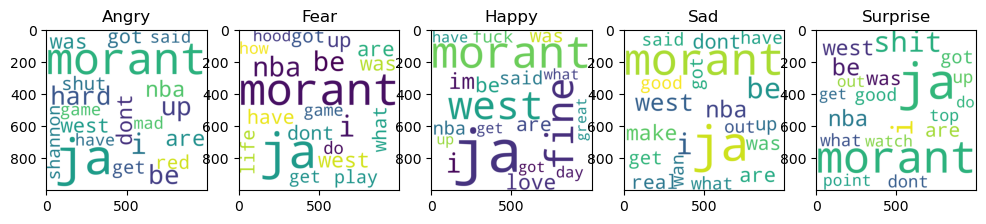

In [350]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_p2_angry)
ax1.set_title('Angry')
ax2.imshow(wc_p2_fear)
ax2.set_title('Fear')
ax3.imshow(wc_p2_happy)
ax3.set_title('Happy')
ax4.imshow(wc_p2_sad)
ax4.set_title('Sad')
ax5.imshow(wc_p2_surprise)
ax5.set_title('Surprise')

Here we can see, that in the cloud for angry emotions some stronger words appeared. What is more here it can be seen that there are not so many similar words in each emotion, which might indicate, that here emotions were detected a little bit better.

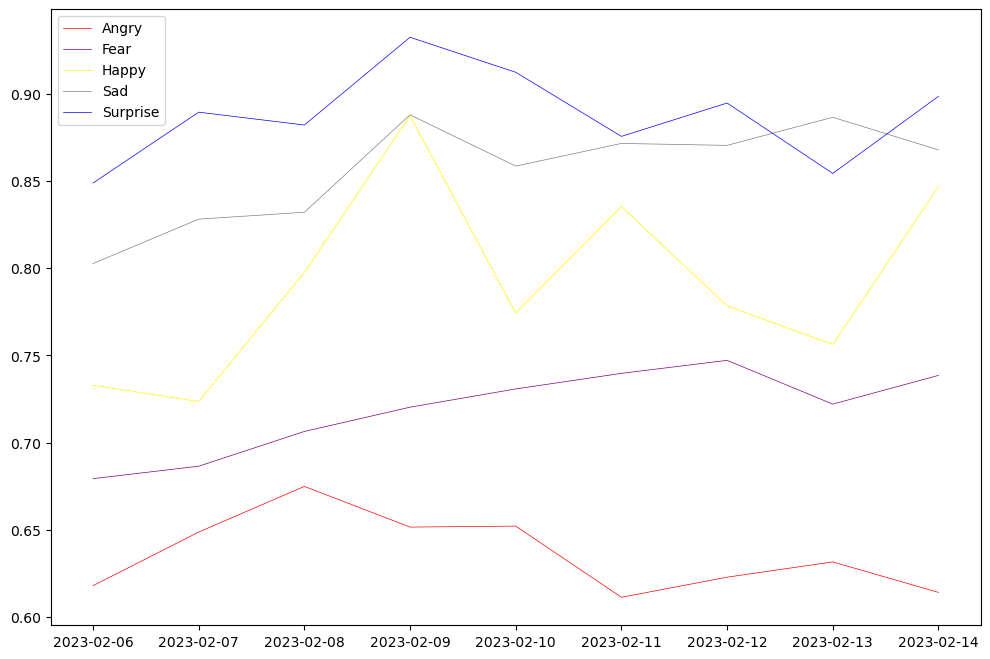

In [351]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_p2_angry_grouped.index, df_p2_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_p2_fear_grouped.index, df_p2_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_p2_happy_grouped.index, df_p2_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_p2_sad_grouped.index, df_p2_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_p2_surprise_grouped.index, df_p2_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

Just as in the first period level of each emotoins make sens. Slight increasing or decreasinf in level of each emotions could be connected with some spectacular actions, but nothing more.

## 6.5 Analising third period (from 2023-03-01 to 2023-03-15)

In this period the gun incident happened. I wonder if it will be easy to spot in the words clouds and leveles changes in time.

In [352]:
mask3 = (df2['Datetime'] > '2023-03-01') &(df2['Datetime'] < '2023-03-15') # mask with condition for chossing tweets
df_p3 = df2[mask3]
df_p3

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44184,2023-03-14 23:57:04+00:00,1635792190927503360,"the memphis grizzlies, playing without superst...",en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
44185,2023-03-14 23:55:36+00:00,1635791821249937413,oh thank you! it's been bothering me for weeks...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
44186,2023-03-14 23:55:03+00:00,1635791683844739072,paul george sends strong message to grizzlies'...,en,0.00,0.33,0.33,0.00,0.33,Fear,0.33
44188,2023-03-14 23:53:53+00:00,1635791391438651392,ja morant when he comes back he’s gonna comeba...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
44189,2023-03-14 23:53:52+00:00,1635791387177394176,props to nba star ja morant for going to alcoh...,en,0.00,0.71,0.00,0.14,0.14,Fear,0.71
...,...,...,...,...,...,...,...,...,...,...,...
94176,2023-03-05 00:41:52+00:00,1632179585008771075,get some class ja morant. memphis already has ...,en,0.00,0.50,0.00,0.25,0.25,Fear,0.50
94177,2023-03-05 00:41:44+00:00,1632179553211932673,"honestly, ja morant should be in jail not on t...",en,0.00,0.83,0.00,0.00,0.17,Fear,0.83
94178,2023-03-05 00:41:34+00:00,1632179511637803008,crazy to think about the and did you dirty com...,en,0.33,0.67,0.00,0.00,0.00,Fear,0.67
94179,2023-03-05 00:41:32+00:00,1632179501823082499,what ja morant do. why everybody talking bout ...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00


### 6.5.1 Angry tweets

In [354]:
df_p3_angry = df_p3[df_p3['Type'] == 'Angry']
df_p3_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44227,2023-03-14 23:31:20+00:00,1635785715530252291,“ja morant will continue to remain away from t...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
44228,2023-03-14 23:31:07+00:00,1635785660698116097,something good always comes out of something b...,en,0.33,0.33,0.33,0.00,0.00,Angry,0.33
44248,2023-03-14 23:20:48+00:00,1635783062662402050,ja morant dunked on this man so hard lol😂,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
44261,2023-03-14 23:11:44+00:00,1635780782407966720,swara bhasker takes a brutal dig at the ‘boyco...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
44276,2023-03-14 23:00:25+00:00,1635777935255928832,the dilemma!!! man this must be a difficult de...,en,0.50,0.50,0.00,0.00,0.00,Angry,0.50
...,...,...,...,...,...,...,...,...,...,...,...
94095,2023-03-05 00:45:16+00:00,1632180441297080322,it can go from ja morant to aaron hernandez re...,en,0.50,0.00,0.00,0.50,0.00,Angry,0.50
94100,2023-03-05 00:44:54+00:00,1632180349081120768,two cautionary words for ja morant- aaron hern...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
94113,2023-03-05 00:44:23+00:00,1632180220139831297,wow!! best platform to show how entitled these...,en,0.33,0.33,0.00,0.00,0.33,Angry,0.33
94117,2023-03-05 00:44:12+00:00,1632180172915986432,he brandished in a nightclub. that’s not the s...,en,0.33,0.33,0.00,0.33,0.00,Angry,0.33


In [355]:
all_words_p3_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p3_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_p3_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p3_angry[word] = all_words_p3_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [356]:
wc_p3_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p3_angry)

In [357]:
df_p3_angry_grouped = df_p3_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p3_angry_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.625089
2023-03-06 00:00:00+00:00,0.593167
2023-03-07 00:00:00+00:00,0.597241
2023-03-08 00:00:00+00:00,0.647381
2023-03-09 00:00:00+00:00,0.561461
2023-03-10 00:00:00+00:00,0.571912
2023-03-11 00:00:00+00:00,0.719815
2023-03-12 00:00:00+00:00,0.610268
2023-03-13 00:00:00+00:00,0.576019


### 6.5.2 Fear tweets

In [358]:
df_p3_fear = df_p3[df_p3['Type'] == 'Fear']
df_p3_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44184,2023-03-14 23:57:04+00:00,1635792190927503360,"the memphis grizzlies, playing without superst...",en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
44186,2023-03-14 23:55:03+00:00,1635791683844739072,paul george sends strong message to grizzlies'...,en,0.00,0.33,0.33,0.00,0.33,Fear,0.33
44189,2023-03-14 23:53:52+00:00,1635791387177394176,props to nba star ja morant for going to alcoh...,en,0.00,0.71,0.00,0.14,0.14,Fear,0.71
44194,2023-03-14 23:48:35+00:00,1635790056257380353,notice how cj gardner-johnson is actually from...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
44197,2023-03-14 23:45:55+00:00,1635789384221065216,dr. suess counseling ja morant do not wave you...,en,0.00,0.67,0.00,0.00,0.33,Fear,0.67
...,...,...,...,...,...,...,...,...,...,...,...
94171,2023-03-05 00:42:05+00:00,1632179640532910083,ja morant returning to the nba after being sus...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
94174,2023-03-05 00:41:54+00:00,1632179596211679232,ja morant the day he gets suspended indefinite...,en,0.00,0.50,0.50,0.00,0.00,Fear,0.50
94176,2023-03-05 00:41:52+00:00,1632179585008771075,get some class ja morant. memphis already has ...,en,0.00,0.50,0.00,0.25,0.25,Fear,0.50
94177,2023-03-05 00:41:44+00:00,1632179553211932673,"honestly, ja morant should be in jail not on t...",en,0.00,0.83,0.00,0.00,0.17,Fear,0.83


In [359]:
all_words_p3_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p3_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_p3_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p3_fear[word] = all_words_p3_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [360]:
wc_p3_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p3_fear)

In [361]:
df_p3_fear_grouped = df_p3_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p3_fear_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.700219
2023-03-06 00:00:00+00:00,0.710150
2023-03-07 00:00:00+00:00,0.717739
2023-03-08 00:00:00+00:00,0.692696
2023-03-09 00:00:00+00:00,0.732840
2023-03-10 00:00:00+00:00,0.742971
2023-03-11 00:00:00+00:00,0.737586
2023-03-12 00:00:00+00:00,0.729397
2023-03-13 00:00:00+00:00,0.713242


### 6.5.3 Happy tweets

In [362]:
df_p3_happy = df_p3[df_p3['Type'] == 'Happy']
df_p3_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44196,2023-03-14 23:47:11+00:00,1635789705001222148,nothing cool about ja morant,en,0.0,0.0,1.00,0.00,0.00,Happy,1.00
44205,2023-03-14 23:41:36+00:00,1635788297854230528,smriti kalra remembers satish kaushik: my last...,en,0.0,0.0,0.50,0.50,0.00,Happy,0.50
44209,2023-03-14 23:41:23+00:00,1635788242933915653,ja morant being sober in the club with no shir...,en,0.0,0.0,0.33,0.33,0.33,Happy,0.33
44215,2023-03-14 23:39:19+00:00,1635787725285769217,"paul george on his advice to ja morant: ""he's ...",en,0.0,0.0,1.00,0.00,0.00,Happy,1.00
44216,2023-03-14 23:39:12+00:00,1635787693492957185,"paul george on his advice to ja morant: ""he's ...",en,0.0,0.0,1.00,0.00,0.00,Happy,1.00
...,...,...,...,...,...,...,...,...,...,...,...
94124,2023-03-05 00:44:05+00:00,1632180144180805634,ja morant is soooo fine,en,0.0,0.0,1.00,0.00,0.00,Happy,1.00
94128,2023-03-05 00:43:52+00:00,1632180088178622466,my boy is trying his best to get out of this l...,en,0.0,0.0,0.50,0.50,0.00,Happy,0.50
94142,2023-03-05 00:43:11+00:00,1632179917713715200,ja morant when he successfully makes it out th...,en,0.0,0.0,0.50,0.50,0.00,Happy,0.50
94149,2023-03-05 00:42:59+00:00,1632179867960713223,luka is never gonna post no shit like that bec...,en,0.0,0.0,0.50,0.00,0.50,Happy,0.50


In [363]:
all_words_p3_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p3_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_p3_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p3_happy[word] = all_words_p3_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [364]:
wc_p3_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p3_happy)

In [365]:
df_p3_happy_grouped = df_p3_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p3_happy_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.744269
2023-03-06 00:00:00+00:00,0.739290
2023-03-07 00:00:00+00:00,0.774575
2023-03-08 00:00:00+00:00,0.748789
2023-03-09 00:00:00+00:00,0.786765
2023-03-10 00:00:00+00:00,0.758915
2023-03-11 00:00:00+00:00,0.763592
2023-03-12 00:00:00+00:00,0.785909
2023-03-13 00:00:00+00:00,0.812500


### 6.5.4 Sad tweets

In [366]:
df_p3_sad = df_p3[df_p3['Type'] == 'Sad']
df_p3_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44185,2023-03-14 23:55:36+00:00,1635791821249937413,oh thank you! it's been bothering me for weeks...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
44188,2023-03-14 23:53:53+00:00,1635791391438651392,ja morant when he comes back he’s gonna comeba...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
44192,2023-03-14 23:49:44+00:00,1635790344020164609,i just showed my mama ja morant … i might have...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
44202,2023-03-14 23:42:27+00:00,1635788512749318145,the #mentalhealth of #jamorant is #moreimporta...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
44203,2023-03-14 23:42:17+00:00,1635788469246017536,we got ja morant on our team and we're talking...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
...,...,...,...,...,...,...,...,...,...,...,...
94141,2023-03-05 00:43:11+00:00,1632179919815069696,"ja morant! you’re young, a multimillionaire, a...",en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
94156,2023-03-05 00:42:41+00:00,1632179793918566402,ja morant could ruin everything via,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
94169,2023-03-05 00:42:09+00:00,1632179657352306688,surround yourself with positive ppl. also... i...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0
94179,2023-03-05 00:41:32+00:00,1632179501823082499,what ja morant do. why everybody talking bout ...,en,0.0,0.0,0.0,1.0,0.0,Sad,1.0


In [367]:
all_words_p3_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p3_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_p3_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p3_sad[word] = all_words_p3_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [368]:
wc_p3_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p3_sad)

In [369]:
df_p3_sad_grouped = df_p3_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p3_sad_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.821311
2023-03-06 00:00:00+00:00,0.829741
2023-03-07 00:00:00+00:00,0.816856
2023-03-08 00:00:00+00:00,0.833191
2023-03-09 00:00:00+00:00,0.826602
2023-03-10 00:00:00+00:00,0.822868
2023-03-11 00:00:00+00:00,0.851320
2023-03-12 00:00:00+00:00,0.828628
2023-03-13 00:00:00+00:00,0.814111


### 6.5.5 Surprise tweets

In [370]:
df_p3_surprise = df_p3[df_p3['Type'] == 'Surprise']
df_p3_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
44235,2023-03-14 23:28:32+00:00,1635785009796710402,watch out ja morant aint the only one with it ...,en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
44239,2023-03-14 23:27:24+00:00,1635784725208899585,adam silver callin ja morant and tell on him h...,en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
44266,2023-03-14 23:08:00+00:00,1635779842879930369,“i’m a fan of pg. i don’t know where the hate ...,en,0.0,0.00,0.00,0.33,0.67,Surprise,0.67
44267,2023-03-14 23:07:44+00:00,1635779776626450433,"hour 4; some news on ja morant, more doppelgan...",en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
44272,2023-03-14 23:03:11+00:00,1635778631715700737,when is ja morant coming back,en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
...,...,...,...,...,...,...,...,...,...,...,...
94094,2023-03-05 00:45:16+00:00,1632180443003887617,ja morant be having insignificant scandals lat...,en,0.0,0.00,0.25,0.25,0.50,Surprise,0.50
94098,2023-03-05 00:44:55+00:00,1632180354529329159,turn your tvs on nba tv at 7 pm ct/8 pm et. yo...,en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
94106,2023-03-05 00:44:44+00:00,1632180306282201088,if your aunt had a dick she’d be your uncle… j...,en,0.0,0.00,0.00,0.00,1.00,Surprise,1.00
94126,2023-03-05 00:44:02+00:00,1632180130847096836,some of the comments i’m reading on here just ...,en,0.0,0.33,0.00,0.00,0.67,Surprise,0.67


In [371]:
all_words_p3_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p3_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_p3_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p3_surprise[word] = all_words_p3_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [372]:
wc_p3_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p3_surprise)

In [373]:
df_p3_surprise_grouped = df_p3_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p3_surprise_grouped

,Score
Datetime,
2023-03-05 00:00:00+00:00,0.875383
2023-03-06 00:00:00+00:00,0.877178
2023-03-07 00:00:00+00:00,0.883257
2023-03-08 00:00:00+00:00,0.893801
2023-03-09 00:00:00+00:00,0.898277
2023-03-10 00:00:00+00:00,0.844367
2023-03-11 00:00:00+00:00,0.896241
2023-03-12 00:00:00+00:00,0.910595
2023-03-13 00:00:00+00:00,0.876050


### 6.5.6 Summary of third period

Text(0.5, 1.0, 'Surprise')

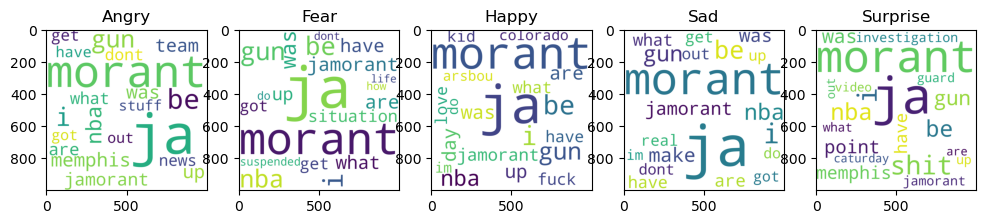

In [374]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_p3_angry)
ax1.set_title('Angry')
ax2.imshow(wc_p3_fear)
ax2.set_title('Fear')
ax3.imshow(wc_p3_happy)
ax3.set_title('Happy')
ax4.imshow(wc_p3_sad)
ax4.set_title('Sad')
ax5.imshow(wc_p3_surprise)
ax5.set_title('Surprise')

This time, we can see, that especially in this negative emotions many words connected with incident appeared. It can be easily seen, tht in this period this was really hot topic. Let's see, how it affected levels of emotions.

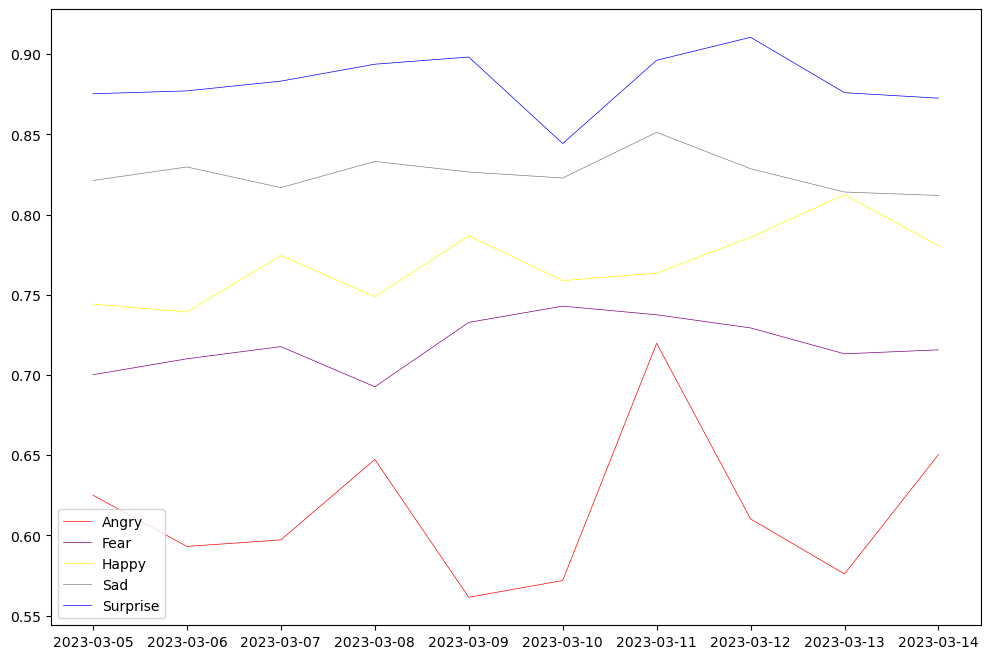

In [375]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_p3_angry_grouped.index, df_p3_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_p3_fear_grouped.index, df_p3_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_p3_happy_grouped.index, df_p3_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_p3_sad_grouped.index, df_p3_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_p3_surprise_grouped.index, df_p3_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

I must say, that tis plot is really shocking to me. I was expecting that level of angry emotion would rocket after the incident. But according to this plot, it lokks like nothing really happened. This could be coinnected with the fact, that people have tendency to quickly forget, but this could also be sign, that emotions were detected correctly.

## 6.6 Analising fourth period (from 2023-04-01 to 2023-04-15)

In [376]:
mask4 = (df2['Datetime'] > '2023-04-01') &(df2['Datetime'] < '2023-04-15') # mask with condition for chossing tweets
df_p4 = df2[mask4]
df_p4

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94184,2023-04-14 23:58:38+00:00,1647026607310385152,a cavs-grizzlies nba finals will be insane 🔥 🔥...,en,0.00,0.33,0.33,0.00,0.33,Fear,0.33
94185,2023-04-14 23:58:28+00:00,1647026566658945025,u stay classy 🤦‍♂️,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
94189,2023-04-14 23:56:28+00:00,1647026063657009155,all prison first team ja morant mikey williams...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
94193,2023-04-14 23:55:03+00:00,1647025706021576705,what a joke.... garbage... nike be sponsoring ...,en,0.50,0.00,0.50,0.00,0.00,Angry,0.50
94194,2023-04-14 23:54:58+00:00,1647025685125554177,"darvin ham said the lakers will use ""a lot of ...",en,0.25,0.25,0.00,0.50,0.00,Sad,0.50
...,...,...,...,...,...,...,...,...,...,...,...
110378,2023-04-01 00:09:46+00:00,1641955981247623168,russ absolutely torched ja morant last game,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
110379,2023-04-01 00:09:36+00:00,1641955937610002432,“machine gun” b. miller says he’s going to the...,en,0.00,0.40,0.20,0.40,0.00,Fear,0.40
110380,2023-04-01 00:05:25+00:00,1641954884269359105,pregame preview: memphis vs. la clippers #fwb ...,en,0.00,0.50,0.00,0.33,0.17,Fear,0.50
110381,2023-04-01 00:04:46+00:00,1641954723585564672,quick positive ev bet from - ja morant over 7....,en,0.50,0.50,0.00,0.00,0.00,Angry,0.50


### 6.6.1 Angry tweets

In [377]:
df_p4_angry = df_p4[df_p4['Type'] == 'Angry']
df_p4_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94185,2023-04-14 23:58:28+00:00,1647026566658945025,u stay classy 🤦‍♂️,en,1.00,0.00,0.0,0.00,0.00,Angry,1.00
94193,2023-04-14 23:55:03+00:00,1647025706021576705,what a joke.... garbage... nike be sponsoring ...,en,0.50,0.00,0.5,0.00,0.00,Angry,0.50
94197,2023-04-14 23:52:52+00:00,1647025158010404866,colored and #’d- (teal not numbered.) (siakam ...,en,0.33,0.33,0.0,0.33,0.00,Angry,0.33
94226,2023-04-14 23:39:54+00:00,1647021895806509065,forgot to put ja morant as an option,en,0.50,0.00,0.0,0.50,0.00,Angry,0.50
94253,2023-04-14 23:21:52+00:00,1647017355774492674,mikey williams wanted to one-up ja morant but ...,en,1.00,0.00,0.0,0.00,0.00,Angry,1.00
...,...,...,...,...,...,...,...,...,...,...,...
110326,2023-04-01 00:57:57+00:00,1641968107261394947,all i know abt ja morant is that he makin ngs ...,en,1.00,0.00,0.0,0.00,0.00,Angry,1.00
110339,2023-04-01 00:47:08+00:00,1641965386030624768,trae young and ja morant combine for 4 fantasy...,en,0.33,0.00,0.0,0.33,0.33,Angry,0.33
110354,2023-04-01 00:34:35+00:00,1641962227090505729,ja morant meds have taken away his aggressive ...,en,0.33,0.33,0.0,0.33,0.00,Angry,0.33
110381,2023-04-01 00:04:46+00:00,1641954723585564672,quick positive ev bet from - ja morant over 7....,en,0.50,0.50,0.0,0.00,0.00,Angry,0.50


In [378]:
all_words_p4_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p4_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_p4_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p4_angry[word] = all_words_p4_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [379]:
wc_p4_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p4_angry)

In [380]:
df_p4_angry_grouped = df_p4_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p4_angry_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.699091
2023-04-02 00:00:00+00:00,0.664493
2023-04-03 00:00:00+00:00,0.559250
2023-04-04 00:00:00+00:00,0.581000
2023-04-05 00:00:00+00:00,0.707123
2023-04-06 00:00:00+00:00,0.650769
2023-04-07 00:00:00+00:00,0.688000
2023-04-08 00:00:00+00:00,0.648485
2023-04-09 00:00:00+00:00,0.611579


### 6.6.2 Fear tweets

In [381]:
df_p4_fear = df_p4[df_p4['Type'] == 'Fear']
df_p4_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94184,2023-04-14 23:58:38+00:00,1647026607310385152,a cavs-grizzlies nba finals will be insane 🔥 🔥...,en,0.00,0.33,0.33,0.00,0.33,Fear,0.33
94189,2023-04-14 23:56:28+00:00,1647026063657009155,all prison first team ja morant mikey williams...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
94195,2023-04-14 23:54:46+00:00,1647025636882497545,definitely an ode to that statement. as ja mor...,en,0.25,0.50,0.00,0.25,0.00,Fear,0.50
94196,2023-04-14 23:53:23+00:00,1647025287392100355,ja morant &amp; payton pritchard won it over w...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
94202,2023-04-14 23:50:31+00:00,1647024567502905345,ja morant about to get cooked. austin reaves a...,en,0.00,0.33,0.00,0.33,0.33,Fear,0.33
...,...,...,...,...,...,...,...,...,...,...,...
110374,2023-04-01 00:18:00+00:00,1641958051606306817,pete and brevin: “ja morant with the 360 spin!...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
110375,2023-04-01 00:16:47+00:00,1641957746332319744,ja morant in the building,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
110378,2023-04-01 00:09:46+00:00,1641955981247623168,russ absolutely torched ja morant last game,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
110379,2023-04-01 00:09:36+00:00,1641955937610002432,“machine gun” b. miller says he’s going to the...,en,0.00,0.40,0.20,0.40,0.00,Fear,0.40


In [382]:
all_words_p4_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p4_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_p4_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p4_fear[word] = all_words_p4_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [383]:
wc_p4_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p4_fear)

In [384]:
df_p4_fear_grouped = df_p4_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p4_fear_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.777317
2023-04-02 00:00:00+00:00,0.714778
2023-04-03 00:00:00+00:00,0.724254
2023-04-04 00:00:00+00:00,0.732316
2023-04-05 00:00:00+00:00,0.757617
2023-04-06 00:00:00+00:00,0.742923
2023-04-07 00:00:00+00:00,0.703846
2023-04-08 00:00:00+00:00,0.743278
2023-04-09 00:00:00+00:00,0.729359


### 6.6.3 Happy tweets

In [385]:
df_p4_happy = df_p4[df_p4['Type'] == 'Happy']
df_p4_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94209,2023-04-14 23:48:09+00:00,1647023972331012101,"we clowned ja morant, n this kid been gettin n...",en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
94241,2023-04-14 23:29:28+00:00,1647019269551685632,mikey williams: gets charged with assault with...,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
94249,2023-04-14 23:24:29+00:00,1647018013986529282,"""interesting take by on ja morant vs. anthony ...",en,0.0,0.25,0.50,0.00,0.25,Happy,0.50
94261,2023-04-14 23:19:13+00:00,1647016690507730945,top 10 playoff performers this postseason in m...,en,0.0,0.00,0.33,0.33,0.33,Happy,0.33
94299,2023-04-14 23:00:18+00:00,1647011930417291264,"bro, she makes my art look like a joke ong 💀💀",en,0.0,0.00,0.50,0.50,0.00,Happy,0.50
...,...,...,...,...,...,...,...,...,...,...,...
110290,2023-04-01 01:12:52+00:00,1641971860001681410,my team has ja morant and ngl david roddy and ...,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
110291,2023-04-01 01:12:44+00:00,1641971825532911616,lock the fuck in,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
110300,2023-04-01 01:08:16+00:00,1641970702638088195,not a great half for ja morant.,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00
110315,2023-04-01 01:04:17+00:00,1641969700593881089,ja morant gets generous whistles. never been a...,en,0.0,0.00,1.00,0.00,0.00,Happy,1.00


In [386]:
all_words_p4_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p4_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_p4_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p4_happy[word] = all_words_p4_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [387]:
wc_p4_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p4_happy)

In [388]:
df_p4_happy_grouped = df_p4_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p4_happy_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.820000
2023-04-02 00:00:00+00:00,0.743208
2023-04-03 00:00:00+00:00,0.776667
2023-04-04 00:00:00+00:00,0.733793
2023-04-05 00:00:00+00:00,0.773784
2023-04-06 00:00:00+00:00,0.788876
2023-04-07 00:00:00+00:00,0.793065
2023-04-08 00:00:00+00:00,0.779011
2023-04-09 00:00:00+00:00,0.682979


### 6.6.4 Sad tweets

In [389]:
df_p4_sad = df_p4[df_p4['Type'] == 'Sad']
df_p4_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94194,2023-04-14 23:54:58+00:00,1647025685125554177,"darvin ham said the lakers will use ""a lot of ...",en,0.25,0.25,0.00,0.50,0.00,Sad,0.50
94200,2023-04-14 23:51:31+00:00,1647024818640887817,one of my colleagues made this!! 💙💙 #whoopthat...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
94201,2023-04-14 23:51:11+00:00,1647024736113704964,"mikey williams wanna be ja morant so badly, wh...",en,0.00,0.00,0.33,0.67,0.00,Sad,0.67
94217,2023-04-14 23:43:36+00:00,1647022825893494788,you so fake #carryon you was just on memphis b...,en,0.17,0.00,0.00,0.50,0.33,Sad,0.50
94218,2023-04-14 23:43:35+00:00,1647022821061668865,u put austin reaves on ja morant and the laker...,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
...,...,...,...,...,...,...,...,...,...,...,...
110322,2023-04-01 00:59:23+00:00,1641968465274720256,"it’ll be a parade inside my kitchen, yaaaah 🥰",en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
110332,2023-04-01 00:49:54+00:00,1641966078526980096,dey go hate on regardless now tell me ima lyin😒,en,0.00,0.00,0.00,1.00,0.00,Sad,1.00
110335,2023-04-01 00:48:38+00:00,1641965760145772545,my mama so funny 😂 i show this lady the ja mor...,en,0.00,0.00,0.00,0.50,0.50,Sad,0.50
110351,2023-04-01 00:38:23+00:00,1641963183526092801,"good, youre back! plz follow, im boring but a ...",en,0.00,0.00,0.00,1.00,0.00,Sad,1.00


In [390]:
all_words_p4_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p4_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_p4_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p4_sad[word] = all_words_p4_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [391]:
wc_p4_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p4_sad)

In [392]:
df_p4_sad_grouped = df_p4_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p4_sad_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.876143
2023-04-02 00:00:00+00:00,0.832477
2023-04-03 00:00:00+00:00,0.878986
2023-04-04 00:00:00+00:00,0.825316
2023-04-05 00:00:00+00:00,0.874815
2023-04-06 00:00:00+00:00,0.864435
2023-04-07 00:00:00+00:00,0.841262
2023-04-08 00:00:00+00:00,0.848031
2023-04-09 00:00:00+00:00,0.832436


### 6.6.5 Surprise tweets

In [393]:
df_p4_surprise = df_p4[df_p4['Type'] == 'Surprise']
df_p4_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
94230,2023-04-14 23:38:29+00:00,1647021538372206592,i want to see ja morant hair when it gets long...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
94268,2023-04-14 23:14:18+00:00,1647015450893512707,"um, only ppl u follow or mention can reply.. #...",en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
94288,2023-04-14 23:05:30+00:00,1647013238872109062,that mikey williams shit is called the “ja mor...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
94312,2023-04-14 22:53:44+00:00,1647010278226403329,no godamn way…. bri thinks he’s ja morant😭,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
94348,2023-04-14 22:38:11+00:00,1647006363740938247,hey buy a mirror,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
...,...,...,...,...,...,...,...,...,...,...,...
110306,2023-04-01 01:06:35+00:00,1641970279856365568,imagine being dunked on by a memphis player th...,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
110327,2023-04-01 00:57:15+00:00,1641967928210780163,omg roooddddddyyyyy 😭😭,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
110333,2023-04-01 00:49:53+00:00,1641966074978529286,tell me who fuxkin wit my dawg 💯💪🏾‼️🏆🤝,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0
110353,2023-04-01 00:35:20+00:00,1641962416375250945,hey we want you to win man. let’s go!,en,0.0,0.0,0.0,0.0,1.0,Surprise,1.0


In [394]:
all_words_p4_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p4_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_p4_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p4_surprise[word] = all_words_p4_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [395]:
wc_p4_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p4_surprise)

In [396]:
df_p4_surprise_grouped = df_p4_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p4_surprise_grouped

,Score
Datetime,
2023-04-01 00:00:00+00:00,0.874490
2023-04-02 00:00:00+00:00,0.912073
2023-04-03 00:00:00+00:00,0.877436
2023-04-04 00:00:00+00:00,0.839189
2023-04-05 00:00:00+00:00,0.935824
2023-04-06 00:00:00+00:00,0.922807
2023-04-07 00:00:00+00:00,0.895250
2023-04-08 00:00:00+00:00,0.883952
2023-04-09 00:00:00+00:00,0.888868


### 6.6.6 Summary of fourth period

Text(0.5, 1.0, 'Surprise')

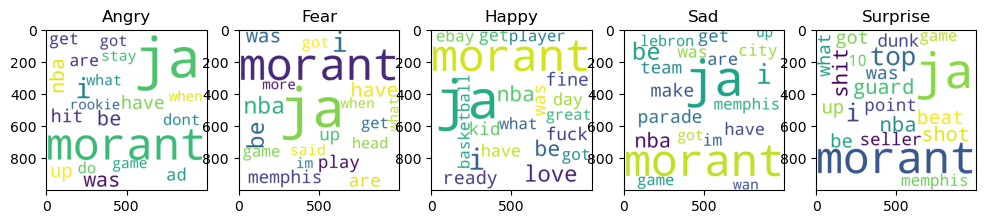

In [397]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_p4_angry)
ax1.set_title('Angry')
ax2.imshow(wc_p4_fear)
ax2.set_title('Fear')
ax3.imshow(wc_p4_happy)
ax3.set_title('Happy')
ax4.imshow(wc_p4_sad)
ax4.set_title('Sad')
ax5.imshow(wc_p4_surprise)
ax5.set_title('Surprise')

In words clouds only common and expected words appear. Just normal tweets during and after games.

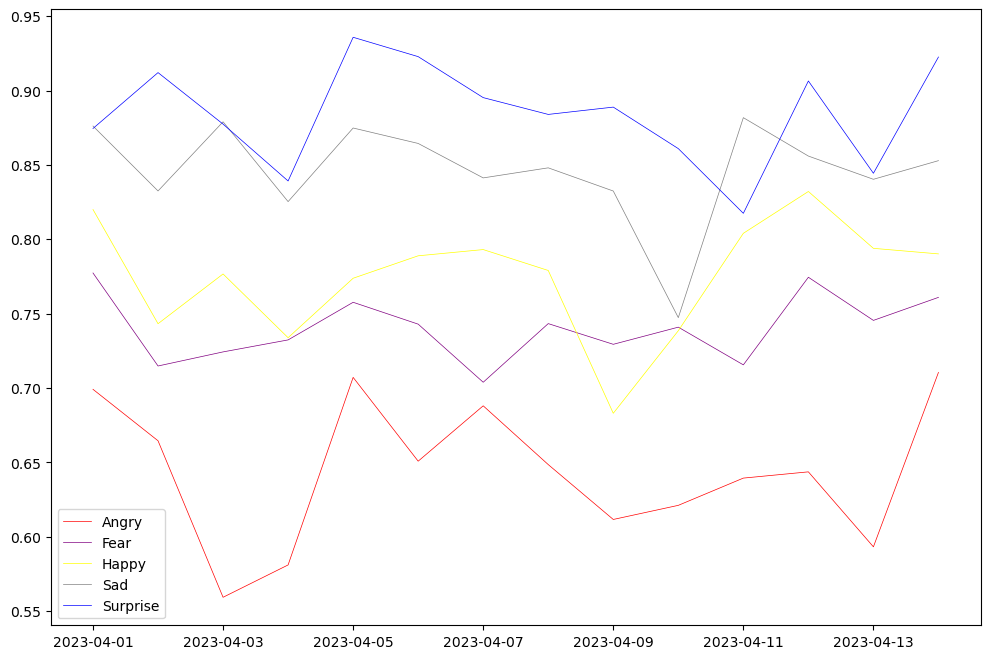

In [398]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_p4_angry_grouped.index, df_p4_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_p4_fear_grouped.index, df_p4_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_p4_happy_grouped.index, df_p4_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_p4_sad_grouped.index, df_p4_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_p4_surprise_grouped.index, df_p4_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

We can see some level of happy and sad emotions had a little down in one moment, but this could be connected wiht some special event . However, to be honest, I expected such deacrese of happines level after the gun incident, but none of such thing happened.

## 6.7 Analasing fifth period (from 2023-05-01 to 2023-05-15)

At the end of last period another gun incidetn happend. Let's see, if this can be seen in the emotions of tweets.

In [425]:
mask5 = (df2['Datetime'] > '2023-05-01') &(df2['Datetime'] < '2023-05-15') # mask with condition for chossing tweets
df_p5 = df2[mask5]
df_p5

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110384,2023-05-14 23:59:52+00:00,1657898556420771842,ja morant seriously grow up. you got hof poten...,en,0.25,0.50,0.00,0.25,0.00,Fear,0.50
110385,2023-05-14 23:59:51+00:00,1657898552637509633,i have a 8 year old son who’s watching you fam...,en,0.00,0.00,0.50,0.00,0.50,Happy,0.50
110386,2023-05-14 23:59:49+00:00,1657898542986395651,people gotta stop blaming ja morant's friend t...,en,0.00,0.20,0.20,0.20,0.40,Surprise,0.40
110388,2023-05-14 23:59:37+00:00,1657898493778722816,"i'm thinking, a gangsta be a gangsta! f the nb...",en,0.00,0.75,0.00,0.00,0.25,Fear,0.75
110389,2023-05-14 23:59:36+00:00,1657898487617404928,are you struggling to create a powerpoint pres...,en,0.00,0.25,0.00,0.50,0.25,Sad,0.50
...,...,...,...,...,...,...,...,...,...,...,...
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.00,0.00,0.00,0.00,1.00,Surprise,1.00
159993,2023-05-01 00:08:20+00:00,1652827254206898177,i’m bout to go in food iion and i see this lil...,en,0.00,0.50,0.00,0.50,0.00,Fear,0.50
159994,2023-05-01 00:06:52+00:00,1652826885632720896,"felt exactly the same way, fox is a fucking be...",en,0.00,0.00,0.33,0.67,0.00,Sad,0.67


### 6.7.1 Angry tweets

In [426]:
df_p5_angry = df_p5[df_p5['Type'] == 'Angry']
df_p5_angry

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110413,2023-05-14 23:58:08+00:00,1657898118950551552,ja morant for any slight inconvenience:,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
110415,2023-05-14 23:58:05+00:00,1657898106678132738,i wish ppl would understand that the ja morant...,en,1.00,0.00,0.00,0.00,0.00,Angry,1.00
110450,2023-05-14 23:55:57+00:00,1657897571098951680,ja morant new movie “before i self destruct” #...,en,0.50,0.50,0.00,0.00,0.00,Angry,0.50
110452,2023-05-14 23:55:53+00:00,1657897551687761922,the nba black listed gilbert arenas from the l...,en,0.50,0.25,0.25,0.00,0.00,Angry,0.50
110478,2023-05-14 23:54:15+00:00,1657897143737229314,ja’s homeboy a real one for moving the phone a...,en,0.25,0.25,0.00,0.25,0.25,Angry,0.25
...,...,...,...,...,...,...,...,...,...,...,...
159905,2023-05-01 02:28:16+00:00,1652862470946713600,ja morant's stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159911,2023-05-01 02:23:54+00:00,1652861371950718976,ja morant’s stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159912,2023-05-01 02:23:51+00:00,1652861359598567424,ja morant's stern promise amid trash talk comi...,en,0.33,0.00,0.00,0.33,0.33,Angry,0.33
159918,2023-05-01 02:04:14+00:00,1652856421182996482,i think d'angelo russell and austin reaves are...,en,0.50,0.00,0.00,0.00,0.50,Angry,0.50


In [427]:
all_words_p5_angry = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p5_angry.index:
    sentence = re.sub(r'[^\w\s]', '', df_p5_angry.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p5_angry[word] = all_words_p5_angry.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [428]:
wc_p5_angry = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p5_angry)

In [429]:
df_p5_angry_grouped = df_p5_angry[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p5_angry_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.646333
2023-05-02 00:00:00+00:00,0.630694
2023-05-03 00:00:00+00:00,0.566078
2023-05-04 00:00:00+00:00,0.610000
2023-05-05 00:00:00+00:00,0.626129
2023-05-06 00:00:00+00:00,0.759474
2023-05-07 00:00:00+00:00,0.582667
2023-05-08 00:00:00+00:00,0.615789
2023-05-09 00:00:00+00:00,0.489206


### 6.7.2 Fear tweets

In [430]:
df_p5_fear = df_p5[df_p5['Type'] == 'Fear']
df_p5_fear

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110384,2023-05-14 23:59:52+00:00,1657898556420771842,ja morant seriously grow up. you got hof poten...,en,0.25,0.50,0.00,0.25,0.00,Fear,0.50
110388,2023-05-14 23:59:37+00:00,1657898493778722816,"i'm thinking, a gangsta be a gangsta! f the nb...",en,0.00,0.75,0.00,0.00,0.25,Fear,0.75
110391,2023-05-14 23:59:29+00:00,1657898459905810432,ja represents a predominantly black city and p...,en,0.00,0.40,0.20,0.20,0.20,Fear,0.40
110393,2023-05-14 23:59:25+00:00,1657898442448949248,ja morant 2’s go crazy.,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
110395,2023-05-14 23:59:23+00:00,1657898435411079169,there are several young students at the school...,en,0.00,0.33,0.33,0.33,0.00,Fear,0.33
...,...,...,...,...,...,...,...,...,...,...,...
159973,2023-05-01 00:42:29+00:00,1652835850462326784,jordan poole silver select 10 - $110 shipped j...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
159979,2023-05-01 00:29:00+00:00,1652832455773044736,hope you man understand why i was so vocal the...,en,0.00,0.25,0.25,0.25,0.25,Fear,0.25
159981,2023-05-01 00:25:30+00:00,1652831576596553728,you grizzles been talking for way to long trad...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00
159986,2023-05-01 00:19:05+00:00,1652829960980054017,jordan poole silver select 10 - $110 shipped a...,en,0.00,1.00,0.00,0.00,0.00,Fear,1.00


In [431]:
all_words_p5_fear = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p5_fear.index:
    sentence = re.sub(r'[^\w\s]', '', df_p5_fear.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p5_fear[word] = all_words_p5_fear.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [432]:
wc_p5_fear = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p5_fear)

In [433]:
df_p5_fear_grouped = df_p5_fear[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p5_fear_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.672883
2023-05-02 00:00:00+00:00,0.707333
2023-05-03 00:00:00+00:00,0.700219
2023-05-04 00:00:00+00:00,0.710000
2023-05-05 00:00:00+00:00,0.713130
2023-05-06 00:00:00+00:00,0.718392
2023-05-07 00:00:00+00:00,0.720581
2023-05-08 00:00:00+00:00,0.715106
2023-05-09 00:00:00+00:00,0.698760


### 6.7.3 Happy tweets

In [434]:
df_p5_happy = df_p5[df_p5['Type'] == 'Happy']
df_p5_happy

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110385,2023-05-14 23:59:51+00:00,1657898552637509633,i have a 8 year old son who’s watching you fam...,en,0.00,0.00,0.5,0.00,0.50,Happy,0.5
110394,2023-05-14 23:59:23+00:00,1657898435507527682,i’ll tell you a joke but i’ll neva tell you a lie,en,0.00,0.00,1.0,0.00,0.00,Happy,1.0
110400,2023-05-14 23:59:01+00:00,1657898340376272896,"bro, you are not embrassed by people calling y...",en,0.00,0.00,0.5,0.50,0.00,Happy,0.5
110403,2023-05-14 23:58:35+00:00,1657898230699393036,"embiid tatum, sixers tatum sixers, james harde...",en,0.25,0.00,0.5,0.25,0.00,Happy,0.5
110432,2023-05-14 23:57:04+00:00,1657897848644550658,self sabotage for fake loyalty,en,0.00,0.00,0.5,0.50,0.00,Happy,0.5
...,...,...,...,...,...,...,...,...,...,...,...
159938,2023-05-01 01:27:44+00:00,1652847235879542786,from ja morant wilding out to dillon brooks ha...,en,0.00,0.00,0.5,0.50,0.00,Happy,0.5
159953,2023-05-01 01:08:29+00:00,1652842394604240899,i'll say this on golden state eliminating the ...,en,0.00,0.00,0.5,0.50,0.00,Happy,0.5
159964,2023-05-01 00:59:25+00:00,1652840112365944832,it will be interesting to see the matchups bec...,en,0.00,0.17,0.5,0.17,0.17,Happy,0.5
159966,2023-05-01 00:58:06+00:00,1652839779820511234,can’t believe i dreamt of ja morant some days ago,en,0.00,0.00,1.0,0.00,0.00,Happy,1.0


In [435]:
all_words_p5_happy = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p5_happy.index:
    sentence = re.sub(r'[^\w\s]', '', df_p5_happy.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p5_happy[word] = all_words_p5_happy.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [436]:
wc_p5_happy = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p5_happy)

In [437]:
df_p5_happy_grouped = df_p5_happy[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p5_happy_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.782439
2023-05-02 00:00:00+00:00,0.787662
2023-05-03 00:00:00+00:00,0.752222
2023-05-04 00:00:00+00:00,0.816200
2023-05-05 00:00:00+00:00,0.776596
2023-05-06 00:00:00+00:00,0.844133
2023-05-07 00:00:00+00:00,0.841395
2023-05-08 00:00:00+00:00,0.827576
2023-05-09 00:00:00+00:00,0.846197


### 6.7.4 Sad tweets

In [438]:
df_p5_sad = df_p5[df_p5['Type'] == 'Sad']
df_p5_sad

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110389,2023-05-14 23:59:36+00:00,1657898487617404928,are you struggling to create a powerpoint pres...,en,0.0,0.25,0.00,0.50,0.25,Sad,0.50
110392,2023-05-14 23:59:28+00:00,1657898454473928707,i wish the boondocks was still around so they ...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
110396,2023-05-14 23:59:10+00:00,1657898380750729216,thit tweet needs to be gased until the apologi...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
110398,2023-05-14 23:59:05+00:00,1657898359343181825,ja morant bro wtf u my idol and 2 months after...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
110401,2023-05-14 23:59:01+00:00,1657898340237950990,the ja morant memes have been so good today🤣 t...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
...,...,...,...,...,...,...,...,...,...,...,...
159950,2023-05-01 01:15:44+00:00,1652844219554209792,ja morant blames the wrong guy for the collaps...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00
159958,2023-05-01 01:06:10+00:00,1652841809478049793,the greatest offense in nba history with home ...,en,0.0,0.43,0.00,0.57,0.00,Sad,0.57
159959,2023-05-01 01:05:28+00:00,1652841634478936066,"i’m a fan of klay, but this version of him is ...",en,0.0,0.00,0.00,0.50,0.50,Sad,0.50
159971,2023-05-01 00:45:55+00:00,1652836713465618432,the emojis grizzlies paid dillon brooks made m...,en,0.0,0.00,0.00,1.00,0.00,Sad,1.00


In [439]:
all_words_p5_sad = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p5_sad.index:
    sentence = re.sub(r'[^\w\s]', '', df_p5_sad.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p5_sad[word] = all_words_p5_sad.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [440]:
wc_p5_sad = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p5_sad)

In [441]:
df_p5_sad_grouped = df_p5_sad[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p5_sad_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.789394
2023-05-02 00:00:00+00:00,0.789048
2023-05-03 00:00:00+00:00,0.822283
2023-05-04 00:00:00+00:00,0.848209
2023-05-05 00:00:00+00:00,0.845660
2023-05-06 00:00:00+00:00,0.881951
2023-05-07 00:00:00+00:00,0.873191
2023-05-08 00:00:00+00:00,0.891000
2023-05-09 00:00:00+00:00,0.774630


### 6.7.5 Surprise tweets

In [442]:
df_p5_surprise = df_p5[df_p5['Type'] == 'Surprise']
df_p5_surprise

,Datetime,Tweet Id,Text,Language,Angry,Fear,Happy,Sad,Surprise,Type,Score
110386,2023-05-14 23:59:49+00:00,1657898542986395651,people gotta stop blaming ja morant's friend t...,en,0.0,0.20,0.2,0.20,0.4,Surprise,0.4
110402,2023-05-14 23:58:54+00:00,1657898312152825857,honestly…. imagine how many times he did it bu...,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
110435,2023-05-14 23:56:55+00:00,1657897813429358592,since he don’t take himself seriously….. and i...,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
110462,2023-05-14 23:55:21+00:00,1657897420041191425,two things i learned today. ja morant is an id...,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
110518,2023-05-14 23:51:55+00:00,1657896553468575744,no ja morant would not be able to up hold the ...,en,0.0,0.25,0.0,0.25,0.5,Surprise,0.5
...,...,...,...,...,...,...,...,...,...,...,...
159972,2023-05-01 00:44:25+00:00,1652836337018449923,lmao? so ja morant isn't a fast guard?,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
159975,2023-05-01 00:35:24+00:00,1652834066008252420,"so u saying ja is better than curry?,bron? kd?...",en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
159983,2023-05-01 00:20:15+00:00,1652830255202316288,a variation on what i already heard but he is ...,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0
159988,2023-05-01 00:15:41+00:00,1652829106919153669,grizzlies' ja morant reveals new goals after l...,en,0.0,0.00,0.0,0.00,1.0,Surprise,1.0


In [443]:
all_words_p5_surprise = {}
to_remove = ['IN','PRP', 'CC', 'RB','MD', 'NNP', 'NNS','DT','TO','VBZ','PRP$'] # list with part of language which won't be useful in world cloud
for ix in df_p5_surprise.index:
    sentence = re.sub(r'[^\w\s]', '', df_p5_surprise.at[ix,'Text'])# removing all punctuation
    sentence = nltk.word_tokenize(sentence) # tokenizing sentence
    tagged = nltk.pos_tag(sentence) # getting list of tuples with word on first place and part of language is this word
    cleared_tags = []
    for i in tagged:
        if i[1] not in to_remove: # getting only words which won't disturb our work
            cleared_tags.append(i[0])
    for word in cleared_tags:
        all_words_p5_surprise[word] = all_words_p5_surprise.get(word,0) + 1 # getting value of key by using get(word,0) and increase it by one  

In [444]:
wc_p5_surprise = WordCloud(background_color="white",width=1000,height=1000, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(all_words_p5_surprise)

In [445]:
df_p5_surprise_grouped = df_p5_surprise[['Score','Datetime']].groupby(by=pd.Grouper(freq='D', key='Datetime')).mean()# getting mean score of each day
df_p5_surprise_grouped

,Score
Datetime,
2023-05-01 00:00:00+00:00,0.874815
2023-05-02 00:00:00+00:00,0.831270
2023-05-03 00:00:00+00:00,0.815778
2023-05-04 00:00:00+00:00,0.870244
2023-05-05 00:00:00+00:00,0.890000
2023-05-06 00:00:00+00:00,0.908308
2023-05-07 00:00:00+00:00,0.921463
2023-05-08 00:00:00+00:00,0.875278
2023-05-09 00:00:00+00:00,0.940238


### 6.7.6 Summary of fifth period

Text(0.5, 1.0, 'Surprise')

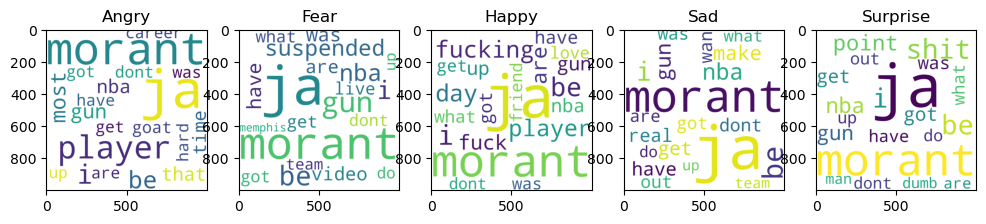

In [446]:
fig,((ax1,ax2,ax3, ax4, ax5)) = plt.subplots(1,5, figsize = (12,8))
ax1.imshow(wc_p5_angry)
ax1.set_title('Angry')
ax2.imshow(wc_p5_fear)
ax2.set_title('Fear')
ax3.imshow(wc_p5_happy)
ax3.set_title('Happy')
ax4.imshow(wc_p5_sad)
ax4.set_title('Sad')
ax5.imshow(wc_p5_surprise)
ax5.set_title('Surprise')

We can see, that there is sign of another gun incident in the words clouds. Word gun appeared in every cloud and another words such as suspended or carrier suggest, that this was also really hot topic back then.

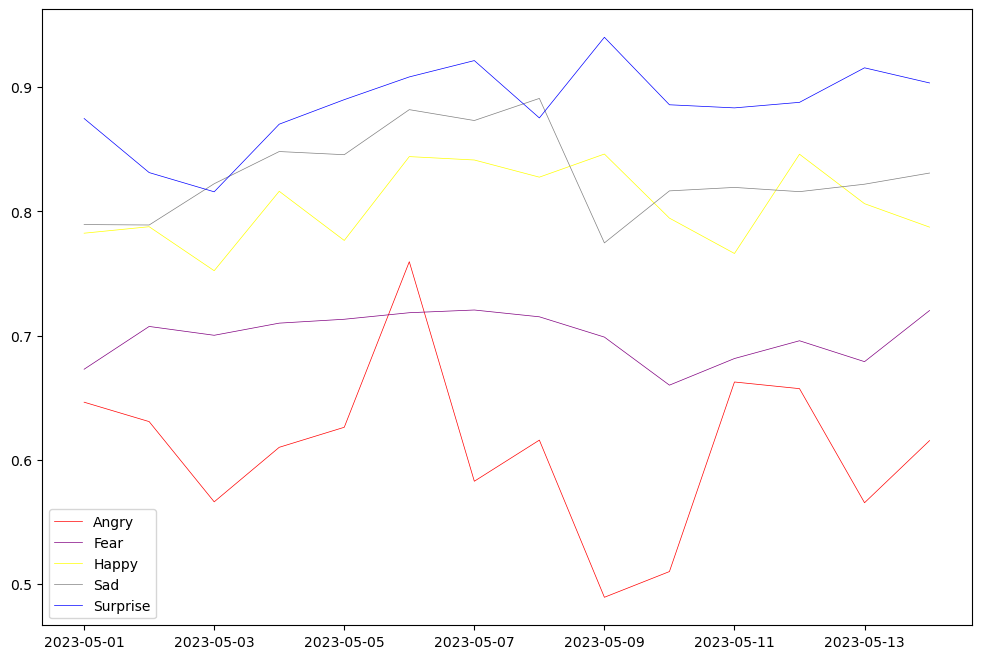

In [447]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(df_p5_angry_grouped.index, df_p5_angry_grouped['Score'], linewidth=0.5, color='red', label='Angry')
ax.plot(df_p5_fear_grouped.index, df_p5_fear_grouped['Score'], linewidth=0.5, color='purple', label='Fear')
ax.plot(df_p5_happy_grouped.index, df_p5_happy_grouped['Score'], linewidth=0.5, color='yellow', label='Happy')
ax.plot(df_p5_sad_grouped.index, df_p5_sad_grouped['Score'], linewidth=0.5, color='grey', label ='Sad')
ax.plot(df_p5_surprise_grouped.index, df_p5_surprise_grouped['Score'], linewidth=0.5, color='blue', label='Surprise')
ax.legend(loc='best')

Only one interesting tendency can be seen here, The level of the angry emotion rocket in one moment. But if you search the nba schedule, you will spot, that this happened after memphis rivarly team won the game, so mystery solved.

# 7. Summary of whole project

We saw that the gun incident was quite hot topic. What is more the first analises shows , that fame and being star of a nba team don't protect yout liability. On the other hand, people seem to quikly forget about such situation. When it comes to results and wokr of both of these packages I will say, that results of nltk vader  are more liable to me. Every expected tendecies were able to be spotted there and tim eof execution was quite good. The text2emotion package's time of execution was horrible. What is more it reuslt are sometimes a little bit weard and I am not sure if they are to be trusted. To sum it up, I would stick to nltk vader this time. 